In [2]:
# Install the required libraries
#!pip install pandas, geopandas, matplotlib, geopy, xarray, rioxarray, hvplot, netCDF4, scipy, folium, seaborn, salem, contextily, rasterio, upsetplot,
#scikit-learn, plotly, cartopy, colour, haversine, networkx, scikit-gstat

# Libraries

In [4]:
# Load the required libraries
from pathlib import Path
import matplotlib.pyplot as plt
import requests
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
import contextily as cx
import json
from matplotlib.patches import Patch
import numpy as np
import xarray as xr
import os
import rioxarray as rxr
import matplotlib.patches as mpatches
#from geopy.distance import geodesic
import salem
from salem import get_demo_file, DataLevels, GoogleVisibleMap, Map
import seaborn as sns
from shapely.geometry import LineString, Polygon
from tqdm import tqdm
import random
import rasterio
import matplotlib.colors as colors
from skgstat import Variogram
import rasterio
from rasterio.features import rasterize
import geopandas as gpd
import numpy as np
# import gc
# from shapely.geometry import MultiPolygon, Polygon
# from geopandas.tools import sjoin
# from rasterio.enums import Resampling
# import hvplot.xarray
# import scipy
# , Point, , MultiPolygon
# from shapely.geometry import mapping
import numpy as np
import xarray as xr
from shapely.geometry import Point
import numpy.ma as ma
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from shapely.geometry import Point
import numpy.ma as ma
from rasterio.transform import rowcol
from matplotlib.colors import LinearSegmentedColormap

# Functions

In [5]:
# Download the Lémanscope recorded data
def download_metadata():
    response = requests.get(
        "https://www.eyeonwater.org/api/observations?period=120&offset=0&limit=10000&sort=desc&bbox=46.20%2C6.14%2C46.53%2C6.94&bboxVersion=1.3.0")
    if response.status_code == 200:
        data = response.json()
    else:
        raise ValueError("Failed to collect Eye on Water data.")
    return data

In [6]:
# Flatten the nested structure automatically
def flatten_dict(d, parent_key='', sep='_'):
    items = []
    for k, v in d.items():
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict):
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)

In [7]:
# Search for specific keys that might contain CRS info
def search_keys(data, target_keys=['crs', 'srid', 'projection', 'coordinate_system', 'EPSG', 'coordinate', 'WGS84']):
    found = {}  
    def _search(obj, path=''):
        if isinstance(obj, dict):
            for k, v in obj.items():
                if k in target_keys:
                    found[path + '/' + k] = v
                _search(v, path + '/' + k)
        elif isinstance(obj, list):
            for i, item in enumerate(obj):
                _search(item, path + f'[{i}]')
                
    _search(data)
    return found

In [8]:
# Function to get datasets
def get_datasets(base_url):
    """Get list of available satellite data layers"""
    url = f"{base_url}"
    response = requests.get(url)
    response.raise_for_status()  # Will raise an exception for bad status codes
    return response.json()

In [9]:
# Get files for a specific dataset
def get_files_for_dataset(dataset_id):
    response = requests.get(f"{base_url}/files/{dataset_id}")
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error: {response.status_code}")
        return None

In [10]:
def download_tiff_file(url, output_path):
   """Download tiff file with error handling"""
   try:
       response = requests.get(url)
       response.raise_for_status()
       with open(output_path, 'wb') as f:
           f.write(response.content)
       return True
   except Exception as e:
       print(f"Error downloading file: {e}")
       return False

In [11]:
# Extract coordinates from geometry
def get_depth_at_point(point_geometry, bathymetry):
    lon, lat = point_geometry.x, point_geometry.y
    depth = bathymetry.sel(
        x=lon,
        y=lat,
        method='nearest'
    ).item()
    return depth

In [12]:
# Function to extract exterior coordinates of a Polygon or MultiPolygon
def get_exterior_coords(geometry):
    if geometry.type == "Polygon":
        return np.array(geometry.exterior.coords)
    elif geometry.type == "MultiPolygon":
        # Concatenate exterior coordinates from all polygons in the MultiPolygon
        return np.concatenate([np.array(p.exterior.coords) for p in geometry.geoms])

In [13]:
# Function to calculate the average spatial resolution
def calculate_resolution(polygon_array):
    resolution = []
    for polygon_coords in polygon_array:
        # Filter out padding zeros to get actual coordinates
        valid_coords = polygon_coords[~np.all(polygon_coords == 0, axis=1)]
        
        # Calculate distances between consecutive points
        distances = np.sqrt(np.sum(np.diff(valid_coords, axis=0)**2, axis=1))
        
        # Calculate the median distance (resolution) for the polygon
        resolution.append(np.median(distances) if len(distances) > 0 else 0)
    
    return np.array(resolution)

In [14]:
def find_extremal_points(multipolygon):
    """
    Find leftmost and rightmost points in a GeoPandas MultiPolygon.
    """
    coords = []
    for polygon in multipolygon.geoms:
        coords.extend(list(polygon.exterior.coords))
    
    if not coords:
        return None, None

    leftmost = coords[0]
    rightmost = coords[0]
    
    for point in coords:
        if point[0] < leftmost[0]:
            leftmost = point
        elif point[0] == leftmost[0] and point[1] > leftmost[1]:
            leftmost = point
            
        if point[0] > rightmost[0]:
            rightmost = point
        elif point[0] == rightmost[0] and point[1] > rightmost[1]:
            rightmost = point
            
    return leftmost, rightmost

In [15]:
# Download JSON data
def download_json(file_id):
    response = requests.get(f"{base_url}/json/{file_id}")
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error: {response.status_code}")
        return None

In [16]:
# Download NetCDF data
def download_netcdf(file_id, save_path=None):
    response = requests.get(f"{base_url}/nc/{file_id}")
    if response.status_code == 200:
        if save_path:
            # Save to file
            with open(save_path, 'wb') as f:
                f.write(response.content)
            # Open with xarray
            return xr.open_dataset(save_path)
        else:
            # Return content
            return response.content
    else:
        print(f"Error: {response.status_code}")
        return None

In [17]:
def plot_multipolygon_with_points(gdf, leftmost, rightmost):
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Plot the GeoDataFrame
    gdf.plot(ax=ax)
    
    # Plot extremal points
    ax.scatter(leftmost[0], leftmost[1], color='red', label='Leftmost', s=100)
    ax.scatter(rightmost[0], rightmost[1], color='blue', label='Rightmost', s=100)
    
    # Add legend
    ax.legend()
    
    # Add labels
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    return fig, ax

In [18]:
def split_shores(multipolygon, leftmost, rightmost):
    """
    Split shore into northern and southern parts between leftmost and rightmost points.
    """
    for polygon in multipolygon.geoms:
        coords = list(polygon.exterior.coords)
        if leftmost in coords and rightmost in coords:
            left_idx = coords.index(leftmost)
            right_idx = coords.index(rightmost)
            
            if left_idx < right_idx:
                path1 = coords[left_idx:right_idx + 1]
                path2 = coords[right_idx:] + coords[:left_idx + 1]
            else:
                path1 = coords[right_idx:left_idx + 1]
                path2 = coords[left_idx:] + coords[:right_idx + 1]
            
            path1_avg_lat = sum(p[1] for p in path1) / len(path1)
            path2_avg_lat = sum(p[1] for p in path2) / len(path2)
            
            if path1_avg_lat > path2_avg_lat:
                return path1, path2
            else:
                return path2, path1
    
    return None, None

In [19]:
def create_shore_lines(north_shore, south_shore):
    """Convert shore coordinates to LineString geometries in a GeoDataFrame"""
    from shapely.geometry import LineString
    import geopandas as gpd
    
    # Create LineStrings (using x,y coordinates only)
    north_line = LineString([(p[0], p[1]) for p in north_shore])
    south_line = LineString([(p[0], p[1]) for p in south_shore])
    
    # Create GeoDataFrame
    shore_gdf = gpd.GeoDataFrame(
        {'name': ['North Shore', 'South Shore'],
         'geometry': [north_line, south_line]},
        crs=gdf.crs
    )
    
    return shore_gdf

In [20]:
def calculate_shore_distances(points_gdf, shore_gdf):
    """Calculate minimum distance in meters using estimated UTM projection"""
    # Estimate UTM CRS from the data
    utm_crs = points_gdf.estimate_utm_crs()
    
    # Project to UTM
    points_proj = points_gdf.to_crs(utm_crs)
    shore_proj = shore_gdf.to_crs(utm_crs)
    
    # Get the lines
    north_line = shore_proj[shore_proj['name'] == 'North Shore'].geometry.iloc[0]
    south_line = shore_proj[shore_proj['name'] == 'South Shore'].geometry.iloc[0]
    
    # Calculate distances in meters
    points_gdf['dist_north_m'] = points_proj.geometry.apply(lambda point: point.distance(north_line))
    points_gdf['dist_south_m'] = points_proj.geometry.apply(lambda point: point.distance(south_line))
    
    return points_gdf

# Directory

In [21]:
# Find the parent directory
parent_dir = Path().absolute().parent

# Global parameters

In [22]:
# Set global parameters
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12

# Calculate figure width in inches (width in pixels / DPI)
dpi = 300
width_pixels = 2244#1063
width_inches = width_pixels / dpi

# Calculate height to maintain aspect ratio
height_inches = (width_inches / 12) * 8  # Since the original ratio was 12:8

# 1. Data

## 1.1. Lake Geneva TLM mask

In [23]:
# Define the path to the JSON file
fn = 'lake_geneva_TLM.geojson'

# Set full paths
path_json = parent_dir / 'data' / fn

# Read the GeoJSON file into a GeoDataFrame
gdf_tlm_ch = gpd.read_file(path_json)

# Check CRS of the lake geometry
print("Lake geometry CRS:", gdf_tlm_ch.crs)

Lake geometry CRS: EPSG:2056


In [24]:
# Ensure GeoDataFrame is in WGS84
gdf = gdf_tlm_ch.to_crs("EPSG:4326")

# Check CRS of the lake geometry
print("Projected lake geometry CRS:", gdf.crs)

Projected lake geometry CRS: EPSG:4326


In [25]:
# Reproject to a UTM zone that suits the location of the geometry
gdf_utm = gdf_tlm_ch.to_crs(gdf_tlm_ch.estimate_utm_crs())

# Check CRS of the lake geometry
print("Projected lake geometry CRS:", gdf_utm.crs)

Projected lake geometry CRS: EPSG:32632


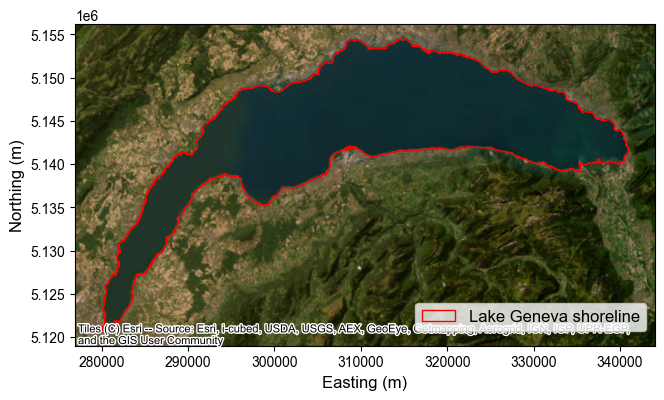

In [26]:
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=1, edgecolor="red", facecolor="none", label = 'Lake Geneva shoreline')
cx.add_basemap(ax, crs=gdf_utm.crs, source=cx.providers.Esri.WorldImagery)
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')

legend_elements = [
    Patch(edgecolor='red', facecolor = 'none', alpha=1, label='Lake Geneva shoreline')
]
ax.legend(handles=legend_elements, loc='lower right', bbox_to_anchor=(1, 0.02))

# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'shoreline_swissTLMRegio_basemap_WorldImagery_utm.png', dpi=300, bbox_inches='tight')

## 1.2. Bathymetry

In [27]:
# Read .nc dataset
path_swissbathy_wgs84 = parent_dir / 'data' / 'swissbathy3d_lacleman_4326_hr.nc'
da_swissbathy_wgs84 = xr.open_dataset(path_swissbathy_wgs84)

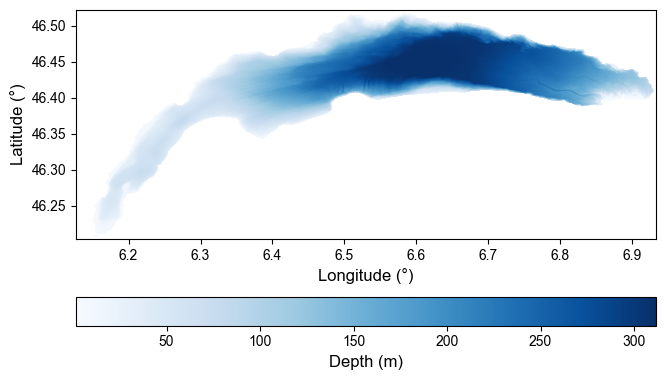

In [28]:
fig, ax = plt.subplots(figsize=(width_inches, height_inches))

# Get coordinate ranges
lon_min, lon_max = da_swissbathy_wgs84.x.min(), da_swissbathy_wgs84.x.max()
lat_min, lat_max = da_swissbathy_wgs84.y.min(), da_swissbathy_wgs84.y.max()

im = plt.imshow(da_swissbathy_wgs84['depth'].values, cmap = 'Blues', extent=[lon_min, lon_max, lat_min, lat_max])  # [left, right, bottom, top])

cbar = plt.colorbar(im, label='Depth (m)', orientation='horizontal')
cbar.set_label('Depth (m)')

plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')


# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'swissbathy3d_geneva_wgs84.png', dpi=300, bbox_inches='tight')

plt.show()

## 1.3. EyeONWater

In [29]:
# Download the Lémanscope recorded data
data = download_metadata()

In [30]:
# Convert the data to a dataframe
df = pd.DataFrame([flatten_dict(d) for d in data])

In [31]:
# Filter the DataFrame for dates from May 1, 2024 onward
df = df[df['image_date_photo'] >= '2024-05-01']

# Sort the DataFrame by the 'image_date_photo' column in ascending order
df = df.sort_values(by='image_date_photo', ascending=True).reset_index(drop=True)

# Print the date of the most recent recorded measurement
print('The latest data is recorded on: ', df['image_date_photo'].max())

# Print the total number of recorded measurements in the dataset
print('Number of recorded measurements:', len(df))

The latest data is recorded on:  2025-02-27 11:23:47
Number of recorded measurements: 2371


In [32]:
# Get the crs of the data, if existing and print it
crs_info = search_keys(data)
print("The CRS of the data is:", crs_info)

The CRS of the data is: {}


In [33]:
# Create GeoDataFrame from the points
geometry = [Point(xy) for xy in zip(df['location_lng'], df['location_lat'])]

# Assign the WGS84 coordinate system based on the data lat/lon values
points_gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

In [34]:
# Reproject to a UTM zone that suits the location of the points
points_gdf_utm = points_gdf.to_crs(points_gdf.estimate_utm_crs())

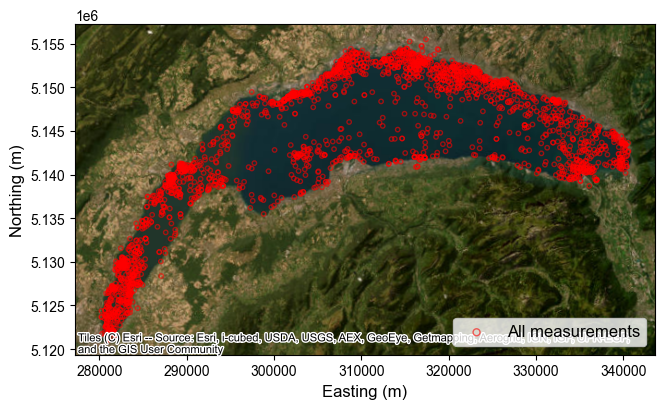

In [35]:
# Create a figure and axis with the calculated size
fig, ax = plt.subplots(figsize=(width_inches, height_inches))

# Plot the measurement points with red edges, no face color, and transparency
points_gdf_utm.plot(ax=ax, edgecolor='red', facecolor='none', markersize=10, alpha=0.6, label='All measurements')

# Add a basemap using Esri World Imagery as the background
cx.add_basemap(ax, crs=points_gdf_utm.crs, source=cx.providers.Esri.WorldImagery)

# Set axis labels
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')

# Define legend elements to represent plotted points
legend_elements = [
    ax.scatter([], [], edgecolor='red', facecolor='none', alpha=0.6, s=25, label='All measurements')
]

# Add legend to the plot with adjusted position
ax.legend(handles=legend_elements, loc='lower right')

# Set aspect ratio to ensure equal scaling of x and y axes
ax.set_aspect('equal')

# Save the figure with high resolution and tight bounding box
plt.savefig(parent_dir / 'outputs' / 'all_points_esri_utm.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

In [36]:
print('Number of unique devices for all data:', points_gdf['device_device_model'].nunique())

print('Number of records without device info:', len(points_gdf[points_gdf['device_device_model'].isna()]))

Number of unique devices for all data: 97
Number of records without device info: 0


In [37]:
# Print statistics
print('Number of records with user info:', len(points_gdf[points_gdf['user_user_n_code'].notna()]))
print('Number of unique users:', points_gdf[points_gdf['user_user_n_code'].notna()]['user_user_n_code'].nunique())
print('Number of unique devices for records with user info:', points_gdf[points_gdf['user_user_n_code'].notna()]['device_device_model'].nunique())

Number of records with user info: 2122
Number of unique users: 193
Number of unique devices for records with user info: 87


In [38]:
print('Number of records without user info:', len(points_gdf[points_gdf['user_user_n_code'].isna()==1]))
print('Number of unique devices for records without user info:', len(points_gdf[points_gdf['user_user_n_code'].isna()==1]['device_device_model'].unique()))

Number of records without user info: 249
Number of unique devices for records without user info: 52


In [39]:
# Count the unique instances in the 'device_device_model' column
unique_counts = points_gdf[points_gdf['user_user_n_code'].notna()]['device_device_model'].value_counts().reset_index()

# Rename columns for better readability
unique_counts.columns = ['Device Model', 'Count']

# Sort by Count (descending) and then by Device Model (ascending/alphabetical order)
unique_counts = unique_counts.sort_values(by=['Count', 'Device Model'], ascending=[False, True])

# Reset the index for better table display
unique_counts = unique_counts.reset_index(drop=True)

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis_v2.xlsx', 
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    unique_counts.to_excel(writer, sheet_name='nan_username_records_per_device', index=False)

## 1.4. Sentinel 3 products

### 1.4.1. S3 data download

In [40]:
url_sd = 'https://alplakes-api.eawag.ch/remotesensing/products/geneva/sentinel3/Zsd_lee' 
url_fu = 'https://alplakes-api.eawag.ch/remotesensing/products/geneva/sentinel3/forel_ule'

# Get list of datasets
s3_files_sd = get_datasets(url_sd)
s3_features_sd = pd.DataFrame(json.loads(json.dumps(s3_files_sd)))

s3_files_fu = get_datasets(url_fu)
s3_features_fu = pd.DataFrame(json.loads(json.dumps(s3_files_fu)))

In [41]:
s3_features_sd['date'] = pd.to_datetime(s3_features_sd['datetime'], format='%Y%m%dT%H%M%S').dt.date

s3_features_fu['date'] = pd.to_datetime(s3_features_fu['datetime'], format='%Y%m%dT%H%M%S').dt.date

In [42]:
# Using datetime
may_2024 = pd.to_datetime('2024-05-01')
s3_features_sd = s3_features_sd[s3_features_sd['date'] >= may_2024.date()]
s3_features_fu = s3_features_fu[s3_features_fu['date'] >= may_2024.date()]

In [43]:
s3_features_sd = s3_features_sd.drop_duplicates()
s3_features_fu = s3_features_fu.drop_duplicates()

In [44]:
# Create output directory if it doesn't exist
s3_dir_sd = parent_dir / 'data' / 's3_tiff_sd'
s3_dir_sd.mkdir(parents=True, exist_ok=True)

s3_dir_fu = parent_dir / 'data' / 's3_tiff_fu'
s3_dir_fu.mkdir(parents=True, exist_ok=True)

In [45]:
# Get list of existing files
existing_files_sd = set(file.name for file in s3_dir_sd.glob('*.tif'))

# Get list of existing files
existing_files_fu = set(file.name for file in s3_dir_fu.glob('*.tif'))

In [46]:
# Download only new files
for index, row in s3_features_sd.iterrows():
    # Get filename from URL
    filename = row['name']
    output_path = s3_dir_sd / filename
    
    # Check if file already exists
    if filename in existing_files_sd:
        continue
    else:
        print(f"Downloading {filename}...")
        success = download_tiff_file(row['url'], output_path)
        if success:
            print(f"Successfully downloaded to {output_path}")
        else:
            print(f"Failed to download {filename}")

# Download only new files
for index, row in s3_features_fu.iterrows():
    # Get filename from URL
    filename = row['name']
    output_path = s3_dir_fu / filename
    
    # Check if file already exists
    if filename in existing_files_fu:
        continue
    else:
        print(f"Downloading {filename}...")
        success = download_tiff_file(row['url'], output_path)
        if success:
            print(f"Successfully downloaded to {output_path}")
        else:
            print(f"Failed to download {filename}")

Successfully downloaded to C:\Users\ghadyaya\git\lemanscope-qa\data\s3_tiff_sd\SECCHIDEPTH_Zsd_lee_S3A_20250227T092431.tif
Successfully downloaded to C:\Users\ghadyaya\git\lemanscope-qa\data\s3_tiff_sd\SECCHIDEPTH_Zsd_lee_S3B_20250227T102644.tif
Successfully downloaded to C:\Users\ghadyaya\git\lemanscope-qa\data\s3_tiff_fu\FORELULE_forel_ule_S3A_20250227T092431.tif
Successfully downloaded to C:\Users\ghadyaya\git\lemanscope-qa\data\s3_tiff_fu\FORELULE_forel_ule_S3B_20250227T102644.tif


In [47]:
# Get list of existing files
existing_files_sd = set(file.name for file in s3_dir_sd.glob('*.tif'))

# Get list of existing files
existing_files_fu = set(file.name for file in s3_dir_fu.glob('*.tif'))

### 1.4.2. Sample S3 data plotting

In [48]:
#fn_sd = random.choice(list(existing_files_sd)) #'SECCHIDEPTH_S3A_20240828T100922.nc'#str(row['nc']).split('/')[-1]
fn_sd = 'SECCHIDEPTH_Zsd_lee_S3B_20240805T092657_sui.tif'
file_path_sd = s3_dir_sd / fn_sd

#fn_fu = random.choice(list(existing_files_fu)) #'SECCHIDEPTH_S3A_20240828T100922.nc'#str(row['nc']).split('/')[-1]
fn_fu = 'FORELULE_forel_ule_S3A_20240717T095814_sui.tif'
file_path_fu = s3_dir_fu / fn_fu

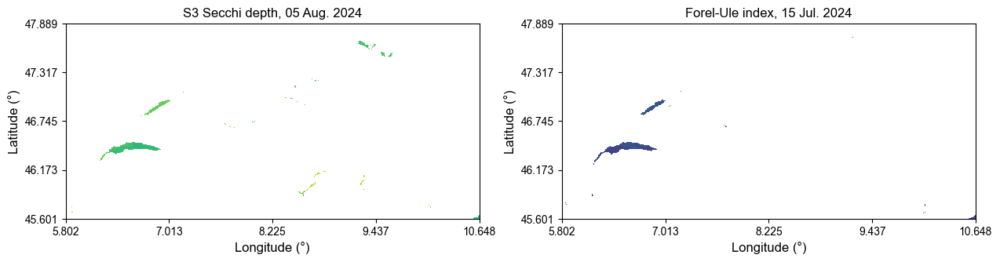

In [49]:
#fn_sd = random.choice(list(existing_files_sd)) #'SECCHIDEPTH_S3A_20240828T100922.nc'#str(row['nc']).split('/')[-1]
fn_sd = 'SECCHIDEPTH_Zsd_lee_S3B_20240805T092657_sui.tif'
file_path_sd = s3_dir_sd / fn_sd

#fn_fu = random.choice(list(existing_files_fu)) #'SECCHIDEPTH_S3A_20240828T100922.nc'#str(row['nc']).split('/')[-1]
fn_fu = 'FORELULE_forel_ule_S3A_20240717T095814_sui.tif'
file_path_fu = s3_dir_fu / fn_fu

fig, ax = plt.subplots(1, 2, figsize=(2*width_inches, 2*height_inches))

for idx, (file_path, title) in enumerate(zip([file_path_sd, file_path_fu], ['S3 Secchi depth, 05 Aug. 2024', 'Forel-Ule index, 15 Jul. 2024'])):
    # Read tiff
    with rasterio.open(file_path) as src:
        data1 = src.read(1)  # Returns numpy array
        bounds = src.bounds
        
        # Plot with correct extent
        im = ax[idx].imshow(data1, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
        
        #ax[idx].imshow(data1, extent = bounds)
        ax[idx].set_xlabel('Longitude (°)')
        ax[idx].set_ylabel('Latitude (°)')
        ax[idx].set_title(title)
    
        xticks = np.linspace(bounds.left, bounds.right, 5)  # 5 ticks from left to right
        yticks = np.linspace(bounds.bottom, bounds.top, 5)  # 5 ticks from bottom to top
        
        ax[idx].set_xticks(xticks)
        ax[idx].set_yticks(yticks)

### 1.4.3. Pixel mask

True
Rasterized output saved to: C:\Users\ghadyaya\git\lemanscope-qa\data\rasterized_lake_mask_wgs84.tif
Top: 509
Bottom: 624
Left: 90
Right: 292


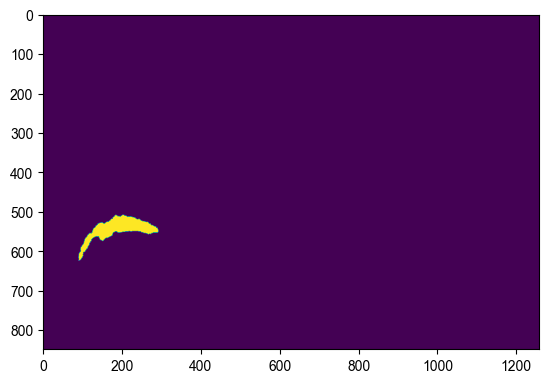

In [50]:
# Open the TIFF file to get its metadata
with rasterio.open(file_path_sd) as src:
    # Get the transform, shape, and CRS of the TIFF file
    transform = src.transform
    out_shape = src.shape
    crs = src.crs

    # Reproject the GeoDataFrame to match the TIFF's CRS (if necessary)
    print(gdf.crs == crs)

    # Rasterize the GeoDataFrame
    rasterized = rasterize(
        shapes=[(geom, 1) for geom in gdf.geometry],  # Set value=1 for intersecting pixels
        out_shape=out_shape,  # Match the TIFF's shape
        transform=transform,  # Match the TIFF's transform
        fill=0,  # Set value=-9999 for non-intersecting pixels
        dtype=np.uint8  # Data type for the output raster
    )

    # Save the rasterized output to a new TIFF file
    output_path = parent_dir / 'data' / 'rasterized_lake_mask_wgs84.tif'
    with rasterio.open(
        output_path,
        'w',
        driver='GTiff',
        height=out_shape[0],
        width=out_shape[1],
        count=1,
        dtype=rasterized.dtype,
        crs=crs,
        transform=transform
    ) as dst:
        dst.write(rasterized, 1)

    
    plt.imshow(rasterized)
    print(f"Rasterized output saved to: {output_path}")


    # Get indices of all non-zero elements
    rows, cols = np.nonzero(rasterized)
    
    # Get extreme indices
    top_idx = rows.min()      # Minimum row index (top)
    bottom_idx = rows.max()   # Maximum row index (bottom)
    left_idx = cols.min()     # Minimum column index (left)
    right_idx = cols.max()    # Maximum column index (right)
    
    print(f"Top: {top_idx}")
    print(f"Bottom: {bottom_idx}")
    print(f"Left: {left_idx}")
    print(f"Right: {right_idx}")

    # Create window for cropping
    window = rasterio.windows.Window(left_idx, top_idx,
                                   right_idx - left_idx + 1,
                                   bottom_idx - top_idx + 1)

    # # Read cropped data
    # cropped = src.read(1, window=window)

    # # Get new transform for plotting
    # transform = rasterio.windows.transform(window, src.transform)
    # bounds = rasterio.transform.array_bounds(window.height, window.width, transform)

    # # Save cropped raster
    # with rasterio.open('cropped_rasterized_lake_mask_wgs84.tif', 'w', **meta) as dst:
    #     dst.write(cropped, 1)
        
    # # Plot
    # plt.imshow(cropped, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
    # plt.colorbar()
    # plt.xlabel('Longitude (°)')
    # plt.ylabel('Latitude (°)')

    # # Update metadata for the cropped raster
    # meta = src.meta.copy()
    # meta.update({
    #     'height': window.height,
    #     'width': window.width,
    #     'transform': transform
    # })

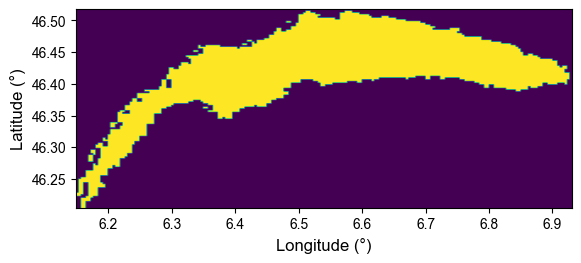

In [51]:
with rasterio.open(file_path_sd) as src:
    # Previous code for rasterization...
    
    # Get indices of all non-zero elements
    rows, cols = np.nonzero(rasterized)
    
    # Get extreme indices
    top_idx = rows.min()
    bottom_idx = rows.max()
    left_idx = cols.min()
    right_idx = cols.max()
    
    # Create window for cropping
    window = rasterio.windows.Window(left_idx, top_idx,
                                   right_idx - left_idx + 1,
                                   bottom_idx - top_idx + 1)
    
    # Read cropped data and ensure binary values
    cropped = src.read(1, window=window)
    cropped = (cropped > 0).astype(np.uint8)  # Convert to binary (0 and 1)
    
    # Get new transform for plotting
    transform = rasterio.windows.transform(window, src.transform)
    bounds = rasterio.transform.array_bounds(window.height, window.width, transform)
    left, bottom, right, top = bounds
    
    # Update metadata
    meta = src.meta.copy()
    meta.update({
        'height': window.height,
        'width': window.width,
        'transform': transform,
        'dtype': 'uint8'  # Ensure binary data type
    })

    binary_raster_path = parent_dir / 'outputs' / 'cropped_rasterized_lake_mask_wgs84.tif'
    # Save cropped raster
    with rasterio.open(parent_dir / 'outputs' / 'cropped_rasterized_lake_mask_wgs84.tif', 'w', **meta) as dst:
        dst.write(cropped, 1)
        
    # Plot
    plt.imshow(cropped, extent=[left, right, bottom, top])

    plt.xlabel('Longitude (°)')
    plt.ylabel('Latitude (°)')

In [52]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.crs import CRS

def reproject_raster(input_path, output_path, dst_crs):
    """
    Reproject a single-band raster to a new coordinate system
    """
    with rasterio.open(input_path) as src:
        # Calculate transform and dimensions
        transform, width, height = calculate_default_transform(
            src.crs,
            dst_crs,
            src.width,
            src.height,
            *src.bounds
        )
        
        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })
        
        # Create output file and reproject
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest
            )

# Example usage:
dst_crs = points_gdf_utm.crs  # UTM Zone 32N
reproject_raster(binary_raster_path, parent_dir / 'outputs' / 'cropped_binary_mask_utm.tif', dst_crs)

# 2. Flagging

## 2.1. Lake Bounds

In [53]:
if points_gdf_utm.crs != gdf_utm.crs:
   points_gdf_utm = points_gdf_utm.to_crs(gdf_utm.crs)

# Get lake geometry
lake_geom = gdf_utm.iloc[0].geometry

# Flag points: 0 if outside, 1 if inside or on boundary
points_gdf_utm['LOC_OOB'] = (~points_gdf_utm.geometry.within(lake_geom)).astype(int)

Points inside the lake: 2273
Points outside the lake: 98


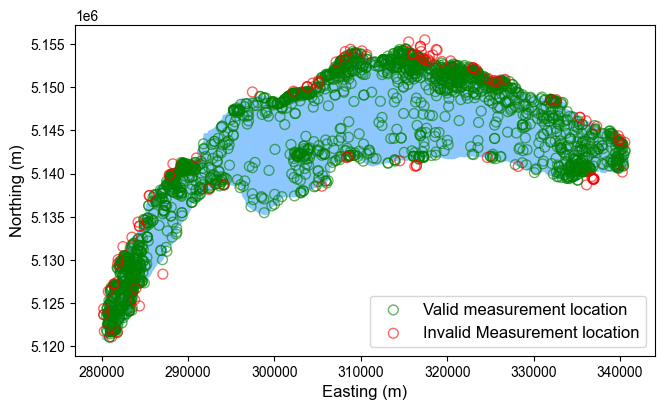

In [54]:
# Verify results
print("Points inside the lake:", len(points_gdf_utm[points_gdf_utm['LOC_OOB'] == 0]))
print("Points outside the lake:", len(points_gdf_utm[points_gdf_utm['LOC_OOB'] == 1]))

# Create a figure and axis with the calculated size
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')
points_gdf_utm[points_gdf_utm['LOC_OOB'] == 0].plot(ax=ax, edgecolor='green', facecolor = 'none', markersize=50, alpha=0.6, label='Valid measurement location')
points_gdf_utm[points_gdf_utm['LOC_OOB'] == 1].plot(ax=ax, edgecolor='red', facecolor = 'none', markersize=50, alpha=0.6, label='Invalid Measurement location')

plt.legend(loc = 'lower right')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')


# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'points_lake_bounds_all_data.png', dpi=300, bbox_inches='tight')

plt.show()

In [55]:
# Create the DataFrame as before
out_of_bounds_counts = points_gdf_utm[points_gdf_utm['LOC_OOB'] == 1]['user_nickname'].value_counts()
total_counts = points_gdf_utm[points_gdf_utm['user_nickname'].isin(out_of_bounds_counts.index)]['user_nickname'].value_counts()

user_stats = pd.DataFrame({
    'Out_of_Bounds_Measurements': out_of_bounds_counts,
    'Total_Measurements': total_counts
})
user_stats['Percentage_Out_of_Bounds'] = (user_stats['Out_of_Bounds_Measurements'] / user_stats['Total_Measurements'] * 100).round(1)

# Reset index to make user_nickname a column
user_stats = user_stats.reset_index()
user_stats = user_stats.rename(columns={'index': 'user_nickname'})

# Sort by Out_of_Bounds_Measurements (descending) and then by user_nickname (ascending)
user_stats = user_stats.sort_values(['Out_of_Bounds_Measurements', 'user_nickname'], 
                                  ascending=[False, True])

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx', 
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_stats.to_excel(writer, sheet_name='OOB_measures_per_username', index=False)

print('Number of users recording measuremnets outside lake:', len(user_stats))

Number of users recording measuremnets outside lake: 52


In [56]:
a = len(points_gdf_utm[(points_gdf_utm['LOC_OOB'] == 1)&(points_gdf_utm['user_nickname'].isna()==1)])
b = len(points_gdf_utm[(points_gdf_utm['user_nickname'].isna()==1)])
print(a, b, a/b*100)

8 249 3.2128514056224895


## 2.2. $Z_{SD}$

In [57]:
points_gdf_utm[(points_gdf_utm['water_fu_processed'].isna() == 1)&(points_gdf_utm['water_sd_depth'].isna() == 1)]

,location_lat,location_lng,device_device_model,device_device_platform,image_bottom,image_date_photo,image_image,image_viewing_angle,image_rain,water_fu_observed,...,water_sunny_hue_best_fu,water_sunny_hue_center,water_sunny_hue_center_fu,user_user_n_code,user_nickname,user_user_points,user_user_photo_count,user_user_level,geometry,LOC_OOB


### 2.2.1. Null $Z_{SD}$

In [58]:
# Check number of rows before
print('Number of NaN secchi measures:', len(points_gdf_utm[(points_gdf_utm['water_sd_depth'].isna() == 1)]))

# Check number of rows after
print('Number of non-NaN secchi measures', len(points_gdf_utm[(points_gdf_utm['water_sd_depth'].isna() == 0)]))

Number of NaN secchi measures: 520
Number of non-NaN secchi measures 1851


In [59]:

# Read .nc dataset
path_swissbathy_utm = parent_dir / 'data' / 'swissbathy3d_lacleman_32632_hr.nc'
da_swissbathy_utm = xr.open_dataset(path_swissbathy_utm)

# Add depth column
points_gdf_utm['depth_swiss_bathy'] = points_gdf_utm.apply(
    lambda row: get_depth_at_point(
        row.geometry, 
        da_swissbathy_utm['depth']
    ), 
    axis=1
)


# Print some results to verify
print(points_gdf_utm[['location_lat', 'location_lng', 'depth_swiss_bathy']].head())

   location_lat  location_lng  depth_swiss_bathy
0     46.412175      6.302776          48.498016
1     46.387838      6.274230          40.856506
2     46.468190      6.361886                NaN
3     46.289053      6.168758                NaN
4     46.290448      6.177257           9.134491


In [60]:
# Find users with NaN Secchi measurements and count them
nan_secchi_counts = points_gdf_utm[(points_gdf_utm['water_sd_depth'].isna() == 1)]['user_nickname'].value_counts()

# Get total measurements for these users
total_counts = points_gdf_utm[points_gdf_utm['user_nickname'].isin(nan_secchi_counts.index)]['user_nickname'].value_counts()

# Create DataFrame with the statistics
user_stats = pd.DataFrame({
    'NaN_Secchi_Measurements': nan_secchi_counts,
    'Total_Measurements': total_counts
})

# Add percentage column
user_stats['Percentage_NaN_Secchi'] = (user_stats['NaN_Secchi_Measurements'] / user_stats['Total_Measurements'] * 100).round(1)

# Reset index to make user_nickname a column
user_stats = user_stats.reset_index()
user_stats = user_stats.rename(columns={'index': 'user_nickname'})

# Sort by NaN_Secchi_Measurements (descending) and then by user_nickname (ascending)
user_stats = user_stats.sort_values(['NaN_Secchi_Measurements', 'user_nickname'], 
                                  ascending=[False, True])

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx', 
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_stats.to_excel(writer, sheet_name='ZSD_nan_per_username', index=False)

In [61]:
len(user_stats)

100

In [62]:
a = len(points_gdf_utm[(points_gdf_utm['water_sd_depth'].isna() == 1)&(points_gdf_utm['user_nickname'].isna()==1)])
b = len(points_gdf_utm[(points_gdf_utm['user_nickname'].isna()==1)])
print(a, b, a/b*100)

85 249 34.13654618473896


### 2.2.2. Secchi depth range

Points with secchi depth smaller than 0.5 or bigger than 20: 360
Points with secchi depth smaller than 0.5: 351
Points with secchi depth bigger than 20: 9
Points with valid secchi depth: 1491
Points with nan secchi depth: 520


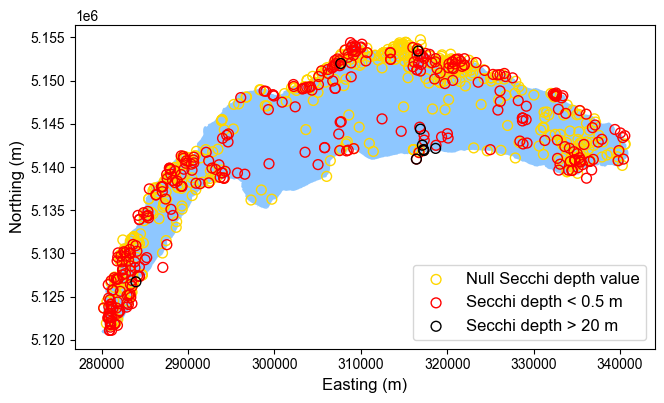

In [63]:
# Verify results
print("Points with secchi depth smaller than 0.5 or bigger than 20:", ((points_gdf_utm['water_sd_depth'].isna() == 0)&((points_gdf_utm['water_sd_depth'] < 0.5) | (points_gdf_utm['water_sd_depth'] > 20))).sum()) #(points_gdf['flag_in_lake_bounds'] == 1)
print("Points with secchi depth smaller than 0.5:", ((points_gdf_utm['water_sd_depth'].isna() == 0) & (points_gdf_utm['water_sd_depth'] < 0.5)).sum())
print("Points with secchi depth bigger than 20:", ((points_gdf_utm['water_sd_depth'].isna() == 0) & (points_gdf_utm['water_sd_depth'] >20)).sum())
print("Points with valid secchi depth:", ((points_gdf_utm['water_sd_depth'].isna() == 0) & (points_gdf_utm['water_sd_depth'] >= 0.5) & (points_gdf_utm['water_sd_depth'] <= 20)).sum())
print("Points with nan secchi depth:", ((points_gdf_utm['water_sd_depth'].isna() == 1)).sum())


# Optional: Visualize to check
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')
#points_gdf_utm[ ((points_gdf['user_user_n_code'].isna() == 0) & (points_gdf['flag_secchi_nonnan'] == 1) & (points_gdf['water_sd_depth'] >= 1) & (points_gdf['water_sd_depth'] <= 20))].plot(ax=ax, edgecolor='green', facecolor = 'none', markersize=50, alpha=1, label='Valid Secchi depth value')
points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 1))].plot(ax=ax, edgecolor='gold', facecolor = 'none',  markersize=50, alpha=1, label='Null Secchi depth value')
points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&((points_gdf_utm['water_sd_depth'] < 0.5)))].plot(ax=ax, edgecolor='red', facecolor = 'none',  markersize=50, alpha=1, label='Secchi depth < 0.5 m')
points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['water_sd_depth'] > 20))].plot(ax=ax, edgecolor='black', facecolor = 'none',  markersize=50, alpha=1, label='Secchi depth > 20 m')

plt.legend(loc='lower right')
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')

# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'invalidsecchi_range.png', dpi=300, bbox_inches='tight')

plt.show()

#### 2.2.2.1. $Z_{SD}$ > 20 m

In [64]:
points_gdf_utm[(points_gdf_utm['water_sd_depth'].isna()==0) & (points_gdf_utm['water_sd_depth']>20)]

,location_lat,location_lng,device_device_model,device_device_platform,image_bottom,image_date_photo,image_image,image_viewing_angle,image_rain,water_fu_observed,...,water_sunny_hue_center,water_sunny_hue_center_fu,user_user_n_code,user_nickname,user_user_points,user_user_photo_count,user_user_level,geometry,LOC_OOB,depth_swiss_bathy
14,46.259622,6.197013,"iPhone14,3",iOS,0,2024-05-05 01:39:10,http://eyeonwater.org/media/eyeonwater_upload/...,-12.0,0,0,...,155.418229,6.0,NaN,None,NaN,NaN,NaN,POINT (283979.245 5126712.986),1,NaN
453,46.509333,6.609972,"iPhone8,1",ios,0,2024-06-16 07:09:31,http://eyeonwater.org/media/eyeonwater_upload/...,-199.0,0,0,...,112.245046,7.0,1624.0,Franz,40.0,4.0,1.0,POINT (316642.718 5153415.639),0,19.725494
521,46.408583,6.640557,"iPhone7,2",iOS,0,2024-06-19 05:59:01,http://eyeonwater.org/media/eyeonwater_upload/...,0.0,0,0,...,128.152933,7.0,1572.0,Noelle,40.0,4.0,1.0,POINT (318654.736 5142150.657),0,38.676514
523,46.405984,6.622948,"iPhone12,1",ios,0,2024-06-19 06:01:47,http://eyeonwater.org/media/eyeonwater_upload/...,-199.0,0,0,...,143.941902,6.0,1571.0,Clane,20.0,5.0,1.0,POINT (317292.686 5141902.366),0,29.605011
524,46.411511,6.620517,"iPhone7,2",iOS,0,2024-06-19 06:04:04,http://eyeonwater.org/media/eyeonwater_upload/...,3.0,0,0,...,137.976458,6.0,1572.0,Noelle,40.0,4.0,1.0,POINT (317124.293 5142522.165),0,59.190002
525,46.407000,6.622444,"iPhone12,1",ios,0,2024-06-19 06:10:30,http://eyeonwater.org/media/eyeonwater_upload/...,-199.0,0,0,...,129.643222,7.0,1571.0,Clane,20.0,5.0,1.0,POINT (317257.32 5142016.399),0,36.922028
527,46.396872,6.612195,"iPhone7,2",iOS,0,2024-06-19 06:12:15,http://eyeonwater.org/media/eyeonwater_upload/...,0.0,0,0,...,123.364211,7.0,1572.0,Noelle,40.0,4.0,1.0,POINT (316435.622 5140914.848),1,NaN
1219,46.493850,6.493840,SM-A525F,android,0,2024-07-26 12:00:57,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,170.082707,5.0,1665.0,Claude,70.0,8.0,1.0,POINT (307679.022 5151971.679),0,52.355499
2053,46.428145,6.616830,SM-A536B,android,0,2024-09-21 09:24:27,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,162.661751,6.0,1565.0,Laurent,30.0,6.0,1.0,POINT (316896.656 5144378.833),0,309.598022


In [65]:
# Find users with deep Secchi measurements (>20m) and count them
deep_mask = (points_gdf_utm['water_sd_depth'] > 20) & (points_gdf_utm['water_sd_depth'].notna())
deep_secchi_counts = points_gdf_utm[deep_mask]['user_nickname'].value_counts()

# Get total measurements for these users
total_counts = points_gdf_utm[points_gdf_utm['user_nickname'].isin(deep_secchi_counts.index)]['user_nickname'].value_counts()

# Get the actual deep values for each user
deep_values = points_gdf_utm[deep_mask].groupby('user_nickname')['water_sd_depth'].apply(list)

# Create DataFrame with the statistics
user_stats = pd.DataFrame({
    'Deep_Secchi_Measurements': deep_secchi_counts,
    'Total_Measurements': total_counts,
    'Deep_Values': deep_values
})

# Add percentage column
user_stats['Percentage_Deep_Secchi'] = (user_stats['Deep_Secchi_Measurements'] / user_stats['Total_Measurements'] * 100).round(1)

# Reset index to make user_nickname a column
user_stats = user_stats.reset_index()
user_stats = user_stats.rename(columns={'index': 'user_nickname'})

# Sort by Deep_Secchi_Measurements (descending) and then by user_nickname (ascending)
user_stats = user_stats.sort_values(['Deep_Secchi_Measurements', 'user_nickname'], 
                                  ascending=[False, True])

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx', 
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_stats.to_excel(writer, sheet_name='ZSD_bigger_20_per_username', index=False)

In [66]:
points_gdf_utm[(points_gdf_utm['water_sd_depth'] > 20)]['water_sd_depth']

14      70.0
453     30.2
521     28.5
523     29.5
524     29.5
525     69.5
527     68.5
1219    31.0
2053    77.0
Name: water_sd_depth, dtype: float64

#### 2.2.2.2. $Z_{SD}$ < 0.5 m

In [67]:
print(len(points_gdf[(points_gdf_utm['water_sd_depth'].isna()==0) & (points_gdf_utm['water_sd_depth']<0.5)]))

print(len(points_gdf[(points_gdf_utm['user_nickname'].isna()==1)&(points_gdf_utm['water_sd_depth'].isna()==0) & (points_gdf_utm['water_sd_depth']<0.5)]))

351
58


Text(0, 0.5, 'Number of observations')

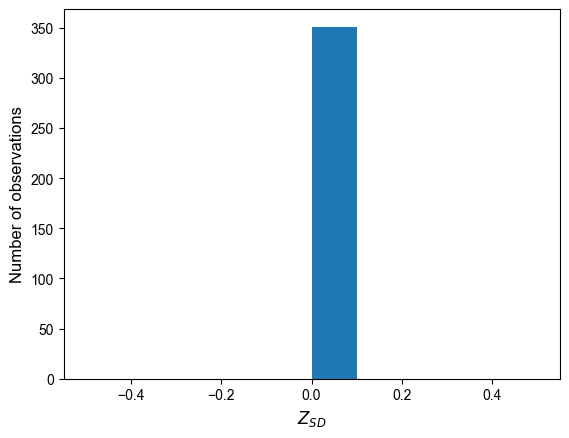

In [68]:
plt.hist(points_gdf[(points_gdf_utm['water_sd_depth'].isna()==0) & (points_gdf_utm['water_sd_depth']<0.5)]['water_sd_depth'].values)
plt.xlabel('$Z_{SD}$')
plt.ylabel('Number of observations')

In [69]:
points_gdf_utm['water_sd_depth']

0       11.4
1        9.2
2        8.8
3        0.0
4        0.0
        ... 
2366     8.7
2367     5.7
2368     4.6
2369     NaN
2370    10.5
Name: water_sd_depth, Length: 2371, dtype: float64

In [70]:
# Find users with shallow Secchi measurements (<1m) and count them
shallow_mask = (points_gdf_utm['water_sd_depth'] < 0.5) & (points_gdf_utm['water_sd_depth'].notna())
shallow_secchi_counts = points_gdf_utm[shallow_mask]['user_nickname'].value_counts()

# Get total measurements for these users
total_counts = points_gdf_utm[points_gdf_utm['user_nickname'].isin(shallow_secchi_counts.index)]['user_nickname'].value_counts()

# Get the actual shallow values for each user
shallow_values = points_gdf_utm[shallow_mask].groupby('user_nickname')['water_sd_depth'].apply(list)

# Create DataFrame with the statistics
user_stats = pd.DataFrame({
    'Shallow_Secchi_Measurements': shallow_secchi_counts,
    'Total_Measurements': total_counts,
    'Shallow_Values': shallow_values
})

# Add percentage column
user_stats['Percentage_Shallow_Secchi'] = (user_stats['Shallow_Secchi_Measurements'] / user_stats['Total_Measurements'] * 100).round(1)

# Reset index to make user_nickname a column
user_stats = user_stats.reset_index()
user_stats = user_stats.rename(columns={'index': 'user_nickname'})

# Sort by Shallow_Secchi_Measurements (descending) and then by user_nickname (ascending)
user_stats = user_stats.sort_values(['Shallow_Secchi_Measurements', 'user_nickname'], 
                                  ascending=[False, True])

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx', 
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_stats.to_excel(writer, sheet_name='ZSD_smaller_05_per_username_new', index=False)

In [71]:
temp = points_gdf_utm[shallow_mask]
temp
temp = temp[temp['user_nickname'].isna()==1]
np.unique(temp['device_device_model'])
temp['device_device_model'].value_counts()
device_counts = temp['device_device_model'].value_counts().sort_index().sort_values(ascending=False)
device_counts

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx', 
                   mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
   device_counts.to_excel(writer, sheet_name='ZSD_smaller_1_nan_user', index=True)

### 2.2.3. Bathymetry

In [72]:

# Optional: Count how many points got valid depths
print("\nNumber of valid depths:", ((points_gdf_utm['depth_swiss_bathy'].notna())).sum())#(points_gdf['flag_secchi_depth_range'] == 1) & (points_gdf['flag_in_lake_bounds'] == 1) & 
print("Number of NaN depths:", ((points_gdf_utm['depth_swiss_bathy'].isna())).sum())


Number of valid depths: 2256
Number of NaN depths: 115


In [73]:
# Optional: Count how many points got valid depths
#print("\nNumber of valid depths:", (&()).sum())#(points_gdf['flag_secchi_depth_range'] == 1) & (points_gdf['flag_in_lake_bounds'] == 1) & 
#print("Number of NaN depths:", ((points_gdf['depth_swiss_bathy'].isna())).sum())

print(((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].notna())).sum())
print(((points_gdf_utm['water_sd_depth'].isna() == 0) &(points_gdf_utm['depth_swiss_bathy'].isna())).sum())

1755
96


In [74]:
print(len(points_gdf[((points_gdf_utm['depth_swiss_bathy'].notna())&(points_gdf_utm['water_sd_depth'].isna() == 0))]))
print(len(points_gdf[((points_gdf_utm['depth_swiss_bathy'].notna())&(points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy']<0.5))]))
print(len(points_gdf[((points_gdf_utm['depth_swiss_bathy'].notna())&(points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy']<points_gdf_utm['water_sd_depth']))]))

1755
0
33


In [75]:
# Find cases where Secchi depth is greater than bathymetry depth, with valid measurements
condition_mask = (
                 (points_gdf_utm['water_sd_depth'].isna() == 0) &
                 (points_gdf_utm['depth_swiss_bathy'].notna()) &
                 (points_gdf_utm['depth_swiss_bathy'] < points_gdf_utm['water_sd_depth']))

# Count these cases per user
anomaly_counts = points_gdf_utm[condition_mask]['user_nickname'].value_counts()

# Get total measurements for these users
total_counts = points_gdf_utm[points_gdf_utm['user_nickname'].isin(anomaly_counts.index)]['user_nickname'].value_counts()

# Get the actual values for each user
anomaly_values = points_gdf_utm[condition_mask].groupby('user_nickname').apply(
    lambda x: list(zip(x['water_sd_depth'], x['depth_swiss_bathy']))
)

# Create DataFrame with the statistics
user_stats = pd.DataFrame({
    'Anomaly_Measurements': anomaly_counts,
    'Total_Measurements': total_counts,
    'Anomaly_Values': anomaly_values
})

# Add percentage column
user_stats['Percentage_Anomaly'] = (user_stats['Anomaly_Measurements'] / user_stats['Total_Measurements'] * 100)

# Reset index to make user_nickname a column
user_stats = user_stats.reset_index()
user_stats = user_stats.rename(columns={'index': 'user_nickname'})

# Sort by Anomaly_Measurements (descending) and then by user_nickname (ascending)
user_stats = user_stats.sort_values(['Anomaly_Measurements', 'user_nickname'],
                                  ascending=[False, True])

# Write to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx',
                    mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_stats.to_excel(writer, sheet_name='secchi_greater_than_bathy', index=False)

C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\3872415415.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  anomaly_values = points_gdf_utm[condition_mask].groupby('user_nickname').apply(


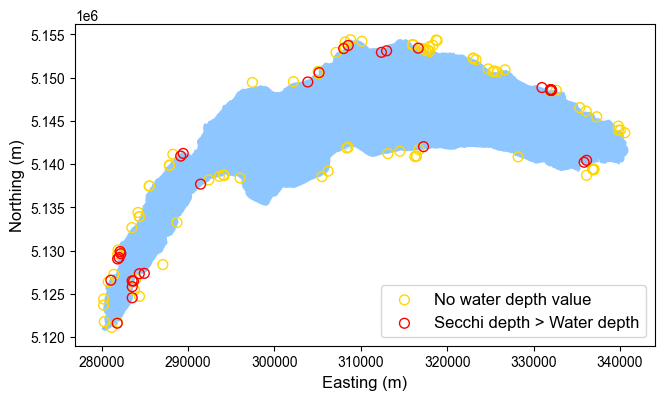

In [76]:
# Optional: Visualize to check
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')

points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].isna()))].plot(ax=ax, edgecolor='gold', facecolor = 'none', markersize=50, alpha=1, label='No water depth value')
points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].notna())&(points_gdf_utm['depth_swiss_bathy']<points_gdf_utm['water_sd_depth']))].plot(ax=ax, edgecolor='red', facecolor = 'none',  markersize=50, alpha=1, label='Secchi depth > Water depth')

plt.legend(loc='lower right')
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'secchi_exceeding_depth.png', dpi=300, bbox_inches='tight')

plt.show()

In [77]:
a = len(points_gdf_utm[((points_gdf_utm['user_user_n_code'].isna() == 1)&(points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].isna()==0)&(points_gdf_utm['depth_swiss_bathy']<points_gdf_utm['water_sd_depth']))])
b = len(points_gdf_utm[(points_gdf_utm['user_user_n_code'].isna() == 1)])
print(a, b, a/b*100)


1 249 0.4016064257028112


In [78]:
# checking if all no bathy values are outside the lake
print(len(points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].isna())&(points_gdf_utm['LOC_OOB'] == 0))]))
print(len(points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 0)&(points_gdf_utm['depth_swiss_bathy'].isna())&(points_gdf_utm['LOC_OOB'] == 1))]))

17
79


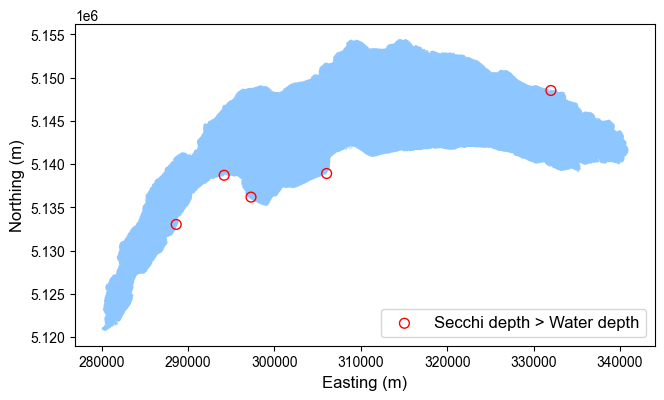

In [79]:
# Optional: Visualize to check
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')

points_gdf_utm[((points_gdf_utm['water_sd_depth'].isna() == 1)&(points_gdf_utm['depth_swiss_bathy'].isna())&(points_gdf_utm['LOC_OOB'] == 0))].plot(ax=ax, edgecolor='red', facecolor = 'none',  markersize=50, alpha=1, label='Secchi depth > Water depth')

plt.legend(loc='lower right')
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'inside_lake_nan_bathy.png', dpi=300, bbox_inches='tight')

plt.show()

### 2.2.4. Flag

In [80]:
# Add a column for lake bounds flag
points_gdf_utm['SEC_OOR'] = 0  # initialize all to 0

# Update the flag to 1 where the conditions are met
points_gdf_utm.loc[(points_gdf_utm['water_sd_depth'] < 0.5) | (points_gdf_utm['water_sd_depth'] > 20) | (points_gdf_utm['water_sd_depth'] > points_gdf_utm['depth_swiss_bathy']), 'SEC_OOR'] = 1

## 2.3. Forel-Ule index

In [81]:
value_column = 'water_fu_processed'
filtered_data = points_gdf_utm[points_gdf_utm[value_column].notna()]
print(len(points_gdf_utm))
print(len(filtered_data))
print(np.max(filtered_data[value_column]))
print(np.min(filtered_data[value_column]))
print(np.unique(filtered_data[value_column]))

2371
2363
21.0
1.0
[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21.]


In [82]:
points_gdf_utm[points_gdf_utm[value_column].isna()]['user_nickname']
#points_gdf_utm[points_gdf_utm['user_nickname']=='GÃ©rald ']

236       None
237       None
238       None
239       None
306    hb9hfd 
430       Dany
431       Dany
684    Gérald 
Name: user_nickname, dtype: object

In [83]:
#points_gdf_utm[((points_gdf_utm['user_user_n_code'].isna() == 0) & (points_gdf_utm['flag_in_lake_bounds'] == 1)&(points_gdf_utm[value_column].isna()))]
#points_gdf_utm[((points_gdf_utm['user_user_n_code'].isna() == 0) & (points_gdf_utm['flag_in_lake_bounds'] == 1)&(points_gdf_utm['user_nickname']=='hb9hfd '))]

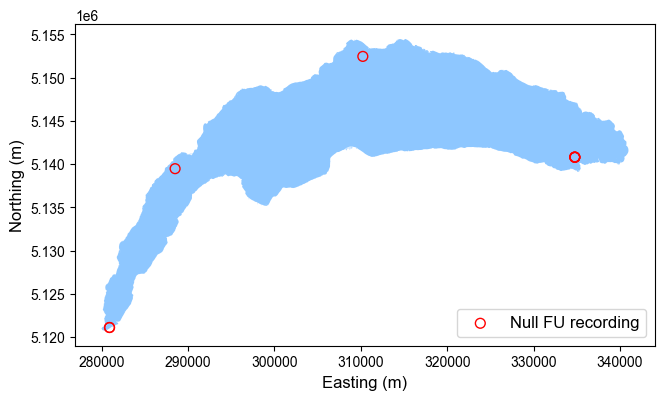

8


In [84]:
# Optional: Visualize to check
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')

points_gdf_utm[points_gdf_utm[value_column].isna()].plot(ax=ax, edgecolor='red', facecolor = 'none',  markersize=50, alpha=1, label='Null FU recording')

plt.legend(loc='lower right')
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'inside_lake_nan_fu.png', dpi=300, bbox_inches='tight')

plt.show()

print(len(points_gdf_utm[points_gdf_utm[value_column].isna()]))

## 2.4. User verification

In [85]:
# 1. Create initial UVF column based on null user_nicknames
points_gdf_utm['UVF'] = points_gdf_utm['user_nickname'].isnull().astype(int)

# 2. Calculate percentage of 1s for each user in both columns
user_stats = points_gdf_utm.groupby('user_nickname').agg({
    'LOC_OOB': 'mean',
    'SEC_OOR': 'mean'
})

# 3. Find users where either column has ≥50% ones
problematic_users = user_stats[(user_stats['LOC_OOB'] >= 0.5) | 
                              (user_stats['SEC_OOR'] >= 0.5)].index

# 4. Update UVF to 1 for those users
points_gdf_utm.loc[points_gdf_utm['user_nickname'].isin(problematic_users), 'UVF'] = 1

In [86]:
print(len(problematic_users))
problematic_users

49


Index(['Adrian ', 'Al-X', 'Alain ', 'Antoine', 'Batiol', 'Benito', 'Boston',
       'Caramel ', 'Clair de lune ', 'Clane', 'Dany', 'Didiiine', 'Eyo24',
       'Francois', 'Franz', 'Fuligule ', 'Guido', 'LBB2024', 'Lau'', 'Louis ',
       'Léman24', 'Marianne ', 'Michel ', 'Noelle', 'Peanut', 'Pico', 'Pierre',
       'Rachel ', 'Racheldup', 'Sassa', 'Tania', 'Thibault ', 'Xavier',
       'Xtrmrider', 'YAKA', 'bagustoni', 'csurmon1', 'deleric', 'fduc', 'fred',
       'idaG', 'kalajuttu', 'lemome', 'mary_ne89', 'mouton', 'msch',
       'ptsloups', 'salty_chloe', 'titi_19'],
      dtype='object', name='user_nickname')

## 2.5. Premium users

In [88]:
# Filter the dataframe
points_gdf_cleaned_fu = points_gdf_utm[
    (points_gdf_utm['user_user_n_code'].isna() == 0) &
    (points_gdf_utm['LOC_OOB'] == 0) &
    (points_gdf_utm['water_fu_processed'].notna())
]

points_gdf_cleaned_sd = points_gdf_utm[
    (points_gdf_utm['user_user_n_code'].isna() == 0) &
    (points_gdf_utm['LOC_OOB'] == 0) &
    (points_gdf_utm['depth_swiss_bathy'].isna()==0)&
    (points_gdf_utm['water_sd_depth'] < points_gdf_utm['depth_swiss_bathy'])&
    (points_gdf_utm['water_sd_depth'].notna()==1)&
    (points_gdf_utm['water_sd_depth'] >= 0.5)&
    (points_gdf_utm['water_sd_depth'] <= 20)
]

# Get measurement counts per user
user_counts_cleaned_fu = points_gdf_cleaned_fu['user_nickname'].value_counts()
user_counts_cleaned_sd = points_gdf_cleaned_sd['user_nickname'].value_counts()
user_counts_all = points_gdf_utm['user_nickname'].value_counts()

In [89]:
# Assuming you have series1 and series2
# To combine based on user_nickname
combined_fu = pd.concat([user_counts_cleaned_fu, user_counts_all], axis=1, keys=['count_fu', 'count_total']).fillna(0).astype(int)


# Add percentage column
combined_fu['percentage_fu'] = (combined_fu['count_fu'] / combined_fu['count_total'] * 100).round(1)

# Save to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx',
                   mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    combined_fu.to_excel(writer, sheet_name='all_user_statistics_total_fu')

combined_fu

,count_fu,count_total,percentage_fu
user_nickname,,,
jimP,104,105,99.0
hb9hfd,90,93,96.8
Linotte,87,93,93.5
Aquaphil,74,74,100.0
Ozalée,63,63,100.0
...,...,...,...
Al-X,0,2,0.0
mouton,0,1,0.0
Clair de lune,0,1,0.0


In [90]:
# Assuming you have series1 and series2
# To combine based on user_nickname
combined_sd = pd.concat([user_counts_cleaned_sd, user_counts_all], axis=1, keys=['count_sd', 'count_total']).fillna(0).astype(int)


# Add percentage column
combined_sd['percentage_sd'] = (combined_sd['count_sd'] / combined_sd['count_total'] * 100).round(1)

# Save to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx',
                   mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    combined_sd.to_excel(writer, sheet_name='all_user_statistics_total_sd')

combined_sd

,count_sd,count_total,percentage_sd
user_nickname,,,
jimP,97,105,92.4
Linotte,82,93,88.2
Aquaphil,70,74,94.6
Shogun,50,56,89.3
Gérald,47,49,95.9
...,...,...,...
RiCh,0,1,0.0
Joao,0,1,0.0
Leman15,0,1,0.0


In [91]:
# Assuming you have series1 and series2
# To combine based on user_nickname
combined_all = pd.concat([combined_fu, combined_sd], axis=1, keys=['count_fu', 'count_sd']).fillna(0).astype(int)


# Save to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx',
                   mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    combined_all.to_excel(writer, sheet_name='all_user_statistics_total_sd_fu')

combined_all

count_fu                           count_sd              \
               count_fu count_total percentage_fu count_sd count_total   
user_nickname                                                            
jimP                104         105            99       97         105   
hb9hfd               90          93            96       40          93   
Linotte              87          93            93       82          93   
Aquaphil             74          74           100       70          74   
Ozalée               63          63           100        0          63   
...                 ...         ...           ...      ...         ...   
Al-X                  0           2             0        0           2   
mouton                0           1             0        0           1   
Clair de lune         0           1             0        0           1   
Xtrmrider             0           1             0        0           1   
Caramel               0           1             0        0           1   

                              
               percentage_sd  
user_nickname                 
jimP                      92  
hb9hfd                    43  
Linotte                   88  
Aquaphil                  94  
Ozalée                     0  
...                      ...  
Al-X                       0  
mouton                     0  
Clair de lune              0  
Xtrmrider                  0  
Caramel                    0  

[193 rows x 6 columns]

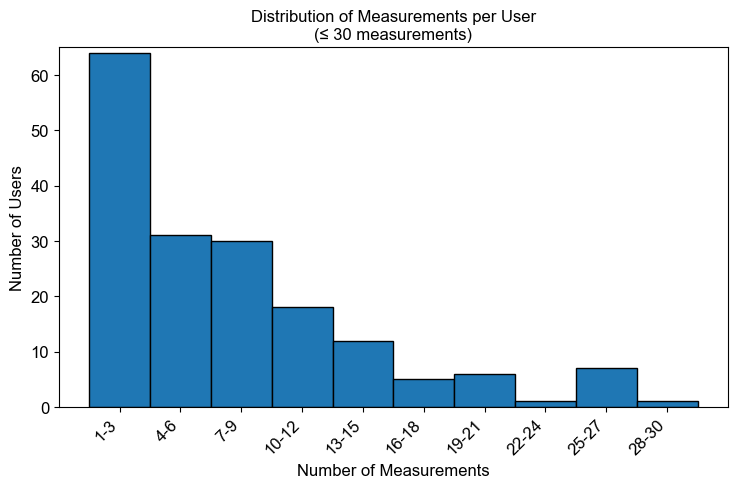

,User,Measurements
0,jimP,104
1,hb9hfd,90
2,Linotte,87
3,Aquaphil,74
4,Ozalée,63
5,Shogun,53
6,Gérald,46
7,tchico,46
8,chris,46
9,Vince,39


In [92]:
# Create custom bins from 1 to 30 in steps of 3
bins = np.arange(1, 34, 3)
bin_labels = [f'{bins[i]}-{bins[i+1]-1}' for i in range(len(bins)-1)]

# Create histogram with custom bins
fig, ax = plt.subplots(figsize=(width_inches, height_inches))

# Filter counts <= 30 for histogram
counts_for_hist = user_counts_cleaned_fu[user_counts_cleaned_fu <= 30]

# Create histogram
plt.hist(counts_for_hist, bins=bins, edgecolor='black', align='left')

# Customize plot
plt.xticks(bins[:-1], bin_labels, rotation=45, ha='right')
plt.xlabel('Number of Measurements')
plt.ylabel('Number of Users')
plt.title('Distribution of Measurements per User\n(≤ 30 measurements)')
plt.tick_params(labelsize=12)
plt.ylim(top=65)
plt.tight_layout()
plt.savefig(parent_dir / 'outputs' / 'records_histogram_fu.png', dpi=300, bbox_inches='tight')
plt.show()

# Identify premium users (>30 measurements)
premium_users = user_counts_cleaned_fu[user_counts_cleaned_fu > 30]
premium_users_df = pd.DataFrame({
    'User': premium_users.index,
    'Measurements': premium_users.values
}).sort_values('Measurements', ascending=False)
premium_users_df

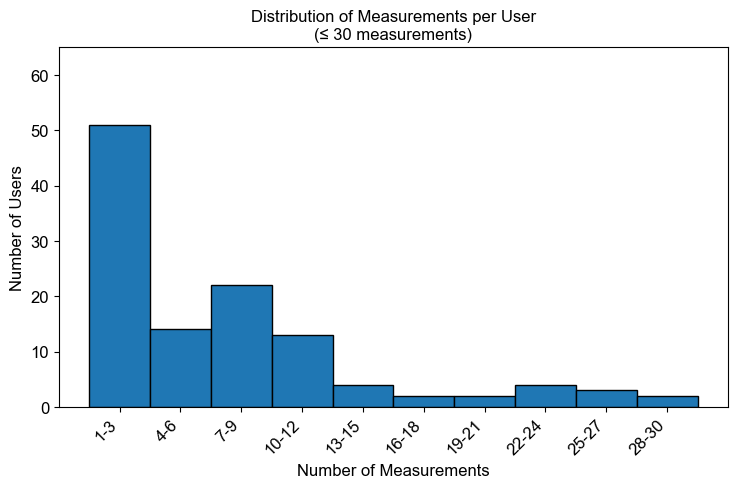

,User,Measurements
0,jimP,97
1,Linotte,82
2,Aquaphil,70
3,Shogun,50
4,Gérald,47
5,tchico,44
6,hb9hfd,40
7,chris,39


In [93]:
# Create custom bins from 1 to 30 in steps of 3
bins = np.arange(1, 34, 3)
bin_labels = [f'{bins[i]}-{bins[i+1]-1}' for i in range(len(bins)-1)]

# Create histogram with custom bins
fig, ax = plt.subplots(figsize=(width_inches, height_inches))

# Filter counts <= 30 for histogram
counts_for_hist = user_counts_cleaned_sd[user_counts_cleaned_sd <= 30]

# Create histogram
plt.hist(counts_for_hist, bins=bins, edgecolor='black', align='left')

# Customize plot
plt.xticks(bins[:-1], bin_labels, rotation=45, ha='right')
plt.xlabel('Number of Measurements')
plt.ylabel('Number of Users')
plt.title('Distribution of Measurements per User\n(≤ 30 measurements)')
plt.tick_params(labelsize=12)
plt.tight_layout()
plt.ylim(top=65)
plt.savefig(parent_dir / 'outputs' / 'records_histogram_sd.png', dpi=300, bbox_inches='tight')
plt.show()

# Identify premium users (>30 measurements)
premium_users = user_counts_cleaned_sd[user_counts_cleaned_sd > 30]
premium_users_df = pd.DataFrame({
    'User': premium_users.index,
    'Measurements': premium_users.values
}).sort_values('Measurements', ascending=False)
premium_users_df

In [94]:
# Filter the dataframe
points_gdf_cleaned_fu_nan_user = points_gdf_utm[
    (points_gdf_utm['user_user_n_code'].isna() == 1) &
    (points_gdf_utm['LOC_OOB'] == 0) &
    (points_gdf_utm['water_fu_processed'].notna())
]
print(len(points_gdf_cleaned_fu_nan_user))

points_gdf_cleaned_sd_nan_user = points_gdf_utm[
    (points_gdf_utm['user_user_n_code'].isna() == 1) &
    (points_gdf_utm['LOC_OOB'] == 0) &
    (points_gdf_utm['depth_swiss_bathy'].isna()==0)&
    (points_gdf_utm['water_sd_depth'] < points_gdf_utm['depth_swiss_bathy'])&
    (points_gdf_utm['water_sd_depth'].notna()==1)&
    (points_gdf_utm['water_sd_depth'] >= 0.5)&
    (points_gdf_utm['water_sd_depth'] <= 20)
]
print(len(points_gdf_cleaned_sd_nan_user))

237
102


## 2.6. Replicates: Same day, 300 m distance

In [95]:
tests = points_gdf_utm.copy()
#tests[['water_sd_depth','depth_swiss_bathy']]
#tests = tests.to_crs("EPSG:4326") 

In [96]:
# from tqdm.auto import tqdm
# import numpy as np
# import pandas as pd
# import networkx as nx

# def find_connected_indices(df):
#     # Convert datetime once at the start and store as array for faster access
#     timestamps = df['image_date_photo_converted'].values
    
#     # Get coordinates as arrays for faster access - already in UTM (meters)
#     coords = np.column_stack((df['geometry'].x, df['geometry'].y))  # Note: Using x,y for UTM coordinates
    
#     # Get user codes as array
#     user_codes = df['user_user_n_code'].values
    
#     # Dictionary to store graphs by date
#     graphs_by_date = {}
    
#     # Get indices array once
#     indices = df.index.values
    
#     # Calculate total iterations for better progress tracking
#     n = len(df)
#     total = n * (n - 1) // 2
    
#     # First pass: build graphs of connected points
#     with tqdm(total=total, desc="Building connection graphs") as pbar:
#         for i in range(n):
#             day_i = timestamps[i].astype('datetime64[D]')
#             days_j = timestamps[i+1:].astype('datetime64[D]')
            
#             # Vectorize same day check
#             same_day_mask = day_i == days_j
            
#             if np.any(same_day_mask):
#                 day_key = str(day_i)
#                 if day_key not in graphs_by_date:
#                     graphs_by_date[day_key] = nx.Graph()
                
#                 # Only calculate distances for points from same day
#                 valid_indices = np.where(same_day_mask)[0] + i + 1
                
#                 # Vectorized distance calculation using numpy
#                 points_j = coords[valid_indices]
#                 point_i = coords[i]
                
#                 # Calculate Euclidean distances directly in meters
#                 distances = np.sqrt(np.sum((points_j - point_i) ** 2, axis=1))
                
#                 # Find which points are within 300 meters
#                 within_range = distances <= 300
                
#                 # Add edges for points within range
#                 for idx, j in enumerate(valid_indices[within_range]):
#                     graphs_by_date[day_key].add_edge(
#                         indices[i],
#                         indices[j],
#                         distance=distances[idx],
#                         user1=user_codes[i],
#                         user2=user_codes[j]
#                     )
            
#             pbar.update(n - i - 1)
    
#     # Lists to store connected components
#     same_user_components = []
#     diff_user_components = []
    
#     # Process each day's graph
#     for day, G in graphs_by_date.items():
#         for component in nx.connected_components(G):
#             component = sorted(list(component))  # Convert to sorted list
            
#             # Check if all users in the component are the same
#             users_in_component = {user_codes[df.index.get_indexer([idx])[0]] for idx in component}
            
#             if len(users_in_component) == 1:
#                 same_user_components.append(tuple(component))
#             else:
#                 diff_user_components.append(tuple(component))
    
#     return same_user_components, diff_user_components

# # Usage example:
# # Convert datetime once before processing
# points_gdf_utm['image_date_photo_conv]erted'] = pd.to_datetime(points_gdf_utm['image_date_photo'])

# points_gdf_utm_cleaned = points_gdf_utm[(points_gdf_utm['LOC_OOB']==0)&(points_gdf_utm['SEC_OOR']==0)&(points_gdf_utm['water_sd_depth'].isna()==0)

# # Apply the function to get connected components
# same_user_groups, diff_user_groups = find_connected_indices(points_gdf_utm_cleaned)

# # Print example outputs
# print("Same user groups (first 5):", same_user_groups[:5])
# print("Different user groups (first 5):", diff_user_groups[:5])

# # If you want to save these to a file, you can convert them to a DataFrame:
# same_user_df = pd.DataFrame({'connected_indices': same_user_groups})
# diff_user_df = pd.DataFrame({'connected_indices': diff_user_groups})

In [97]:
def find_replicate_groups(df, max_distance=300):
    """
    Find groups of replicates based on direct pair-wise distances.
    A point can be in multiple groups if it's within max_distance of multiple points.
    
    Parameters:
    -----------
    df : DataFrame
        DataFrame containing points with geometry and image_date_photo_converted
    max_distance : float
        Maximum distance in meters for points to be considered replicates
        
    Returns:
    --------
    tuple: (same_user_groups, diff_user_groups)
        Lists of tuples containing indices for replicate groups
    """
    # Convert datetime once at the start and store as array for faster access
    timestamps = df['image_date_photo_converted'].values
    
    # Get coordinates as arrays for faster access
    coords = np.column_stack((df['geometry'].x, df['geometry'].y))
    
    # Get user codes as array
    user_codes = df['user_user_n_code'].values
    
    # Lists to store groups
    same_user_groups = []
    diff_user_groups = []
    
    # Get indices array once
    indices = df.index.values
    n = len(df)
    
    # Process each point
    for i in range(n):
        day_i = timestamps[i].astype('datetime64[D]')
        point_i = coords[i]
        user_i = user_codes[i]
        
        # Find all points from same day
        same_day_mask = timestamps[i+1:].astype('datetime64[D]') == day_i
        
        if np.any(same_day_mask):
            # Get indices of points from same day
            valid_indices = np.where(same_day_mask)[0] + i + 1
            
            # Calculate distances to all points from same day
            points_j = coords[valid_indices]
            distances = np.sqrt(np.sum((points_j - point_i) ** 2, axis=1))
            
            # Find points within range
            close_points_mask = distances <= max_distance
            close_indices = valid_indices[close_points_mask]
            
            # For each close point, create a group
            for j in close_indices:
                group = tuple(sorted([indices[i], indices[j]]))
                
                # Check if users are the same
                if user_codes[j] == user_i:
                    if group not in same_user_groups:
                        same_user_groups.append(group)
                else:
                    if group not in diff_user_groups:
                        diff_user_groups.append(group)
    
    return same_user_groups, diff_user_groups


points_gdf_utm['image_date_photo_converted'] = pd.to_datetime(points_gdf_utm['image_date_photo'])

points_gdf_utm_cleaned = points_gdf_utm[(points_gdf_utm['LOC_OOB']==0)&(points_gdf_utm['SEC_OOR']==0)&(points_gdf_utm['water_sd_depth'].isna()==0)]

same_user_groups, diff_user_groups = find_replicate_groups(points_gdf_utm_cleaned)

In [98]:
# For a specific group from your previous groups
group_indices = diff_user_groups[2]  # Gets first group tuple like (1, 12, 4)
group_data = points_gdf_utm_cleaned.loc[list(group_indices)]
group_data

,location_lat,location_lng,device_device_model,device_device_platform,image_bottom,image_date_photo,image_image,image_viewing_angle,image_rain,water_fu_observed,...,user_nickname,user_user_points,user_user_photo_count,user_user_level,geometry,LOC_OOB,depth_swiss_bathy,SEC_OOR,UVF,image_date_photo_converted
506,46.486755,6.671059,"iPhone14,2",ios,0,2024-06-18 11:46:15,http://eyeonwater.org/media/eyeonwater_upload/...,-199.0,0,0,...,None,NaN,NaN,NaN,POINT (321255.1 5150766.933),0,288.284027,0,1,2024-06-18 11:46:15
507,46.486537,6.669308,"iPhone14,2",ios,0,2024-06-18 12:02:34,http://eyeonwater.org/media/eyeonwater_upload/...,-199.0,0,0,...,None,NaN,NaN,NaN,POINT (321119.924 5150746.597),0,291.902008,0,1,2024-06-18 12:02:34


In [99]:
len(diff_user_groups)

42

In [100]:
len(same_user_groups)

131

In [101]:
def get_user_replicate_statistics(df, same_user_groups):
    # Initialize a dictionary to store user statistics
    user_stats = {}
    
    # Process each group of same-user replicates
    for group_indices in same_user_groups:
        # Convert numpy.int64 to regular int
        group_indices = [int(idx) for idx in group_indices]
        
        # Get data for this group
        group_df = df.loc[group_indices]
        
        # Get the user code (should be same for all records in group)
        user_code = group_df['user_user_n_code'].iloc[0]
        
        # If user not in stats dict, initialize their entry
        if user_code not in user_stats:
            user_stats[user_code] = {
                'total_replicate_measurements': 0,
                'number_of_replicate_groups': 0,
                'replicate_group_sizes': [],
                'dates_with_replicates': set()
            }
        
        # Update statistics
        group_size = len(group_indices)
        user_stats[user_code]['total_replicate_measurements'] += group_size
        user_stats[user_code]['number_of_replicate_groups'] += 1
        user_stats[user_code]['replicate_group_sizes'].append(group_size)
        user_stats[user_code]['dates_with_replicates'].add(group_df['image_date_photo_converted'].iloc[0].date())

    # Convert to DataFrame
    stats_df = pd.DataFrame.from_dict(user_stats, orient='index')
    
    # Add derived statistics
    stats_df['average_group_size'] = stats_df['replicate_group_sizes'].apply(lambda x: np.mean(x))
    stats_df['max_group_size'] = stats_df['replicate_group_sizes'].apply(max)
    stats_df['number_of_dates'] = stats_df['dates_with_replicates'].apply(len)
    
    # Clean up the DataFrame
    stats_df = stats_df.drop(['replicate_group_sizes', 'dates_with_replicates'], axis=1)
    
    # Add user nickname if available
    if 'user_nickname' in df.columns:
        user_nicknames = df.groupby('user_user_n_code')['user_nickname'].first()
        stats_df['user_nickname'] = user_nicknames
    
    # Sort by total replicate measurements
    stats_df = stats_df.sort_values('total_replicate_measurements', ascending=False)
    
    return stats_df

# Create the statistics
user_replicate_stats = get_user_replicate_statistics(points_gdf_utm_cleaned, same_user_groups)

user_replicate_stats

,total_replicate_measurements,number_of_replicate_groups,average_group_size,max_group_size,number_of_dates,user_nickname
1688.0,118,59,2.0,2,14,jimP
1968.0,20,10,2.0,2,1,me_o
1403.0,18,9,2.0,2,2,Laurence
2010.0,14,7,2.0,2,1,GSS Geneva Sailing School
1719.0,6,3,2.0,2,3,hb9hfd
1580.0,6,3,2.0,2,3,Gérald
1536.0,4,2,2.0,2,2,TiMiX
1576.0,4,2,2.0,2,2,Morse
2252.0,4,2,2.0,2,2,Sailowtech
1583.0,4,2,2.0,2,2,Ouiski


In [102]:
def get_user_replicate_statistics(df, same_user_groups):
    # Initialize a dictionary to store user statistics
    user_stats = {}
    
    # Process each group of same-user replicates
    for group_indices in same_user_groups:
        # Convert numpy.int64 to regular int
        group_indices = [int(idx) for idx in group_indices]
        
        # Get data for this group
        group_df = df.loc[group_indices]
        
        # Get the user code (should be same for all records in group)
        user_code = group_df['user_user_n_code'].iloc[0]
        user_name = group_df['user_nickname'].iloc[0]
        
        # If user not in stats dict, initialize their entry
        if user_code not in user_stats:
            user_stats[user_code] = {
                'user_name': user_name,
                'replicate_measurements': 0,  # Total number of measurements that are replicates
                'number_of_replicate_groups': 0,  # Number of groups
                'total_measurements': len(df[df['user_user_n_code'] == user_code])  # All measurements by this user
            }
        
        # Update statistics
        group_size = len(group_indices)
        user_stats[user_code]['replicate_measurements'] += group_size
        user_stats[user_code]['number_of_replicate_groups'] += 1

    # Convert to DataFrame
    stats_df = pd.DataFrame.from_dict(user_stats, orient='index')
    
    # Sort by number of replicate measurements
    stats_df = stats_df.sort_values('replicate_measurements', ascending=False)
    
    return stats_df

# Create the statistics
user_replicate_stats = get_user_replicate_statistics(points_gdf_utm_cleaned, same_user_groups)
user_replicate_stats

# Save to Excel
with pd.ExcelWriter(parent_dir / 'outputs' / 'user_analysis.xlsx',
                   mode='a', if_sheet_exists='replace', engine='openpyxl') as writer:
    user_replicate_stats.to_excel(writer, sheet_name='user_replicate_stats')

In [103]:
# Create a flat list of all indices involved in same-user replicates
same_user_replicate_indices = []
for group in same_user_groups:
    same_user_replicate_indices.extend([int(idx) for idx in group])

# Extract these records from the DataFrame
replicate_records = points_gdf_utm_cleaned.loc[same_user_replicate_indices]
replicate_records

,location_lat,location_lng,device_device_model,device_device_platform,image_bottom,image_date_photo,image_image,image_viewing_angle,image_rain,water_fu_observed,...,user_nickname,user_user_points,user_user_photo_count,user_user_level,geometry,LOC_OOB,depth_swiss_bathy,SEC_OOR,UVF,image_date_photo_converted
20,46.238990,6.161249,FP3,Android,0,2024-05-05 02:21:11,http://eyeonwater.org/media/eyeonwater_upload/...,-4.0,0,0,...,clomat,120.0,19.0,2.0,POINT (281140.998 5124518.785),0,32.641998,0,0,2024-05-05 02:21:11
25,46.239853,6.163840,FP3,Android,0,2024-05-05 12:18:41,http://eyeonwater.org/media/eyeonwater_upload/...,-4.0,0,0,...,clomat,120.0,19.0,2.0,POINT (281344.211 5124607.529),0,38.343506,0,0,2024-05-05 12:18:41
54,46.475357,6.458357,SM-S911B,Android,0,2024-05-10 01:06:48,http://eyeonwater.org/media/eyeonwater_upload/...,2.0,0,0,...,TiMiX,60.0,8.0,1.0,POINT (304890.081 5150003.913),0,20.206024,0,0,2024-05-10 01:06:48
68,46.475270,6.458295,SM-S911B,Android,0,2024-05-10 12:54:13,http://eyeonwater.org/media/eyeonwater_upload/...,16.0,0,0,...,TiMiX,60.0,8.0,1.0,POINT (304884.987 5149994.389),0,20.248993,0,0,2024-05-10 12:54:13
122,46.474831,6.463605,SM-S911B,Android,0,2024-05-13 01:12:41,http://eyeonwater.org/media/eyeonwater_upload/...,5.0,0,0,...,TiMiX,60.0,8.0,1.0,POINT (305291.033 5149932.572),0,29.209503,0,0,2024-05-13 01:12:41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2336,46.399652,6.854352,"iPhone14,5",ios,0,2025-02-12 10:20:48,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,Sailowtech,NaN,NaN,NaN,POINT (335059.538 5140690.132),0,66.456024,0,0,2025-02-12 10:20:48
2359,46.460217,6.410002,"iPhone15,4",ios,0,2025-02-22 09:00:00,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (301122.994 5148442.279),0,51.634003,0,0,2025-02-22 09:00:00
2362,46.461008,6.410761,"iPhone15,4",ios,0,2025-02-22 09:30:20,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (301184.172 5148528.27),0,45.166534,0,0,2025-02-22 09:30:20
2360,46.456645,6.400956,"iPhone15,4",ios,0,2025-02-22 09:10:29,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (300415.38 5148068.308),0,54.658508,0,0,2025-02-22 09:10:29


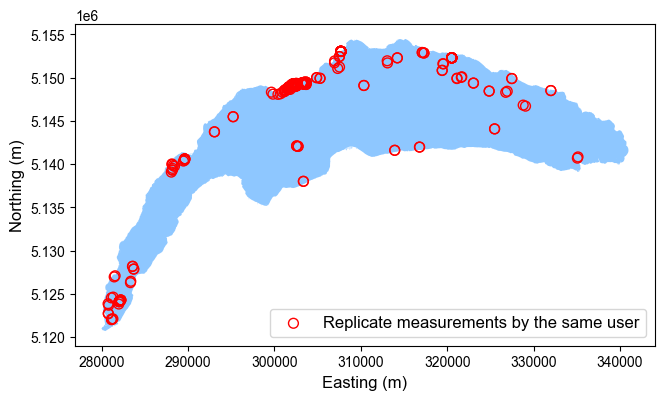

In [104]:
# Optional: Visualize to check
fig, ax = plt.subplots(figsize=(width_inches, height_inches))
gdf_utm.plot(ax=ax, alpha=0.5, color='dodgerblue')
#points_gdf[ ((points_gdf['user_user_n_code'].isna() == 0) & (points_gdf['flag_secchi_nonnan'] == 1) & (points_gdf['water_sd_depth'] >= 1) & (points_gdf['water_sd_depth'] <= 20))].plot(ax=ax, edgecolor='green', facecolor = 'none', markersize=50, alpha=1, label='Valid Secchi depth value')
replicate_records.plot(ax=ax, edgecolor='red', facecolor = 'none',  markersize=50, alpha=1, label='Replicate measurements by the same user')

plt.legend(loc='lower right')


# Set axis labels
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')

# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.savefig(parent_dir / 'outputs' / 'replicates_same_user.png', dpi=300, bbox_inches='tight')

plt.show()

### Functions

In [105]:
def extract_secchi_depths(index_tuples, points_gdf_utm):
    """
    Extract Secchi depth values from points_gdf_utm based on index tuples.
    
    Parameters:
    -----------
    index_tuples : list of tuples
        List of tuples where each tuple contains row indices
    points_gdf_utm : GeoDataFrame or DataFrame
        DataFrame containing the water_sd_depth column
        
    Returns:
    --------
    list of tuples
        List of tuples containing Secchi depth values corresponding to each replicate group
    """
    
    # Initialize empty list to store Secchi depth tuples
    secchi_depth_tuples = []
    
    # Iterate through each tuple of indices
    for index_tuple in index_tuples:
        # Extract Secchi depth values for each index in the tuple
        secchi_depths = tuple(points_gdf_utm.loc[idx, 'water_sd_depth'] for idx in index_tuple)
        secchi_depth_tuples.append(secchi_depths)
    
    return secchi_depth_tuples

In [106]:
def filter_and_process_secchi_tuples(secchi_tuples):
    """
    Filter secchi depth tuples to keep only those with at least two non-NaN values,
    then calculate statistics.
    
    Parameters:
    -----------
    secchi_tuples : list of tuples
        List of tuples containing Secchi depth values
        
    Returns:
    --------
    tuple: (filtered_tuples, stats_df)
        filtered_tuples: List of filtered Secchi depth tuples
        stats_df: DataFrame with statistics for filtered data
    """
    # Filter tuples
    filtered_tuples = []
    for tuple_idx, depths in enumerate(secchi_tuples):
        # Convert to numpy array and check for non-NaN values
        depths_array = np.array(depths)
        non_nan_count = np.sum(~np.isnan(depths_array))
        
        if non_nan_count >= 2:
            filtered_tuples.append(depths)
    
    print(f"Original number of tuples: {len(secchi_tuples)}")
    print(f"Number of tuples after filtering: {len(filtered_tuples)}")
    
    # Calculate statistics for filtered data
    stats = []
    for i, depths in enumerate(filtered_tuples):
        # Convert to numpy array and remove NaN values
        depths_array = np.array(depths)
        valid_depths = depths_array[~np.isnan(depths_array)]
        
        mean = np.mean(valid_depths)
        std = np.std(valid_depths, ddof=1)  # ddof=1 for sample standard deviation
        stats.append({
            'group_id': i,
            'mean': mean,
            'std': std,
            'n_samples': len(valid_depths),
            'original_samples': len(depths)
        })
    
    # Convert to DataFrame and sort by mean
    stats_df = pd.DataFrame(stats)
    stats_df = stats_df.sort_values('mean', ascending=True)
    stats_df['group_label'] = [f'R{i+1}' for i in range(len(stats_df))]
    
    return filtered_tuples, stats_df

In [107]:
def filter_and_process_secchi_tuples(secchi_tuples, index_tuples, points_gdf_utm):
    """
    Filter secchi depth tuples to keep only those with at least two non-NaN values,
    then calculate statistics.
    
    Parameters:
    -----------
    secchi_tuples : list of tuples
        List of tuples containing Secchi depth values
    index_tuples : list of tuples
        List of tuples containing row indices
    points_gdf_utm : GeoDataFrame
        DataFrame containing the data with user_nickname column
        
    Returns:
    --------
    tuple: (filtered_tuples, stats_df)
        filtered_tuples: List of filtered Secchi depth tuples
        stats_df: DataFrame with statistics for filtered data
    """
    # Filter tuples
    filtered_tuples = []
    filtered_indices = []  # Keep track of corresponding indices
    for tuple_idx, (depths, indices) in enumerate(zip(secchi_tuples, index_tuples)):
        # Convert to numpy array and check for non-NaN values
        depths_array = np.array(depths)
        non_nan_count = np.sum(~np.isnan(depths_array))
        
        if non_nan_count >= 2:
            filtered_tuples.append(depths)
            filtered_indices.append(indices)
    
    print(f"Original number of tuples: {len(secchi_tuples)}")
    print(f"Number of tuples after filtering: {len(filtered_tuples)}")
    
    # Calculate statistics for filtered data
    stats = []
    for i, (depths, indices) in enumerate(zip(filtered_tuples, filtered_indices)):
        # Convert to numpy array and remove NaN values
        depths_array = np.array(depths)
        valid_depths = depths_array[~np.isnan(depths_array)]
        
        mean = np.mean(valid_depths)
        std = np.std(valid_depths, ddof=1)  # ddof=1 for sample standard deviation
        
        # Get user information
        users = [points_gdf_utm.loc[idx, 'user_nickname'] for idx in indices]
        unique_users = list(set(users))
        
        stats.append({
            'group_id': i,
            'mean': mean,
            'std': std,
            'n_samples': len(valid_depths),
            'original_samples': len(depths),
            'n_users': len(unique_users),
            'user_name': unique_users[0] if len(unique_users) == 1 else 'Multiple Users'
        })
    
    # Convert to DataFrame and sort by mean
    stats_df = pd.DataFrame(stats)
    stats_df = stats_df.sort_values('mean', ascending=True)
    stats_df['group_label'] = [f'R{i+1}' for i in range(len(stats_df))]
    
    # Reorder columns to put user_name after group_label
    columns = ['group_label', 'user_name', 'n_users', 'mean', 'std', 'n_samples', 
              'original_samples', 'group_id']
    stats_df = stats_df[columns]
    
    return filtered_tuples, stats_df

In [108]:
def filter_and_process_secchi_tuples(secchi_tuples, index_tuples, points_gdf_utm):
    """
    Filter secchi depth tuples to keep only those with at least two non-NaN values,
    then calculate statistics.
    
    Parameters:
    -----------
    secchi_tuples : list of tuples
        List of tuples containing Secchi depth values
    index_tuples : list of tuples
        List of tuples containing row indices
    points_gdf_utm : GeoDataFrame
        DataFrame containing the data with user_nickname column
        
    Returns:
    --------
    tuple: (filtered_tuples, stats_df)
        filtered_tuples: List of filtered Secchi depth tuples
        stats_df: DataFrame with statistics for filtered data
    """
    # Filter tuples
    filtered_tuples = []
    filtered_indices = []  # Keep track of corresponding indices
    for tuple_idx, (depths, indices) in enumerate(zip(secchi_tuples, index_tuples)):
        # Convert to numpy array and check for non-NaN values
        depths_array = np.array(depths)
        non_nan_count = np.sum(~np.isnan(depths_array))
        
        if non_nan_count >= 2:
            filtered_tuples.append(depths)
            filtered_indices.append(indices)
    
    print(f"Original number of tuples: {len(secchi_tuples)}")
    print(f"Number of tuples after filtering: {len(filtered_tuples)}")
    
    # Calculate statistics for filtered data
    stats = []
    for i, (depths, indices) in enumerate(zip(filtered_tuples, filtered_indices)):
        # Convert to numpy array and remove NaN values
        depths_array = np.array(depths)
        valid_depths = depths_array[~np.isnan(depths_array)]
        
        mean = np.mean(valid_depths)
        std = np.std(valid_depths, ddof=1)  # ddof=1 for sample standard deviation
        
        # Get user information
        users = [points_gdf_utm.loc[idx, 'user_nickname'] for idx in indices]
        unique_users = list(set(users))
        
        stats.append({
            'group_id': i,
            'mean': mean,
            'std': std,
            'n_samples': len(valid_depths),
            'original_samples': len(depths),
            'n_users': len(unique_users),
            'user_name': unique_users[0] if len(unique_users) == 1 else 'Multiple Users'
        })
    
    # Convert to DataFrame and sort by mean
    stats_df = pd.DataFrame(stats)
    stats_df = stats_df.sort_values('mean', ascending=True)
    stats_df['group_label'] = [f'R{i+1}' for i in range(len(stats_df))]
    
    # Reorder columns to put user_name after group_label
    columns = ['group_label', 'user_name', 'n_users', 'mean', 'std', 'n_samples', 
              'original_samples', 'group_id']
    stats_df = stats_df[columns]
    
    return filtered_tuples, stats_df

In [109]:
def filter_and_process_secchi_tuples(filtered_tuples, filtered_indices, points_gdf_utm):
    """
    Filter secchi depth tuples to keep only those with at least two non-NaN values,
    then calculate statistics.
    
    Parameters:
    -----------
    secchi_tuples : list of tuples
        List of tuples containing Secchi depth values
    index_tuples : list of tuples
        List of tuples containing row indices
    points_gdf_utm : GeoDataFrame
        DataFrame containing the data with user_nickname column
        
    Returns:
    --------
    tuple: (filtered_tuples, stats_df)
        filtered_tuples: List of filtered Secchi depth tuples
        stats_df: DataFrame with statistics for filtered data
    """
    
    # Calculate statistics for filtered data
    stats = []
    for i, (depths, indices) in enumerate(zip(filtered_tuples, filtered_indices)):
        # Convert to numpy array and remove NaN values
        depths_array = np.array(depths)
        valid_depths = depths_array[~np.isnan(depths_array)]
        
        mean = np.mean(valid_depths)
        std = np.std(valid_depths, ddof=1)  # ddof=1 for sample standard deviation
        
        # Get user information
        users = [points_gdf_utm.loc[idx, 'user_nickname'] for idx in indices]
        unique_users = list(set(users))
        
        stats.append({
            'group_id': i,
            'mean': mean,
            'std': std,
            'n_samples': len(valid_depths),
            'original_samples': len(depths),
            'n_users': len(unique_users),
            'user_name': unique_users[0] if len(unique_users) == 1 else 'Multiple Users'
        })
    
    # Convert to DataFrame and sort by mean
    stats_df = pd.DataFrame(stats)
    stats_df = stats_df.sort_values('mean', ascending=True)
    stats_df['group_label'] = [f'R{i+1}' for i in range(len(stats_df))]
    
    # Reorder columns to put user_name after group_label
    columns = ['group_label', 'user_name', 'n_users', 'mean', 'std', 'n_samples', 
              'original_samples', 'group_id']
    stats_df = stats_df[columns]
    
    return filtered_tuples, stats_df

In [110]:
def plot_secchi_stats(stats_df, title='Secchi Depth by Replicate Group', 
                     figsize=(10, 8), fontsize=10):
    """
    Create an error bar plot showing means and standard deviations.
    Y-axis shows replicate groups, X-axis shows Secchi depth.
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create error bar plot
    y_positions = np.arange(len(stats_df))
    ax.errorbar(stats_df['mean'], y_positions,
                xerr=stats_df['std'],
                fmt='o',
                capsize=5,
                capthick=1.5,
                elinewidth=1.5,
                markersize=6)
    
    # Customize plot
    ax.set_yticks(y_positions)
    ax.set_yticklabels(stats_df['group_label'], fontsize=fontsize)
    ax.set_xlabel('Secchi Depth', fontsize=fontsize+2)
    ax.set_ylabel('Replicate Groups', fontsize=fontsize+2)
    ax.set_title(title, fontsize=fontsize+4)
    
    # Add grid for better readability
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout
    plt.tight_layout()
    
    return fig, ax

In [111]:
def plot_secchi_stats(stats_df, title='Secchi Depth by Replicate Group', 
                     figsize=(10, 8), fontsize=10):
    """
    Create an error bar plot showing means and standard deviations.
    Y-axis shows replicate groups, X-axis shows Secchi depth.
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create error bar plot
    y_positions = np.arange(len(stats_df))
    ax.errorbar(stats_df['mean'], y_positions,
                xerr=stats_df['std'],
                fmt='o',
                capsize=5,
                capthick=1.5,
                elinewidth=1.5,
                markersize=6)
    
    # Customize plot
    ax.set_yticks(y_positions)
    ax.set_yticklabels(stats_df['group_label'], fontsize=fontsize)
    ax.set_xlabel('Secchi Depth', fontsize=fontsize+2)
    ax.set_ylabel('Replicate Groups', fontsize=fontsize+2)
    ax.set_title(title, fontsize=fontsize+4)
    
    # Add grid for better readability
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout
    plt.tight_layout()


    return fig, ax

In [112]:
def plot_secchi_stats(stats_df, title='Secchi Depth by Replicate Group', 
                     figsize=(10, 8), fontsize=10):
    """
    Create an error bar plot showing means and standard deviations.
    Y-axis shows replicate groups, X-axis shows Secchi depth.
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create error bar plot
    y_positions = np.arange(len(stats_df))
    ax.errorbar(stats_df['mean'], y_positions,
                xerr=stats_df['std'],
                fmt='o',
                capsize=5,
                capthick=1.5,
                elinewidth=1.5,
                markersize=6)
    
    # Customize plot
    ax.set_yticks(y_positions)
    ax.set_yticklabels(stats_df['group_label'], fontsize=fontsize)
    ax.set_xlabel('Secchi Depth', fontsize=fontsize+2)
    ax.set_ylabel('Replicate Groups', fontsize=fontsize+2)
    ax.set_title(title, fontsize=fontsize+4)
    
    # Add grid for better readability
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout
    plt.tight_layout()
    
    return fig, ax

In [113]:
def calculate_group_statistics(secchi_tuples):
    """
    Calculate statistics including CV for each group of measurements.
    """
    stats = []
    for i, depths in enumerate(secchi_tuples):
        depths_array = np.array(depths)
        valid_depths = depths_array[~np.isnan(depths_array)]
        
        if len(valid_depths) >= 2:
            mean = np.mean(valid_depths)
            std = np.std(valid_depths, ddof=1)
            cv = (std / mean) * 100  # CV as percentage
            
            stats.append({
                'group_id': i,
                'mean': mean,
                'median': np.median(valid_depths),
                'std': std,
                'cv': cv,
                'n_samples': len(valid_depths),
                'original_samples': len(depths)
            })
    
    stats_df = pd.DataFrame(stats)
    return stats_df.sort_values('median', ascending=True)

In [114]:
def plot_variation_histograms(stats_df, figsize=(15, 6)):
    """
    Create side-by-side histograms of standard deviation and coefficient of variation.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot standard deviation histogram
    n1, bins1, patches1 = ax1.hist(stats_df['std'], 
                                  bins='auto',
                                  edgecolor='black',
                                  alpha=0.7,
                                  color='navy')
    
    mean_std = stats_df['std'].mean()
    median_std = stats_df['std'].median()
    
    ax1.axvline(mean_std, color='red', linestyle='--', alpha=0.8,
                label=f'Mean: {mean_std:.3f}')
    ax1.axvline(median_std, color='green', linestyle='--', alpha=0.8,
                label=f'Median: {median_std:.3f}')
    
    # Add statistics text box for STD
    stats_text_std = (f'n = {len(stats_df)}\n'
                     f'Mean = {mean_std:.3f}\n'
                     f'Median = {median_std:.3f}\n'
                     f'Min = {stats_df["std"].min():.3f}\n'
                     f'Max = {stats_df["std"].max():.3f}')
    
    ax1.text(0.95, 0.95, stats_text_std,
             transform=ax1.transAxes,
             verticalalignment='top',
             horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax1.set_xlabel('Standard Deviation', fontsize=12)
    ax1.set_ylabel('Frequency', fontsize=12)
    ax1.set_title('Distribution of Standard Deviations', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    # Plot CV histogram
    n2, bins2, patches2 = ax2.hist(stats_df['cv'], 
                                  bins='auto',
                                  edgecolor='black',
                                  alpha=0.7,
                                  color='darkgreen')
    
    mean_cv = stats_df['cv'].mean()
    median_cv = stats_df['cv'].median()
    
    ax2.axvline(mean_cv, color='red', linestyle='--', alpha=0.8,
                label=f'Mean: {mean_cv:.1f}%')
    ax2.axvline(median_cv, color='green', linestyle='--', alpha=0.8,
                label=f'Median: {median_cv:.1f}%')
    
    # Add statistics text box for CV
    stats_text_cv = (f'n = {len(stats_df)}\n'
                    f'Mean = {mean_cv:.1f}%\n'
                    f'Median = {median_cv:.1f}%\n'
                    f'Min = {stats_df["cv"].min():.1f}%\n'
                    f'Max = {stats_df["cv"].max():.1f}%')
    
    ax2.text(0.95, 0.95, stats_text_cv,
             transform=ax2.transAxes,
             verticalalignment='top',
             horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax2.set_xlabel('Coefficient of Variation (%)', fontsize=12)
    ax2.set_ylabel('Frequency', fontsize=12)
    ax2.set_title('Distribution of Coefficients of Variation', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    return fig, (ax1, ax2)

In [115]:
def plot_variation_by_user_separate(stats_df, figsize_per_plot=(12, 4), fontsize=10):
    """
    Create separate plots for each user showing std and cv for their replicate groups.
    """
    # Calculate CV if not present
    if 'cv' not in stats_df.columns:
        stats_df['cv'] = (stats_df['std'] / stats_df['mean']) * 100
    
    # Get unique users
    unique_users = sorted(stats_df['user_name'].unique())
    
    # Create a figure for each user
    figs = []
    axes_list = []
    
    for user in unique_users:
        # Filter data for this user
        user_data = stats_df[stats_df['user_name'] == user].copy()
        user_data = user_data.sort_values('mean')  # Sort by mean value
        
        # Create figure with two subplots for this user
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize_per_plot)
        
        # Plot Standard Deviation
        bars1 = ax1.bar(range(len(user_data)), user_data['std'], color='navy', alpha=0.7)
        ax1.set_xticks(range(len(user_data)))
        ax1.set_xticklabels(user_data['group_label'], rotation=45, ha='right')
        ax1.set_title(f'Standard Deviation - {user}', fontsize=fontsize+2)
        ax1.set_ylabel('Standard Deviation', fontsize=fontsize)
        
        # Add value labels on bars
        for bar in bars1:
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.2f}',
                    ha='center', va='bottom', fontsize=fontsize-1)
        
        # Plot Coefficient of Variation
        bars2 = ax2.bar(range(len(user_data)), user_data['cv'], color='darkgreen', alpha=0.7)
        ax2.set_xticks(range(len(user_data)))
        ax2.set_xticklabels(user_data['group_label'], rotation=45, ha='right')
        ax2.set_title(f'Coefficient of Variation - {user}', fontsize=fontsize+2)
        ax2.set_ylabel('CV (%)', fontsize=fontsize)
        
        # Add value labels on bars
        for bar in bars2:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.1f}%',
                    ha='center', va='bottom', fontsize=fontsize-1)
        
        # Add number of measurements for each group
        for ax in [ax1, ax2]:
            for i, n in enumerate(user_data['n_samples']):
                ax.text(i, ax.get_ylim()[0], f'n={n}',
                       ha='center', va='top', rotation=0, fontsize=fontsize-2)
            ax.grid(True, axis='y', linestyle='--', alpha=0.3)
        
        # Add summary statistics in text box
        stats_text = (
            f"Number of groups: {len(user_data)}\n"
            f"Mean STD: {user_data['std'].mean():.2f}\n"
            f"Mean CV: {user_data['cv'].mean():.1f}%\n"
            f"Total measurements: {user_data['n_samples'].sum()}"
        )
        fig.text(0.98, 0.95, stats_text,
                ha='right', va='top',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
                fontsize=fontsize-1)
        
        # Adjust layout
        plt.tight_layout()
        
        figs.append(fig)
        axes_list.append((ax1, ax2))
        
    return figs, axes_list

In [116]:
points_gdf_utm_cleaned

,location_lat,location_lng,device_device_model,device_device_platform,image_bottom,image_date_photo,image_image,image_viewing_angle,image_rain,water_fu_observed,...,user_nickname,user_user_points,user_user_photo_count,user_user_level,geometry,LOC_OOB,depth_swiss_bathy,SEC_OOR,UVF,image_date_photo_converted
0,46.412175,6.302776,SM-A600FN,Android,0,2024-05-01 02:56:12,http://eyeonwater.org/media/eyeonwater_upload/...,-9.0,0,0,...,la venturiere,70.0,7.0,1.0,POINT (292707.63 5143379.976),0,48.498016,0,0,2024-05-01 02:56:12
1,46.387838,6.274230,SM-A600FN,Android,0,2024-05-01 03:30:52,http://eyeonwater.org/media/eyeonwater_upload/...,-6.0,0,0,...,la venturiere,70.0,7.0,1.0,POINT (290420.545 5140751.171),0,40.856506,0,0,2024-05-01 03:30:52
6,46.469276,6.811699,SM-A137F,Android,0,2024-05-04 04:28:46,http://eyeonwater.org/media/eyeonwater_upload/...,2.0,0,0,...,Vince,300.0,33.0,3.0,POINT (331994.979 5148516.044),0,NaN,0,0,2024-05-04 04:28:46
10,46.439130,6.879100,"iPhone14,7",iOS,0,2024-05-04 10:41:17,http://eyeonwater.org/media/eyeonwater_upload/...,0.0,1,0,...,Marcelo,80.0,13.0,1.0,POINT (337079.624 5145025.348),0,30.520020,0,0,2024-05-04 10:41:17
16,46.266219,6.192202,"iPhone14,3",iOS,0,2024-05-05 02:00:06,http://eyeonwater.org/media/eyeonwater_upload/...,0.0,0,0,...,Fred,30.0,3.0,1.0,POINT (283634.476 5127459.153),0,17.062012,0,0,2024-05-05 02:00:06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2362,46.461008,6.410761,"iPhone15,4",ios,0,2025-02-22 09:30:20,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (301184.172 5148528.27),0,45.166534,0,0,2025-02-22 09:30:20
2363,46.463524,6.414766,"iPhone15,4",ios,0,2025-02-22 09:37:22,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (301500.829 5148797.802),0,32.760529,0,0,2025-02-22 09:37:22
2366,46.466094,6.424750,"iPhone15,4",ios,0,2025-02-22 09:53:31,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,jimP,140.0,48.0,2.0,POINT (302276.762 5149058.256),0,25.045502,0,0,2025-02-22 09:53:31
2367,46.422257,6.882458,SM-G991B,android,0,2025-02-22 13:55:51,http://eyeonwater.org/media/eyeonwater_upload/...,NaN,0,0,...,Aquaphil,390.0,41.0,3.0,POINT (337287.381 5143143.56),0,128.214005,0,0,2025-02-22 13:55:51



Pair-wise Metrics Summary:
Total number of pairs                                  131
Mean distance (m)                               121.781329
Median distance (m)                             124.422689
Max distance (m)                                295.132887
Mean time difference (hours)                      1.095011
Median time difference (hours)                    0.310833
Max time difference (hours)                           12.0
Pairs from same user (%)                             100.0
Mean depth difference                             0.823893
Median depth difference                                0.3
Date range                        2024-05-05 to 2025-02-22
dtype: object


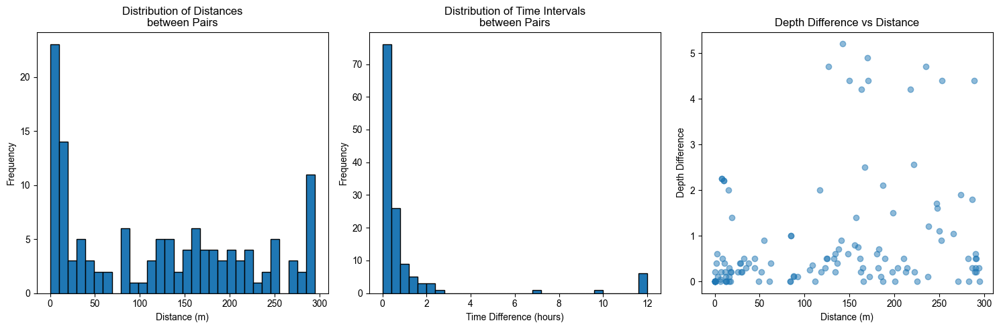


Pair-wise Metrics Summary:
Total number of pairs                                   42
Mean distance (m)                                 64.14701
Median distance (m)                              21.847363
Max distance (m)                                277.086929
Mean time difference (hours)                      0.757692
Median time difference (hours)                    0.079861
Max time difference (hours)                       7.508889
Pairs from same user (%)                         33.333333
Mean depth difference                             0.264286
Median depth difference                                0.0
Date range                        2024-05-26 to 2024-08-31
dtype: object


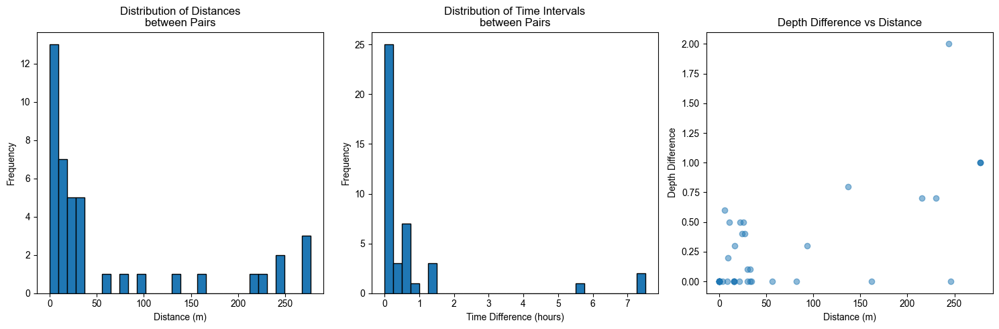

In [117]:
import numpy as np
import pandas as pd
from itertools import combinations
from datetime import datetime

import numpy as np
import pandas as pd
from itertools import combinations
from datetime import datetime

def calculate_pair_metrics(index_tuples, points_gdf_utm):
    """
    Calculate spatial distances and time intervals between pairs of points in each replicate group.
    
    Parameters:
    -----------
    index_tuples : list of tuples
        List of tuples containing row indices for replicate groups
    points_gdf_utm : GeoDataFrame
        DataFrame containing coordinates and image_date_photo_converted
        
    Returns:
    --------
    DataFrame containing pair-wise calculations for each replicate group
    """
    pair_data = []
    
    for group_idx, indices in enumerate(index_tuples):
        # Get all possible pairs in this group
        for idx1, idx2 in combinations(indices, 2):
            # Get points data
            point1 = points_gdf_utm.loc[idx1]
            point2 = points_gdf_utm.loc[idx2]
            
            # Calculate spatial distance (assuming coordinates are in meters)
            distance = np.sqrt((point1.geometry.x - point2.geometry.x)**2 + 
                             (point1.geometry.y - point2.geometry.y)**2)
            
            # Calculate time difference in hours
            time1 = pd.to_datetime(point1['image_date_photo_converted'], format='%Y-%m-%d %H:%M:%S')
            time2 = pd.to_datetime(point2['image_date_photo_converted'], format='%Y-%m-%d %H:%M:%S')
            time_diff_hours = abs((time2 - time1).total_seconds() / 3600)
            
            # Get Secchi depth values
            depth1 = point1['water_sd_depth']
            depth2 = point2['water_sd_depth']
            
            # Store pair information
            pair_data.append({
                'group_id': group_idx,
                'group_label': f'R{group_idx + 1}',
                'point1_idx': idx1,
                'point2_idx': idx2,
                'user1': point1['user_nickname'],
                'user2': point2['user_nickname'],
                'same_user': point1['user_nickname'] == point2['user_nickname'],
                'distance_m': distance,
                'time_diff_hours': time_diff_hours,
                'time1': time1,
                'time2': time2,
                'depth1': depth1,
                'depth2': depth2,
                'depth_diff': abs(depth1 - depth2) if (not np.isnan(depth1) and not np.isnan(depth2)) else np.nan
            })
    
    # Convert to DataFrame
    pair_df = pd.DataFrame(pair_data)
    
    # Add group size information
    group_sizes = pd.Series({group_idx: len(indices) for group_idx, indices in enumerate(index_tuples)})
    pair_df['group_size'] = pair_df['group_id'].map(group_sizes)
    
    return pair_df

def summarize_pair_metrics(pair_df):
    """
    Create summary statistics for the pair-wise measurements.
    """
    summary_stats = {
        'Total number of pairs': len(pair_df),
        'Mean distance (m)': pair_df['distance_m'].mean(),
        'Median distance (m)': pair_df['distance_m'].median(),
        'Max distance (m)': pair_df['distance_m'].max(),
        'Mean time difference (hours)': pair_df['time_diff_hours'].mean(),
        'Median time difference (hours)': pair_df['time_diff_hours'].median(),
        'Max time difference (hours)': pair_df['time_diff_hours'].max(),
        'Pairs from same user (%)': (pair_df['same_user'].sum() / len(pair_df)) * 100,
        'Mean depth difference': pair_df['depth_diff'].mean(),
        'Median depth difference': pair_df['depth_diff'].median(),
        'Date range': f"{pair_df['time1'].min().strftime('%Y-%m-%d')} to {pair_df['time2'].max().strftime('%Y-%m-%d')}"
    }
    
    return pd.Series(summary_stats)

def plot_pair_metrics(pair_df, figsize=(15, 5), fontsize=10):
    """
    Create visualizations of the pair-wise metrics.
    """
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=figsize)
    
    # Plot distance histogram
    ax1.hist(pair_df['distance_m'], bins=30, edgecolor='black')
    ax1.set_xlabel('Distance (m)', fontsize=fontsize)
    ax1.set_ylabel('Frequency', fontsize=fontsize)
    ax1.set_title('Distribution of Distances\nbetween Pairs', fontsize=fontsize+2)
    
    # Plot time difference histogram
    ax2.hist(pair_df['time_diff_hours'], bins=30, edgecolor='black')
    ax2.set_xlabel('Time Difference (hours)', fontsize=fontsize)
    ax2.set_ylabel('Frequency', fontsize=fontsize)
    ax2.set_title('Distribution of Time Intervals\nbetween Pairs', fontsize=fontsize+2)
    
    # Plot depth difference vs distance
    ax3.scatter(pair_df['distance_m'], pair_df['depth_diff'], alpha=0.5)
    ax3.set_xlabel('Distance (m)', fontsize=fontsize)
    ax3.set_ylabel('Depth Difference', fontsize=fontsize)
    ax3.set_title('Depth Difference vs Distance', fontsize=fontsize+2)
    
    plt.tight_layout()
    return fig, (ax1, ax2, ax3)


# Calculate pair-wise metrics
pair_df = calculate_pair_metrics(same_user_groups, points_gdf_utm_cleaned)

# Get summary statistics
summary = summarize_pair_metrics(pair_df)
print("\nPair-wise Metrics Summary:")
print(summary)

# Create visualizations
fig, axes = plot_pair_metrics(pair_df)
plt.show()


# Calculate pair-wise metrics
pair_df = calculate_pair_metrics(diff_user_groups, points_gdf_utm_cleaned)

# Get summary statistics
summary = summarize_pair_metrics(pair_df)
print("\nPair-wise Metrics Summary:")
print(summary)

# Create visualizations
fig, axes = plot_pair_metrics(pair_df)
plt.show()

### 2.6.1. Uncertainty : Same user replicates 

In [118]:
same_user_secchi_depths = extract_secchi_depths(same_user_groups, points_gdf_utm_cleaned)

# Print first few tuples to verify
# print("First few Secchi depth tuples:")
for i, depths in enumerate(same_user_secchi_depths[:5]):
    print(f"Replicate group {i+1}: {depths}")

Replicate group 1: (np.float64(12.52), np.float64(15.08))
Replicate group 2: (np.float64(11.7), np.float64(12.1))
Replicate group 3: (np.float64(12.3), np.float64(10.9))
Replicate group 4: (np.float64(8.95), np.float64(8.9))
Replicate group 5: (np.float64(8.95), np.float64(11.15))


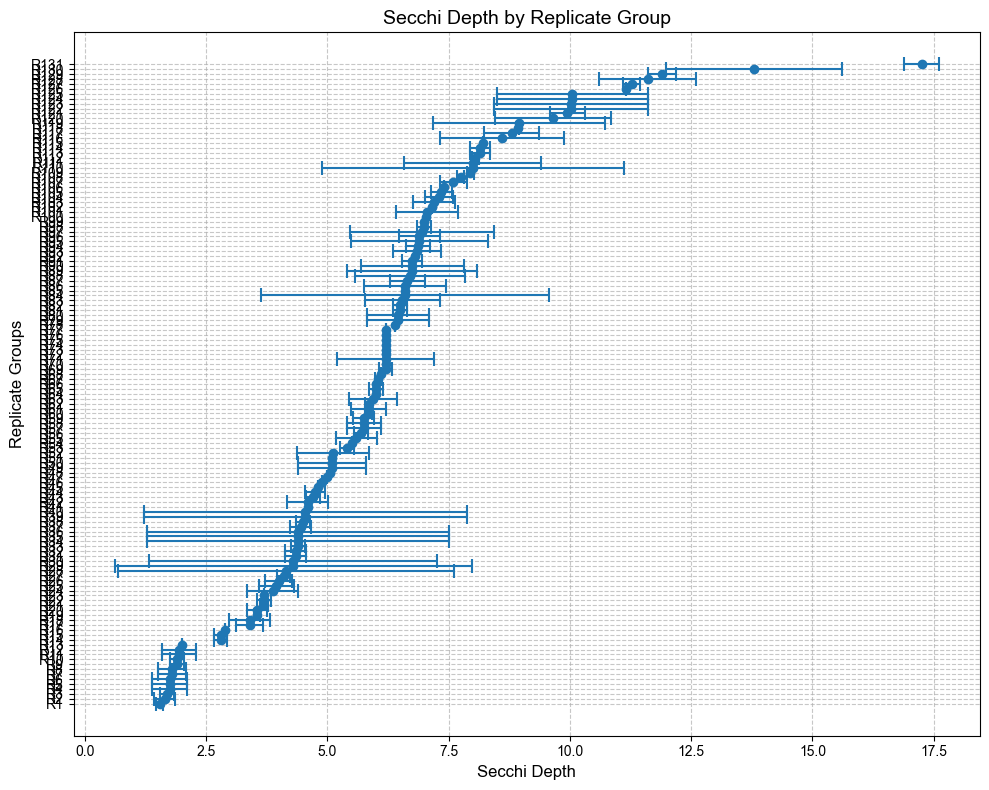


Summary Statistics:
    group_label user_name  n_users    mean       std  n_samples  \
50           R1      me_o        1   1.550  0.070711          2   
52           R2      me_o        1   1.650  0.212132          2   
55           R3      me_o        1   1.700  0.141421          2   
51           R4      me_o        1   1.750  0.353553          2   
53           R5      me_o        1   1.750  0.353553          2   
..          ...       ...      ...     ...       ...        ...   
129        R127      jimP        1  11.275  0.176777          2   
2          R128     TiMiX        1  11.600  0.989949          2   
1          R129     TiMiX        1  11.900  0.282843          2   
0          R130    clomat        1  13.800  1.810193          2   
127        R131    Popoch        1  17.250  0.353553          2   

     original_samples  group_id  
50                  2        50  
52                  2        52  
55                  2        55  
51                  2        51  
53  

In [119]:
# Example usage:
filtered_tuples, stats_df = filter_and_process_secchi_tuples(same_user_secchi_depths, same_user_groups, points_gdf_utm_cleaned)
fig, ax = plot_secchi_stats(stats_df)
plt.show()
# Print detailed statistics
print("\nSummary Statistics:")
print(stats_df)

C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\2131287681.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize_per_plot)


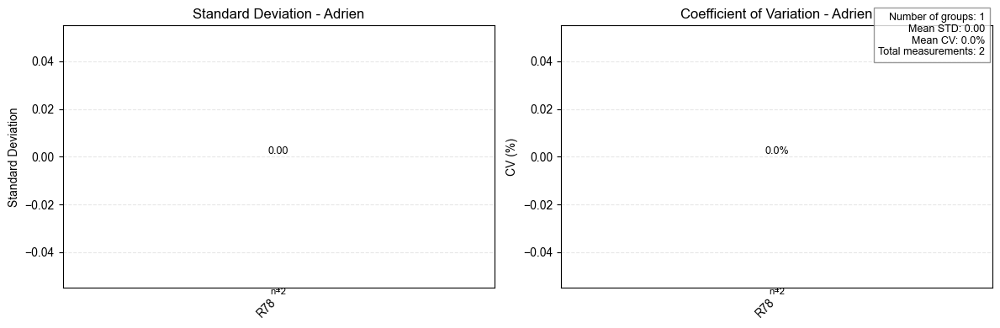

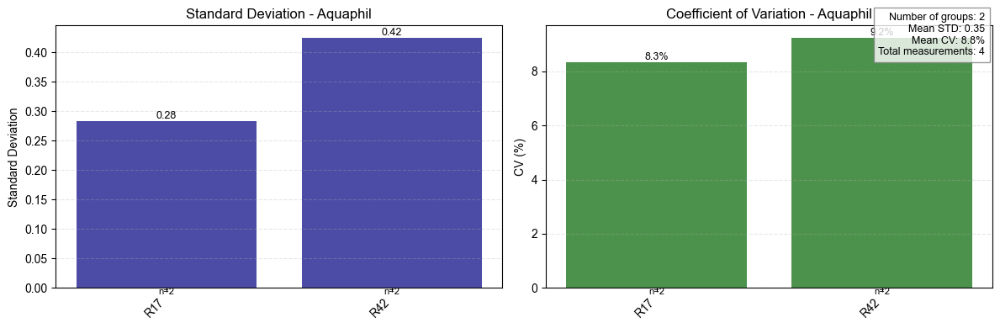

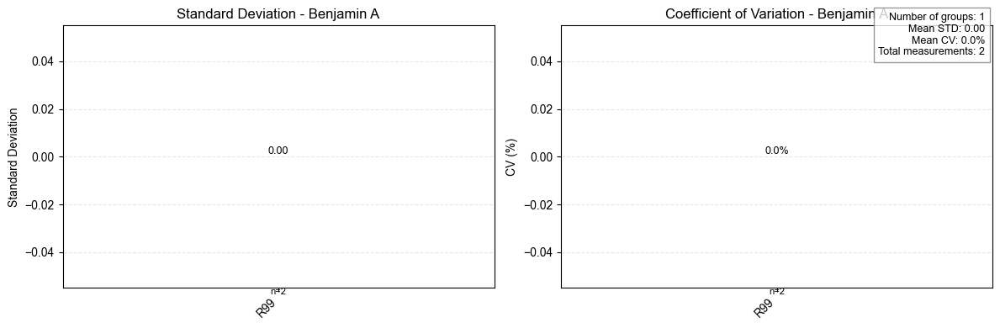

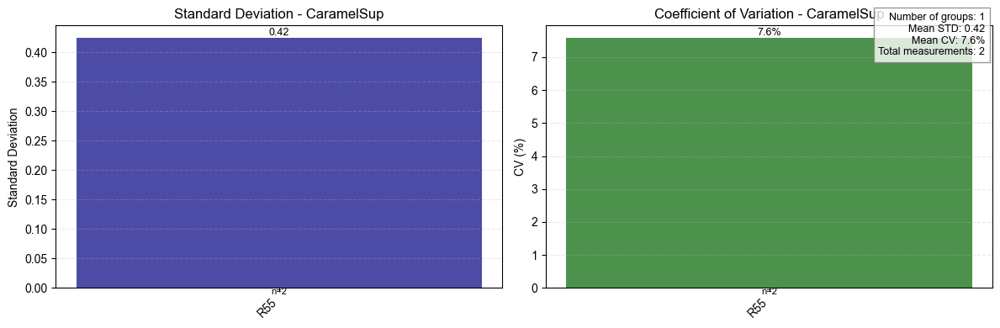

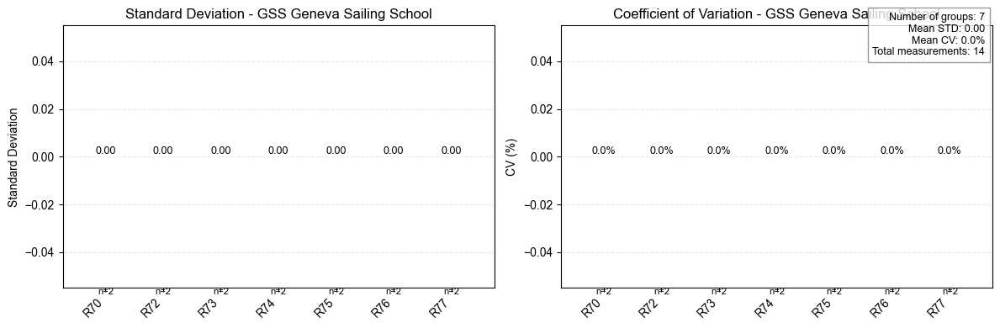

...

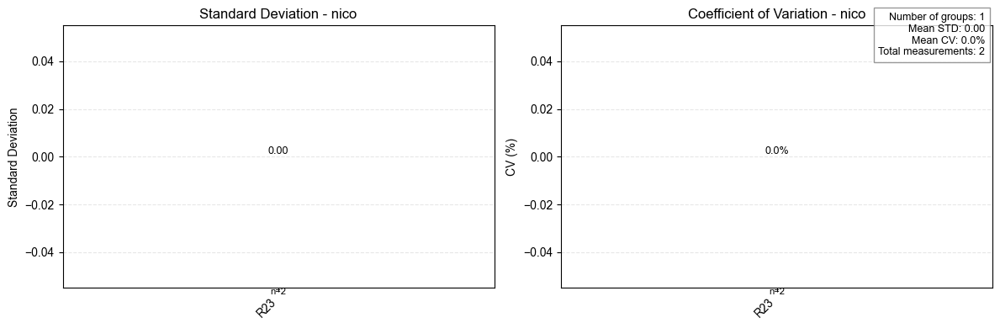

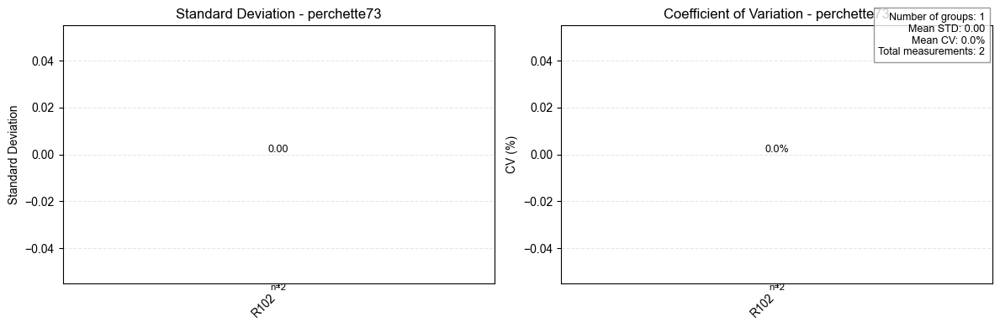

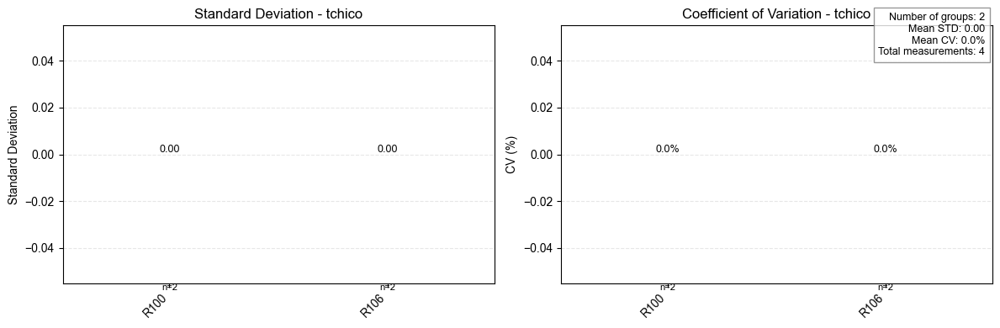

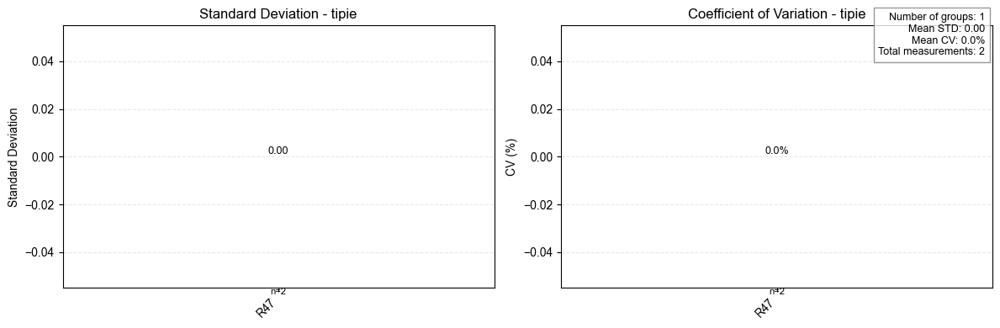

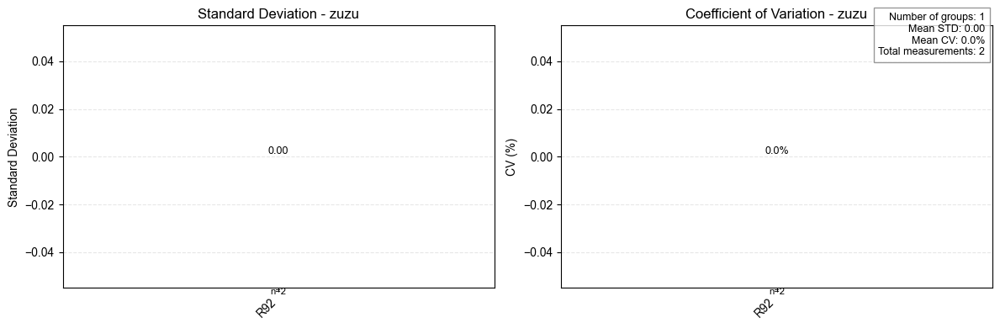

In [120]:
figs, axes_list = plot_variation_by_user_separate(stats_df)
plt.show()

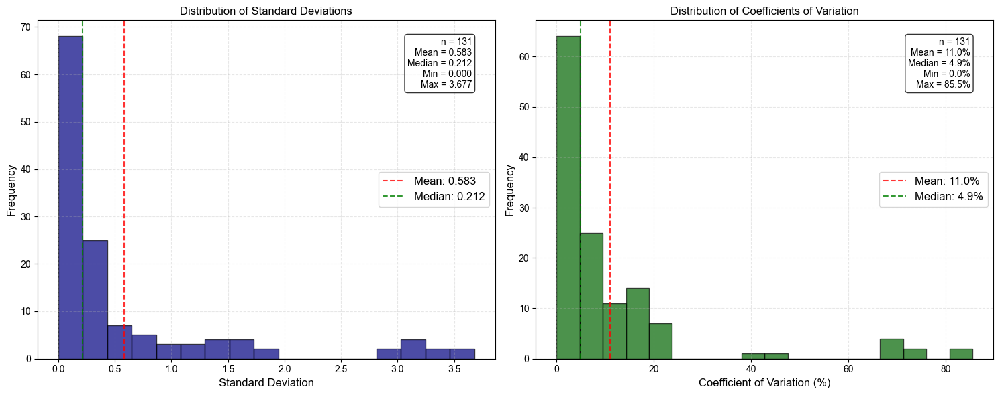


Summary Statistics:
           median         std          cv  n_samples
count  131.000000  131.000000  131.000000      131.0
mean     5.950802    0.582580   11.019669        2.0
std      2.569866    0.878707   17.994519        0.0
min      1.550000    0.000000    0.000000        2.0
25%      4.400000    0.070711    1.040584        2.0
50%      6.000000    0.212132    4.876598        2.0
75%      7.000000    0.636396   13.775388        2.0
max     17.250000    3.676955   85.510587        2.0


In [121]:
# # Calculate statistics including CV
stats_df = calculate_group_statistics(same_user_secchi_depths)

# Create histograms
fig, (ax1, ax2) = plot_variation_histograms(stats_df)
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(stats_df[['median', 'std', 'cv', 'n_samples']].describe())

### 2.6.2. Uncertainty : Replicates by different users

In [122]:
diff_user_secchi_depths = extract_secchi_depths(diff_user_groups, points_gdf_utm_cleaned)

# Print first few tuples to verify
# print("First few Secchi depth tuples:")
for i, depths in enumerate(diff_user_secchi_depths):
    print(f"Replicate group {i+1}: {depths}")

Replicate group 1: (np.float64(5.8), np.float64(5.8))
Replicate group 2: (np.float64(2.5), np.float64(2.9))
Replicate group 3: (np.float64(6.0), np.float64(5.2))
Replicate group 4: (np.float64(6.0), np.float64(5.3))
Replicate group 5: (np.float64(6.0), np.float64(5.3))
Replicate group 6: (np.float64(5.3), np.float64(5.3))
Replicate group 7: (np.float64(2.45), np.float64(2.45))
Replicate group 8: (np.float64(5.3), np.float64(7.3))
Replicate group 9: (np.float64(1.5), np.float64(2.0))
Replicate group 10: (np.float64(1.5), np.float64(1.5))
Replicate group 11: (np.float64(1.6), np.float64(2.0))
Replicate group 12: (np.float64(1.6), np.float64(1.5))
Replicate group 13: (np.float64(2.0), np.float64(2.0))
Replicate group 14: (np.float64(2.0), np.float64(1.5))
Replicate group 15: (np.float64(1.8), np.float64(2.0))
Replicate group 16: (np.float64(1.8), np.float64(1.5))
Replicate group 17: (np.float64(2.0), np.float64(2.0))
Replicate group 18: (np.float64(2.0), np.float64(1.5))
Replicate group 1

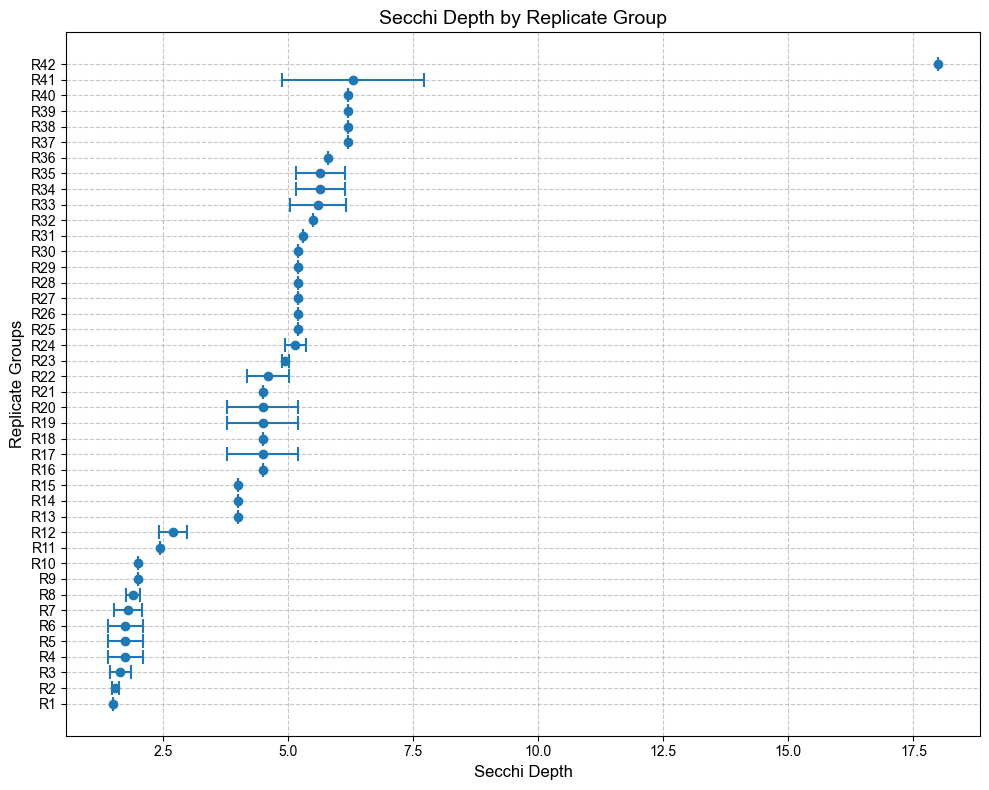


Summary Statistics:
   group_label       user_name  n_users   mean       std  n_samples  \
9           R1  Multiple Users        2   1.50  0.000000          2   
11          R2  Multiple Users        2   1.55  0.070711          2   
15          R3  Multiple Users        2   1.65  0.212132          2   
8           R4  Multiple Users        2   1.75  0.353553          2   
13          R5  Multiple Users        2   1.75  0.353553          2   
17          R6  Multiple Users        2   1.75  0.353553          2   
10          R7  Multiple Users        2   1.80  0.282843          2   
14          R8  Multiple Users        2   1.90  0.141421          2   
16          R9  Multiple Users        2   2.00  0.000000          2   
12         R10  Multiple Users        2   2.00  0.000000          2   
6          R11  Multiple Users        2   2.45  0.000000          2   
1          R12  Multiple Users        2   2.70  0.282843          2   
39         R13  Multiple Users        2   4.00  0.000000

In [123]:
# Example usage:
filtered_tuples, stats_df = filter_and_process_secchi_tuples(diff_user_secchi_depths, diff_user_groups, points_gdf_utm_cleaned)
fig, ax = plot_secchi_stats(stats_df)
plt.show()
# Print detailed statistics
print("\nSummary Statistics:")
print(stats_df)

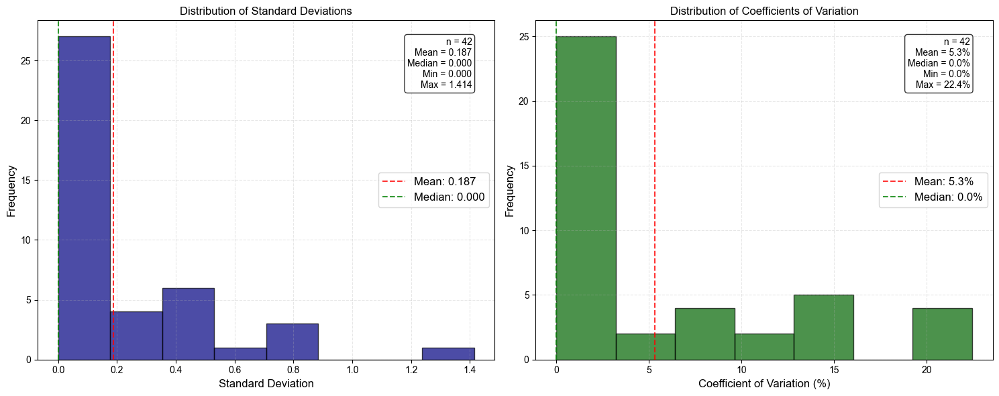


Summary Statistics:
          median        std         cv  n_samples
count  42.000000  42.000000  42.000000       42.0
mean    4.530952   0.186878   5.324803        2.0
std     2.664238   0.299521   7.384979        0.0
min     1.500000   0.000000   0.000000        2.0
25%     2.512500   0.000000   0.000000        2.0
50%     4.550000   0.000000   0.000000        2.0
75%     5.450000   0.335876   9.881927        2.0
max    18.000000   1.414214  22.447834        2.0


In [124]:
# # Calculate statistics including CV
stats_df = calculate_group_statistics(diff_user_secchi_depths)

# Create histograms
fig, (ax1, ax2) = plot_variation_histograms(stats_df)
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(stats_df[['median', 'std', 'cv', 'n_samples']].describe())

# 3. Measurement density heatmap

In [125]:
import rasterio


# Path to your input TIFF file
hillshade_path_4326 = parent_dir / 'data' / 'hillshade_4326.tif'

# Path to save the reprojected output TIFF file
hillshade_path_utm = parent_dir / 'data' / 'hillshade_utm.tif'

# Define the target UTM CRS (Coordinate Reference System)
target_crs = points_gdf_utm.crs

# Open the input raster
with rasterio.open(hillshade_path_4326) as src:
    # Calculate the transform and dimensions for the reprojected raster
    transform, width, height = calculate_default_transform(
        src.crs, target_crs, src.width, src.height, *src.bounds
    )

    # Update metadata for the output raster
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': target_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Create the output raster file
    with rasterio.open(hillshade_path_utm, 'w', **kwargs) as dst:
        # Reproject the raster
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest  # You can change the resampling method
            )
    
        # Calculate the resolution (pixel size in x and y directions)
        x_resolution = transform.a  # Pixel width (x-direction)
        y_resolution = -transform.e  # Pixel height (y-direction, typically negative)
    
        print(f"Resolution (x, y): ({x_resolution}, {y_resolution})")

print(f"Reprojected raster saved to: {hillshade_path_utm}")

Resolution (x, y): (26.53512280624391, 26.53512280624391)
Reprojected raster saved to: C:\Users\ghadyaya\git\lemanscope-qa\data\hillshade_utm.tif


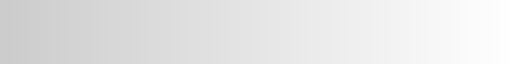

In [126]:
import matplotlib.colors as colors
color_vals = [[0.8, 0.8, 0.8, 1], [1.0, 1.0, 1.0, 1]]
shade_grey = colors.LinearSegmentedColormap.from_list("ShadeGrey", color_vals)
shade_grey

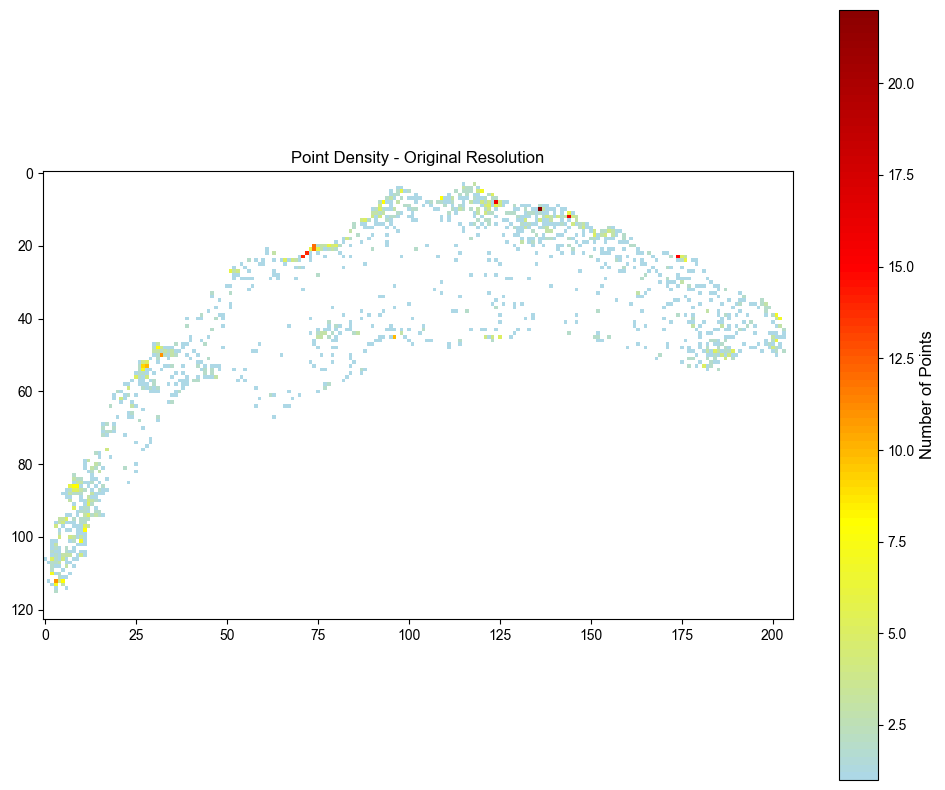


Statistics for Point Density - Original Resolution:
Maximum points per pixel: 22
Mean points per pixel: 1.75
Number of pixels with points: 1299
Total sum of points: 2273


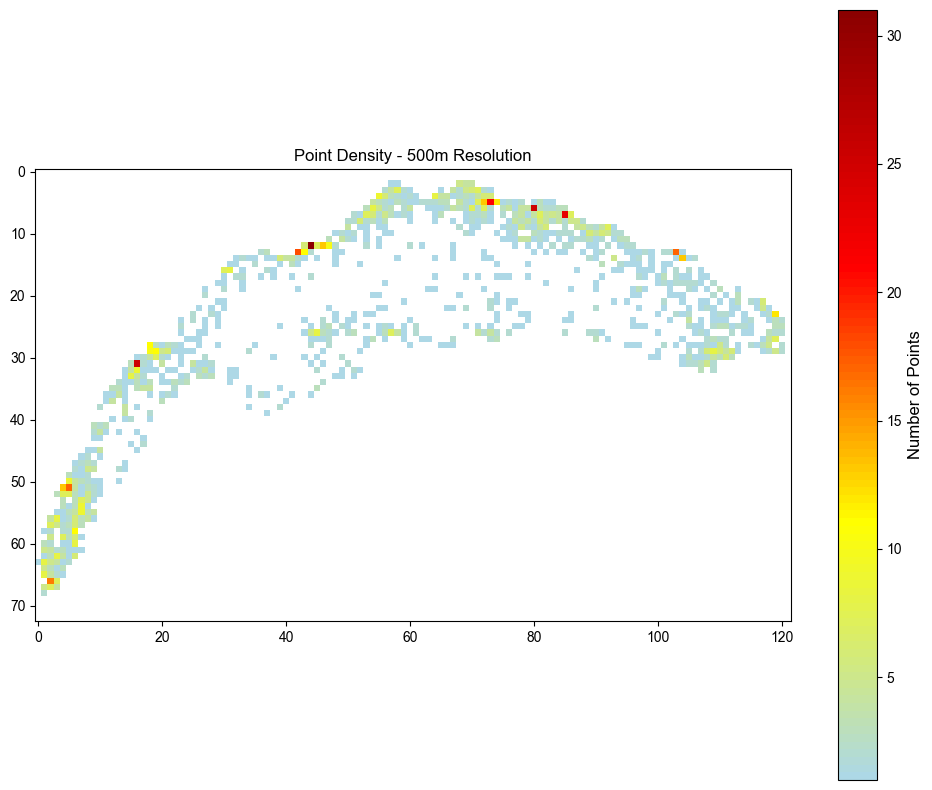


Statistics for Point Density - 500m Resolution:
Maximum points per pixel: 31
Mean points per pixel: 2.49
Number of pixels with points: 913
Total sum of points: 2273


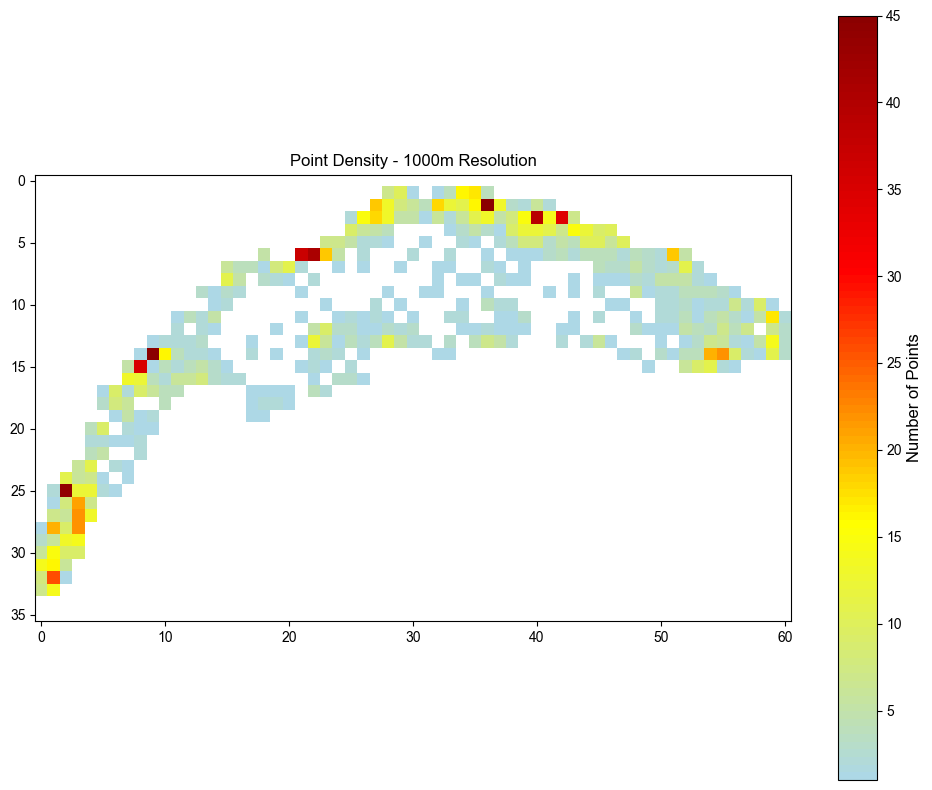


Statistics for Point Density - 1000m Resolution:
Maximum points per pixel: 45
Mean points per pixel: 5.21
Number of pixels with points: 436
Total sum of points: 2273

Rasters saved to:
Original resolution: C:\Users\ghadyaya\git\lemanscope-qa\outputs\point_density_original.tif
500m resolution: C:\Users\ghadyaya\git\lemanscope-qa\outputs\point_density_500m.tif
1000m resolution: C:\Users\ghadyaya\git\lemanscope-qa\outputs\point_density_1000m.tif


In [127]:
from rasterio.transform import from_bounds, rowcol

def create_and_plot_density_raster(points_gdf, binary_raster_path, output_path, resolution=None, title=""):
    """Create density raster and plot it with its own colorbar"""
    
    with rasterio.open(binary_raster_path) as src:
        binary_raster = src.read(1)
        bounds = src.bounds
        crs = src.crs
        
        if resolution is None:
            transform = src.transform
            count_array = np.zeros_like(binary_raster, dtype=np.float32)
            height, width = binary_raster.shape
        else:
            width = int((bounds.right - bounds.left) / resolution)
            height = int((bounds.top - bounds.bottom) / resolution)
            transform = from_bounds(bounds.left, bounds.bottom, 
                                 bounds.right, bounds.top, 
                                 width, height)
            count_array = np.zeros((height, width), dtype=np.float32)
        
        count_array.fill(np.nan)
        
        for point in points_gdf.geometry:
            row, col = rowcol(transform, point.x, point.y)
            if 0 <= row < height and 0 <= col < width:
                if np.isnan(count_array[row, col]):
                    count_array[row, col] = 1
                else:
                    count_array[row, col] += 1
        
        with rasterio.open(
            output_path,
            'w',
            driver='GTiff',
            height=height,
            width=width,
            count=1,
            dtype=count_array.dtype,
            crs=crs,
            transform=transform,
            nodata=np.nan
        ) as dst:
            dst.write(count_array, 1)
        
        # Create plot with its own colormap and colorbar
        fig, ax = plt.subplots(figsize=(10, 8))
        
        # Custom colormap
        colors = ['lightblue', 'yellow', 'red', 'darkred']
        custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=100)
        
        # Plot with colorbar
        im = ax.imshow(count_array, cmap=custom_cmap)
        plt.colorbar(im, ax=ax, label='Number of Points')
        
        ax.set_title(title)
        plt.tight_layout()
        plt.show()
        
        # Calculate and print statistics
        total_points = np.nansum(count_array)
        print(f"\nStatistics for {title}:")
        print(f"Maximum points per pixel: {np.nanmax(count_array):.0f}")
        print(f"Mean points per pixel: {np.nanmean(count_array[~np.isnan(count_array)]):.2f}")
        print(f"Number of pixels with points: {np.sum(~np.isnan(count_array))}")
        print(f"Total sum of points: {total_points:.0f}")
        
        return count_array

binary_raster_path =  parent_dir / 'outputs' / 'cropped_binary_mask_utm.tif'

# Create and plot each resolution separately
original_output = parent_dir / 'outputs' / 'point_density_original.tif'
count_original = create_and_plot_density_raster(
    points_gdf_utm[points_gdf_utm['LOC_OOB']==0], 
    binary_raster_path, 
    original_output, 
    title='Point Density - Original Resolution'
)

output_500m = parent_dir / 'outputs' / 'point_density_500m.tif'
count_500m = create_and_plot_density_raster(
    points_gdf_utm[points_gdf_utm['LOC_OOB']==0], 
    binary_raster_path, 
    output_500m, 
    resolution=500,
    title='Point Density - 500m Resolution'
)

output_1000m = parent_dir / 'outputs' / 'point_density_1000m.tif'
count_1000m = create_and_plot_density_raster(
    points_gdf_utm[points_gdf_utm['LOC_OOB']==0], 
    binary_raster_path, 
    output_1000m, 
    resolution=1000,
    title='Point Density - 1000m Resolution'
)

print(f"\nRasters saved to:")
print(f"Original resolution: {original_output}")
print(f"500m resolution: {output_500m}")
print(f"1000m resolution: {output_1000m}")

### 3.1. viridis, powernorm

In [130]:
hillshade_path_cropped = parent_dir / 'data' / 'hillshade_utm_cropped.tif'

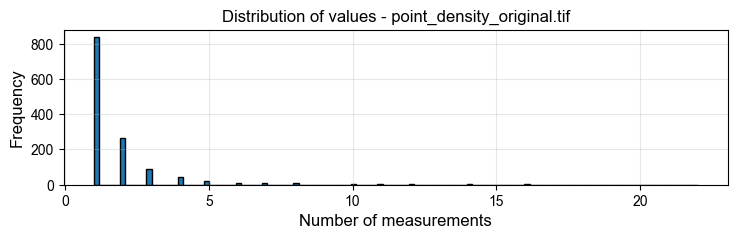

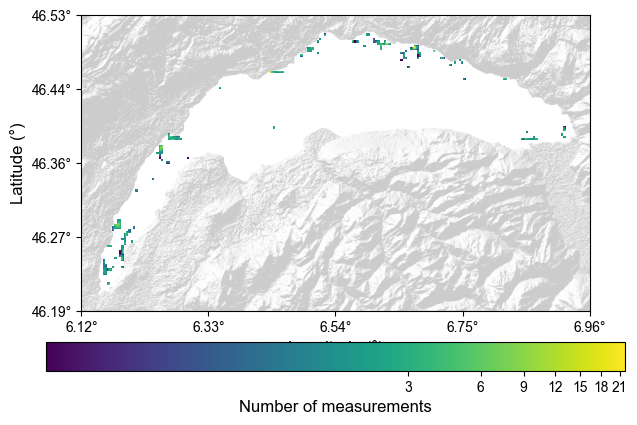

Sum of values in point_density_original.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 14. 15. 16. 22.]


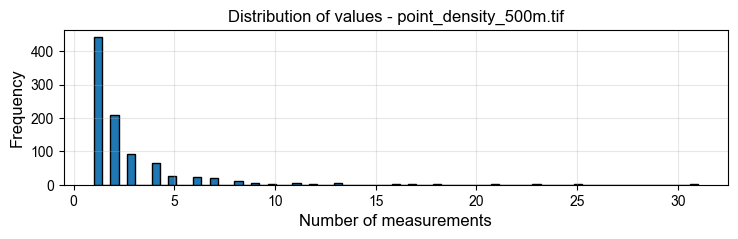

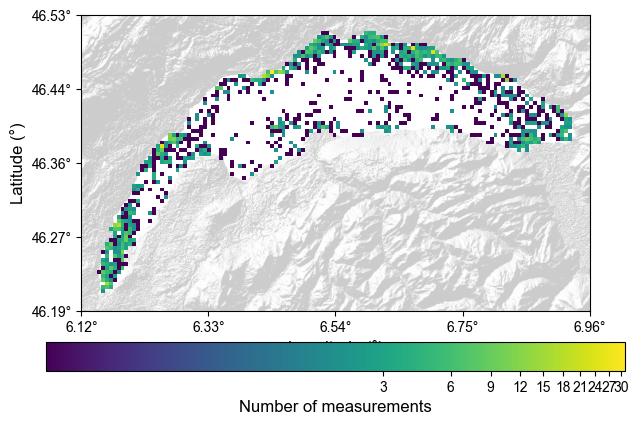

Sum of values in point_density_500m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 16. 17. 18. 21. 23.
 25. 31.]


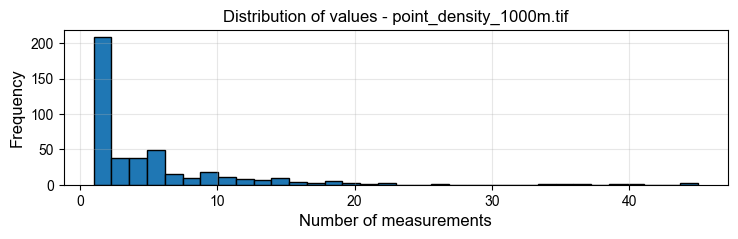

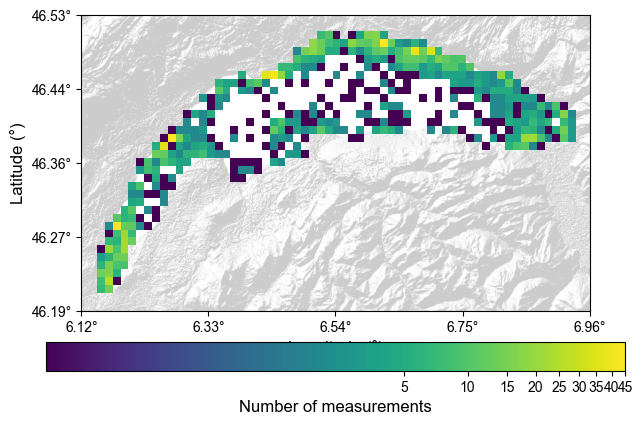

Sum of values in point_density_1000m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 26. 34. 35. 37. 39. 41. 44. 45.]


In [132]:
import matplotlib.colors as color
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
from pyproj import Transformer

for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        #transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create histogram first to determine color limits
        valid_values = raster1[~np.isnan(raster1)]
        plt.figure(figsize=(width_inches, height_inches/2))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()

        norm = colors.PowerNorm(gamma=0.2)
        
        # Show both layers without alpha
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        show(raster1, transform=transform1, ax=ax, cmap='viridis', 
              norm = norm)#vmin=np.nanmin(raster1), vmax=np.nanmax(raster1),

                # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        # Set the extent to match hillshade
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)

                # Convert UTM coordinates to WGS84 for tick labels
        # Get corner coordinates of the plot
        x_ticks = np.linspace(hillshade_bounds.left, hillshade_bounds.right, 5)
        y_ticks = np.linspace(hillshade_bounds.bottom, hillshade_bounds.top, 5)
        
        # Function to convert UTM to Lat/Lon for x-axis ticks
        def utm_to_lon(x):
            lon, lat = transformer.transform(x, hillshade_bounds.bottom)
            return f"{lon:.2f}°"
        
        # Function to convert UTM to Lat/Lon for y-axis ticks
        def utm_to_lat(y):
            lon, lat = transformer.transform(hillshade_bounds.left, y)
            return f"{lat:.2f}°"
        
        # Set custom tick formatters to display WGS84 coordinates
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Set tick positions
        ax.set_xticks(x_ticks)
        ax.set_yticks(y_ticks)
        
        # Function to convert UTM to Lat/Lon for x-axis
        # def utm_to_lon(x):
        #     lon, _ = transformer.transform(x, hillshade_bounds.bottom)
        #     return f"{lon:.2f}°"
        
        # # Function to convert UTM to Lat/Lon for y-axis
        # def utm_to_lat(y):
        #     _, lat = transformer.transform(hillshade_bounds.left, y)
        #     return f"{lat:.2f}°"
        
        # Set custom tick formatters
        # ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        # ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Add colorbar
        cbar = plt.colorbar(ax.images[1], ax=ax, orientation='horizontal', pad=0.08)
        cbar.set_label('Number of measurements')
        cbar.locator = MaxNLocator(integer=True)
        cbar.update_ticks()
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')

        
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

In [133]:
# import matplotlib.colors as color
# import rasterio
# from rasterio.plot import show
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer

# for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
#     # Paths to the two raster files
#     raster1_path = parent_dir / 'outputs' / raster1_name
#     raster2_path = hillshade_path_cropped
    
#     # Open both rasters
#     with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
#         raster1 = src1.read(1)
#         transform1 = src1.transform
#         crs1 = src1.crs
        
#         raster2 = src2.read(1)
#         transform2 = src2.transform
#         crs2 = src2.crs
        
#         # Get hillshade bounds
#         hillshade_bounds = src2.bounds
        
#         # Create transformer from UTM to WGS84
#         transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
#         if crs1 != crs2:
#             raise ValueError("The two rasters must have the same CRS.")
        
#         # Create histogram first to determine color limits
#         valid_values = raster1[~np.isnan(raster1)]
#         plt.figure(figsize=(width_inches, height_inches/2))
#         plt.hist(valid_values, bins='auto', edgecolor='black')
#         plt.xlabel('Number of measurements')
#         plt.ylabel('Frequency')
#         plt.title(f'Distribution of values - {raster1_name}')
#         plt.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
    
#         plt.figure(figsize=(2*width_inches, 2*height_inches))
#         ax = plt.gca()

#         norm = colors.PowerNorm(gamma=0.2)
        
#         # Show both layers without alpha
#         show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
#         show(raster1, transform=transform1, ax=ax, cmap='viridis', 
#               norm = norm)#vmin=np.nanmin(raster1), vmax=np.nanmax(raster1),
        
#         # Set the extent to match hillshade
#         ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
#         ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
#         # Function to convert UTM to Lat/Lon for x-axis
#         def utm_to_lon(x):
#             lon, _ = transformer.transform(x, hillshade_bounds.bottom)
#             return f"{lon:.2f}°"
        
#         # Function to convert UTM to Lat/Lon for y-axis
#         def utm_to_lat(y):
#             _, lat = transformer.transform(hillshade_bounds.left, y)
#             return f"{lat:.2f}°"
        
#         # Set custom tick formatters
#         ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
#         ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
#         # Add colorbar
#         cbar = plt.colorbar(ax.images[1], ax=ax, orientation='horizontal', pad=0.08)
#         cbar.set_label('Number of measurements')
#         cbar.locator = MaxNLocator(integer=True)
#         cbar.update_ticks()
        
#         plt.xlabel('Longitude (°)')
#         plt.ylabel('Latitude (°)')
#         ax.set_aspect('equal')

        
#         plt.show()
#         print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
#         print(f"Unique values: {np.unique(valid_values)}")

### 3.2. Discrete values


Value counts for point_density_original.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 836        | 64.36%
2.0        | 268        | 20.63%
3.0        | 90         | 6.93%
4.0        | 46         | 3.54%
5.0        | 22         | 1.69%
6.0        | 10         | 0.77%
7.0        | 7          | 0.54%
8.0        | 7          | 0.54%
9.0        | 1          | 0.08%
10.0       | 2          | 0.15%
11.0       | 2          | 0.15%
12.0       | 2          | 0.15%
14.0       | 2          | 0.15%
15.0       | 1          | 0.08%
16.0       | 2          | 0.15%
22.0       | 1          | 0.08%
------------------------------


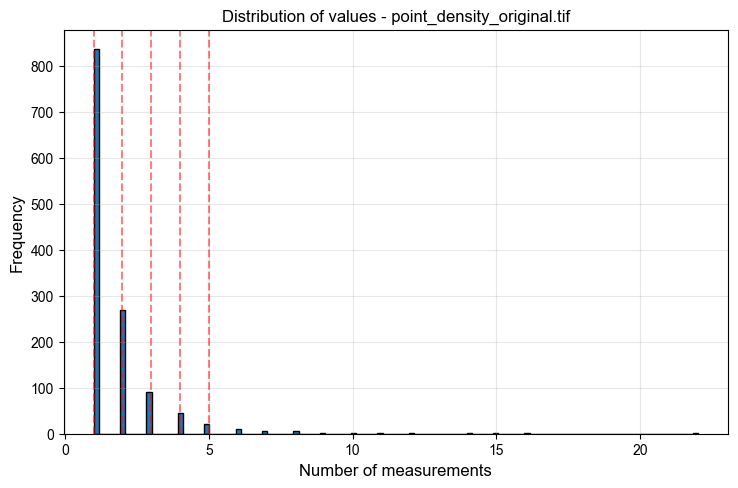


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 23.]
Number of categories: 5
Category 1: 1.0, 836 pixels
Category 2: 2.0, 268 pixels
Category 3: 3.0, 90 pixels
Category 4: 4.0, 46 pixels
Category 5: 5.0 - 23.0, 59 pixels


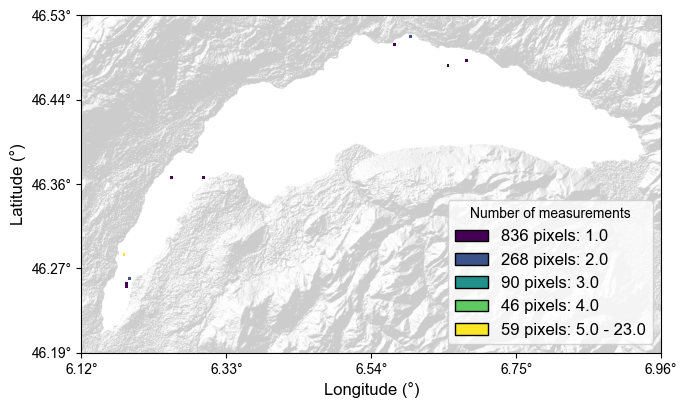

Sum of values in point_density_original.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 14. 15. 16. 22.]

Value counts for point_density_500m.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 441        | 48.30%
2.0        | 208        | 22.78%
3.0        | 92         | 10.08%
4.0        | 65         | 7.12%
5.0        | 27         | 2.96%
6.0        | 22         | 2.41%
7.0        | 21         | 2.30%
8.0        | 11         | 1.20%
9.0        | 5          | 0.55%
10.0       | 2          | 0.22%
11.0       | 4          | 0.44%
12.0       | 2          | 0.22%
13.0       | 4          | 0.44%
16.0       | 1          | 0.11%
17.0       | 2          | 0.22%
18.0       | 1          | 0.11%
21.0       | 1          | 0.11%
23.0       | 1          | 0.11%
25.0       | 2          | 0.22%
31.0       | 1          | 0.11%
------------------------------


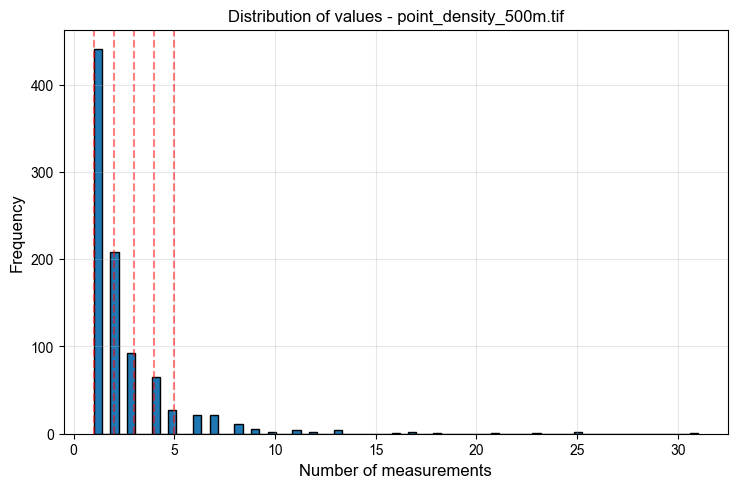


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 32.]
Number of categories: 5
Category 1: 1.0, 441 pixels
Category 2: 2.0, 208 pixels
Category 3: 3.0, 92 pixels
Category 4: 4.0, 65 pixels
Category 5: 5.0 - 32.0, 107 pixels


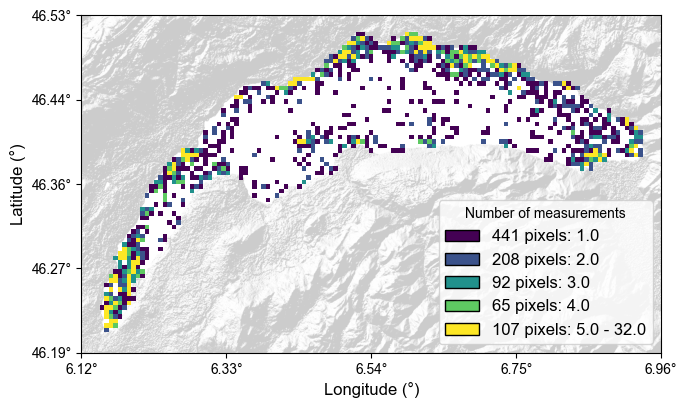

Sum of values in point_density_500m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 16. 17. 18. 21. 23.
 25. 31.]

Value counts for point_density_1000m.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 122        | 27.98%
2.0        | 86         | 19.72%
3.0        | 38         | 8.72%
4.0        | 38         | 8.72%
5.0        | 27         | 6.19%
6.0        | 22         | 5.05%
7.0        | 15         | 3.44%
8.0        | 9          | 2.06%
9.0        | 13         | 2.98%
10.0       | 5          | 1.15%
11.0       | 11         | 2.52%
12.0       | 8          | 1.83%
13.0       | 7          | 1.61%
14.0       | 5          | 1.15%
15.0       | 4          | 0.92%
16.0       | 4          | 0.92%
17.0       | 2          | 0.46%
18.0       | 2          | 0.46%
19.0       | 3          | 0.69%
20.0       | 2          | 0.46%
21.0       | 1          | 0.23%
22.0       | 3          | 0.69%
26.0  

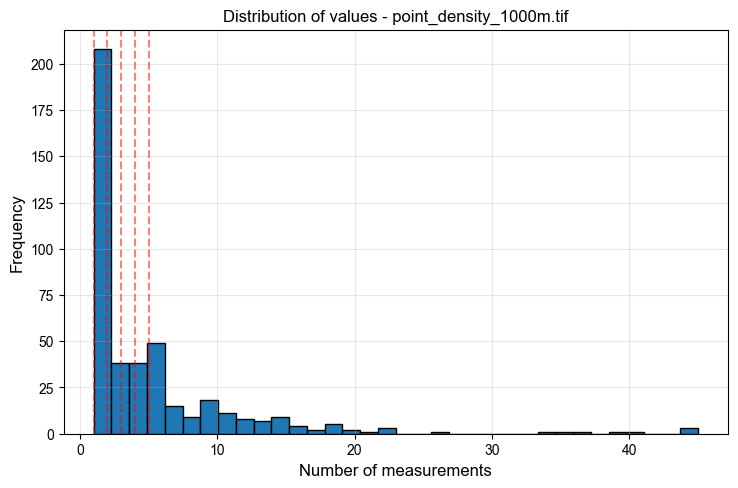


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 46.]
Number of categories: 5
Category 1: 1.0, 122 pixels
Category 2: 2.0, 86 pixels
Category 3: 3.0, 38 pixels
Category 4: 4.0, 38 pixels
Category 5: 5.0 - 46.0, 152 pixels


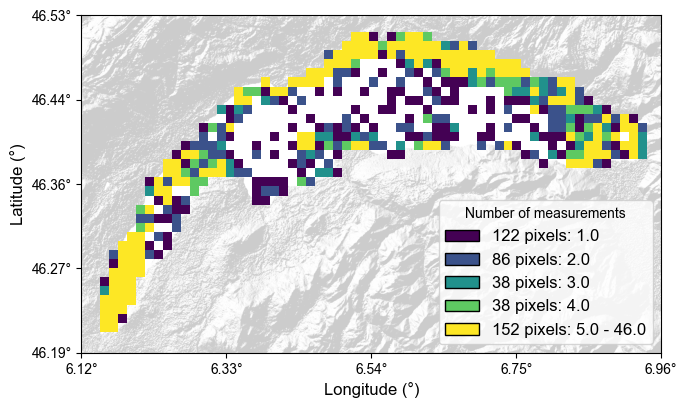

Sum of values in point_density_1000m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 26. 34. 35. 37. 39. 41. 44. 45.]


In [134]:
colors_list = ['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725']

from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create table of unique values and their counts
        valid_values = raster1[~np.isnan(raster1)]
        unique_values = np.unique(valid_values)
        value_counts = {val: np.sum(raster1 == val) for val in unique_values}
        
        # Display table of value counts
        print(f"\nValue counts for {raster1_name}:")
        print("-" * 30)
        print(f"{'Value':<10} | {'Count':<10} | {'Percentage':<10}")
        print("-" * 30)
        total_valid_pixels = len(valid_values)
        for val in sorted(unique_values):
            count = value_counts[val]
            percentage = (count / total_valid_pixels) * 100
            print(f"{val:<10} | {count:<10} | {percentage:.2f}%")
        print("-" * 30)
        
        # Define boundaries based on unique values
        sorted_unique = np.sort(unique_values)
        num_unique = len(sorted_unique)
        
        # Adjust category creation strategy based on number of unique values
        if num_unique <= 5:
            # If 5 or fewer unique values, each value gets its own category
            category_bounds = np.append(sorted_unique, sorted_unique[-1] + 1)
            # Ensure the first bound is 1
            if category_bounds[0] > 1:
                category_bounds = np.insert(category_bounds, 0, 1)
        elif num_unique <= 10:
            # If 6-10 unique values, group into 5 categories as evenly as possible
            indices = np.linspace(0, num_unique, 6, dtype=int)
            category_bounds = np.concatenate(([1], sorted_unique[indices[1:]-1] + 1))
        else:
            # For many unique values, create categories with individual small values
            # and group larger values
            if sorted_unique[0] != 1:
                individual_values = np.append([1], sorted_unique[:4])
            else:
                individual_values = sorted_unique[:5]
            
            # Group remaining values
            max_value = sorted_unique[-1]
            
            # Create category boundaries
            category_bounds = np.concatenate((
                individual_values,
                [max_value + 1]  # Add one beyond max for the last bound
            ))
        
        # Show histogram and map
        plt.figure(figsize=(width_inches, height_inches))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        
        # Add vertical lines for category boundaries
        for bound in category_bounds:
            if bound <= np.nanmax(raster1):
                plt.axvline(x=bound, color='r', linestyle='--', alpha=0.5)
            
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        # Approach using individual masks for each category
        # Clear the figure for the map
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Define colors list
        #colors_list = ["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014']
        
        # Create mask for each category based on the boundaries
        masked_arrays = []
        labels = []
        
        # Create categories based on the boundaries
        num_categories = len(category_bounds) - 1
        if num_categories > 5:
            # Limit to 5 categories - combine the last ones
            category_bounds = np.concatenate((category_bounds[:5], [category_bounds[-1]]))
            num_categories = 5
        
        colors_list = colors_list[:num_categories]  # Truncate if too many
        
        # Create each category
        for i in range(num_categories):
            lower = category_bounds[i]
            upper = category_bounds[i+1] - 1 if i < num_categories - 1 else category_bounds[i+1]
            
            if lower == upper:
                # Single value category
                mask = (raster1 == lower)
                value_label = f"{lower}"
            elif i == num_categories - 1:
                # Last category includes upper bound
                mask = (raster1 >= lower) & (raster1 <= upper)
                value_label = f"{lower} - {upper}"
            else:
                # Other categories exclude upper bound
                mask = (raster1 >= lower) & (raster1 < upper)
                value_label = f"{lower} - {upper-1}"
            
            # Count pixels in this category
            count = np.sum(mask)
            
            # Only add category if it has pixels
            if count > 0:
                masked_array = np.ma.masked_array(raster1, ~mask)
                labels.append(f"{count} pixels: {value_label}")
                masked_arrays.append((masked_array, colors_list[i]))
                
        # Print the category information
        print("\nCategory information:")
        print(f"Category bounds: {category_bounds}")
        print(f"Number of categories: {num_categories}")
        
        for i in range(num_categories):
            lower = category_bounds[i]
            upper = category_bounds[i+1] - 1 if i < num_categories - 1 else category_bounds[i+1]
            
            if lower == upper:
                range_text = f"{lower}"
            elif i == num_categories - 1:
                range_text = f"{lower} - {upper}"
            else:
                range_text = f"{lower} - {upper-1}"
                
            if i < len(labels):
                print(f"Category {i+1}: {range_text}, {labels[i].split(':')[0]}")
            else:
                count = np.sum((raster1 >= lower) & (raster1 <= (upper if i == num_categories - 1 else upper-1)))
                percentage = (count / total_valid_pixels) * 100
                print(f"Category {i+1}: {range_text}, {count} pixels ({percentage:.1f}%)")
        
        # Plot each masked array separately
        for masked_array, color in masked_arrays:
            # Create a single-color colormap
            single_color_cmap = ListedColormap([color])
            
            # Use rasterio's show function which properly handles the transform
            show(masked_array, transform=transform1, ax=ax, cmap=single_color_cmap)
        
        # Set the extent to match hillshade bounds
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # Convert UTM coordinates to WGS84 for tick labels
        # Get corner coordinates of the plot
        x_ticks = np.linspace(hillshade_bounds.left, hillshade_bounds.right, 5)
        y_ticks = np.linspace(hillshade_bounds.bottom, hillshade_bounds.top, 5)
        
        # Function to convert UTM to Lat/Lon for x-axis ticks
        def utm_to_lon(x):
            lon, lat = transformer.transform(x, hillshade_bounds.bottom)
            return f"{lon:.2f}°"
        
        # Function to convert UTM to Lat/Lon for y-axis ticks
        def utm_to_lat(y):
            lon, lat = transformer.transform(hillshade_bounds.left, y)
            return f"{lat:.2f}°"
        
        # Set custom tick formatters to display WGS84 coordinates
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Set tick positions
        ax.set_xticks(x_ticks)
        ax.set_yticks(y_ticks)
        
        # Create legend
        from matplotlib.patches import Patch
        legend_elements = []
        for i, (label, color) in enumerate(zip(labels, colors_list[:len(labels)])):
            legend_elements.append(
                Patch(facecolor=color, edgecolor='black', label=label)
            )
        
        # Add the legend
        ax.legend(handles=legend_elements, title='Number of measurements',
                 loc='lower right', frameon=True, framealpha=0.8)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

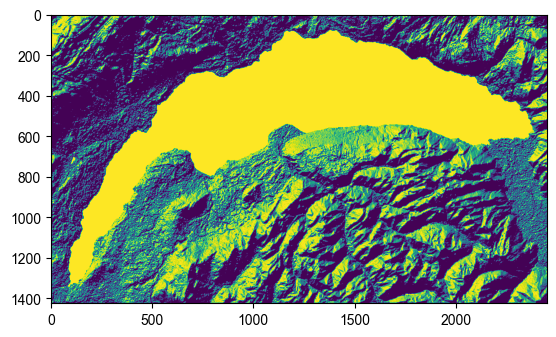

In [135]:
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster2_path) as src2:
        raster1 = src2.read(1)
        plt.imshow(raster1)


Value counts for point_density_original.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 836        | 64.36%
2.0        | 268        | 20.63%
3.0        | 90         | 6.93%
4.0        | 46         | 3.54%
5.0        | 22         | 1.69%
6.0        | 10         | 0.77%
7.0        | 7          | 0.54%
8.0        | 7          | 0.54%
9.0        | 1          | 0.08%
10.0       | 2          | 0.15%
11.0       | 2          | 0.15%
12.0       | 2          | 0.15%
14.0       | 2          | 0.15%
15.0       | 1          | 0.08%
16.0       | 2          | 0.15%
22.0       | 1          | 0.08%
------------------------------


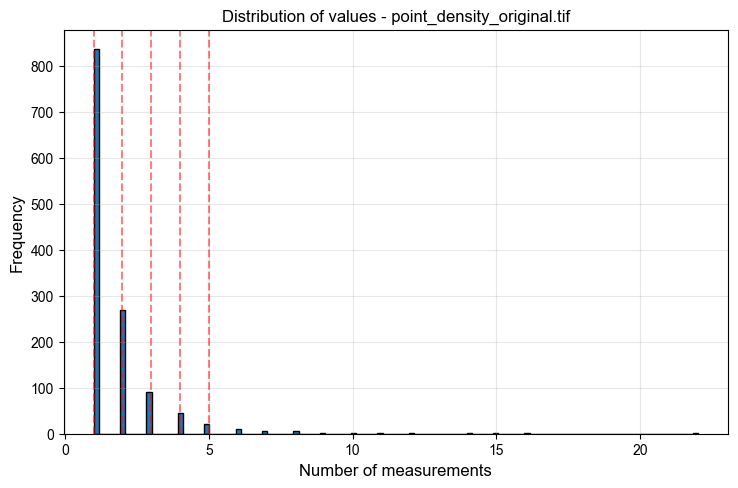


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 23.]
Number of categories: 5
Category 1: 1.0, 836 pixels
Category 2: 2.0, 268 pixels
Category 3: 3.0, 90 pixels
Category 4: 4.0, 46 pixels
Category 5: 5.0 - 23.0, 59 pixels


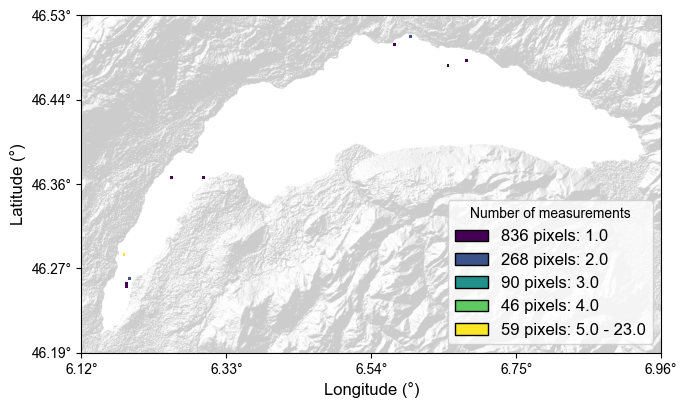

Sum of values in point_density_original.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 14. 15. 16. 22.]

Value counts for point_density_500m.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 441        | 48.30%
2.0        | 208        | 22.78%
3.0        | 92         | 10.08%
4.0        | 65         | 7.12%
5.0        | 27         | 2.96%
6.0        | 22         | 2.41%
7.0        | 21         | 2.30%
8.0        | 11         | 1.20%
9.0        | 5          | 0.55%
10.0       | 2          | 0.22%
11.0       | 4          | 0.44%
12.0       | 2          | 0.22%
13.0       | 4          | 0.44%
16.0       | 1          | 0.11%
17.0       | 2          | 0.22%
18.0       | 1          | 0.11%
21.0       | 1          | 0.11%
23.0       | 1          | 0.11%
25.0       | 2          | 0.22%
31.0       | 1          | 0.11%
------------------------------


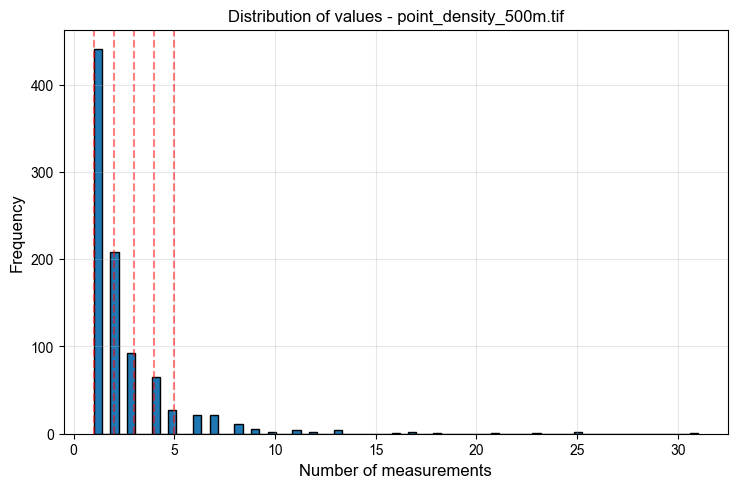


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 32.]
Number of categories: 5
Category 1: 1.0, 441 pixels
Category 2: 2.0, 208 pixels
Category 3: 3.0, 92 pixels
Category 4: 4.0, 65 pixels
Category 5: 5.0 - 32.0, 107 pixels


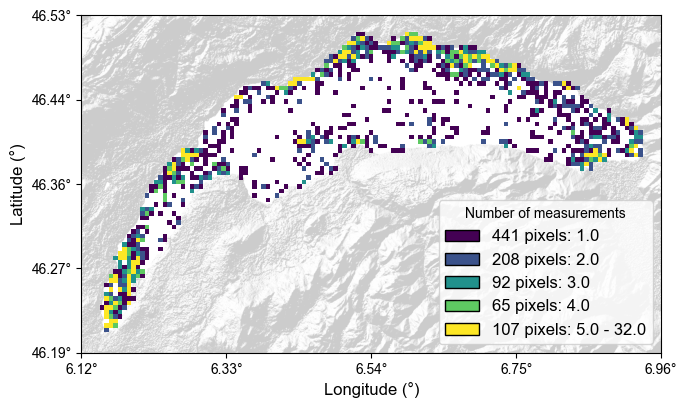

Sum of values in point_density_500m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 16. 17. 18. 21. 23.
 25. 31.]

Value counts for point_density_1000m.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 122        | 27.98%
2.0        | 86         | 19.72%
3.0        | 38         | 8.72%
4.0        | 38         | 8.72%
5.0        | 27         | 6.19%
6.0        | 22         | 5.05%
7.0        | 15         | 3.44%
8.0        | 9          | 2.06%
9.0        | 13         | 2.98%
10.0       | 5          | 1.15%
11.0       | 11         | 2.52%
12.0       | 8          | 1.83%
13.0       | 7          | 1.61%
14.0       | 5          | 1.15%
15.0       | 4          | 0.92%
16.0       | 4          | 0.92%
17.0       | 2          | 0.46%
18.0       | 2          | 0.46%
19.0       | 3          | 0.69%
20.0       | 2          | 0.46%
21.0       | 1          | 0.23%
22.0       | 3          | 0.69%
26.0  

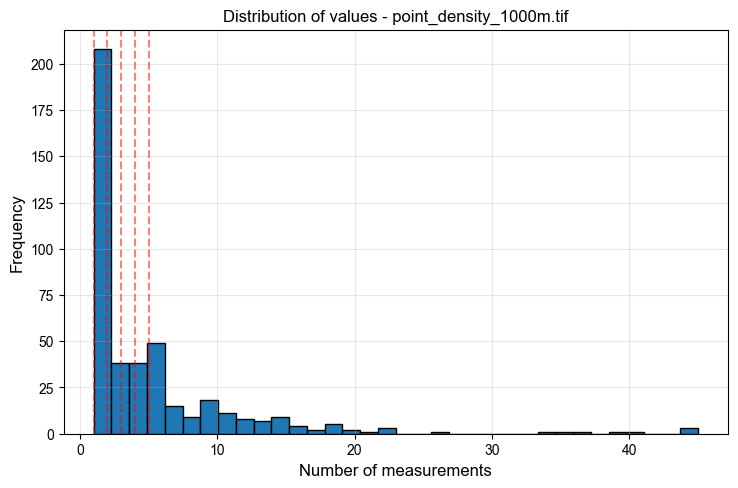


Category information:
Category bounds: [ 1.  2.  3.  4.  5. 46.]
Number of categories: 5
Category 1: 1.0, 122 pixels
Category 2: 2.0, 86 pixels
Category 3: 3.0, 38 pixels
Category 4: 4.0, 38 pixels
Category 5: 5.0 - 46.0, 152 pixels


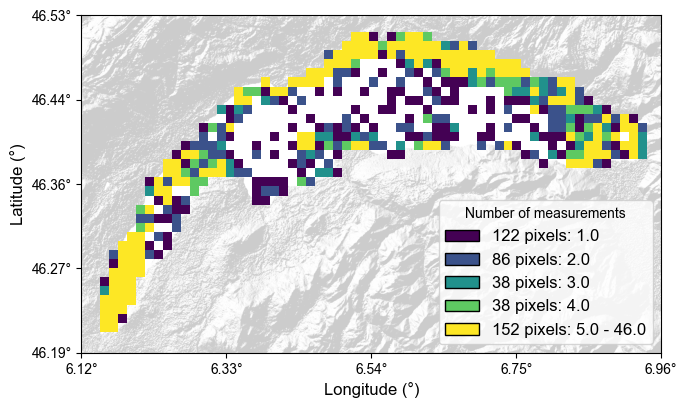

Sum of values in point_density_1000m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 26. 34. 35. 37. 39. 41. 44. 45.]


In [136]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create table of unique values and their counts
        valid_values = raster1[~np.isnan(raster1)]
        unique_values = np.unique(valid_values)
        value_counts = {val: np.sum(raster1 == val) for val in unique_values}
        
        # Display table of value counts
        print(f"\nValue counts for {raster1_name}:")
        print("-" * 30)
        print(f"{'Value':<10} | {'Count':<10} | {'Percentage':<10}")
        print("-" * 30)
        total_valid_pixels = len(valid_values)
        for val in sorted(unique_values):
            count = value_counts[val]
            percentage = (count / total_valid_pixels) * 100
            print(f"{val:<10} | {count:<10} | {percentage:.2f}%")
        print("-" * 30)
        
        # Define boundaries based on unique values
        sorted_unique = np.sort(unique_values)
        num_unique = len(sorted_unique)
        
        # Adjust category creation strategy based on number of unique values
        if num_unique <= 5:
            # If 5 or fewer unique values, each value gets its own category
            category_bounds = np.append(sorted_unique, sorted_unique[-1] + 1)
            # Ensure the first bound is 1
            if category_bounds[0] > 1:
                category_bounds = np.insert(category_bounds, 0, 1)
        elif num_unique <= 10:
            # If 6-10 unique values, group into 5 categories as evenly as possible
            indices = np.linspace(0, num_unique, 6, dtype=int)
            category_bounds = np.concatenate(([1], sorted_unique[indices[1:]-1] + 1))
        else:
            # For many unique values, create categories with individual small values
            # and group larger values
            if sorted_unique[0] != 1:
                individual_values = np.append([1], sorted_unique[:4])
            else:
                individual_values = sorted_unique[:5]
            
            # Group remaining values
            max_value = sorted_unique[-1]
            
            # Create category boundaries
            category_bounds = np.concatenate((
                individual_values,
                [max_value + 1]  # Add one beyond max for the last bound
            ))
        
        # Show histogram and map
        plt.figure(figsize=(width_inches, height_inches))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        
        # Add vertical lines for category boundaries
        for bound in category_bounds:
            if bound <= np.nanmax(raster1):
                plt.axvline(x=bound, color='r', linestyle='--', alpha=0.5)
            
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        # Approach using individual masks for each category
        # Clear the figure for the map
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Define colors list
        #colors_list = ["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014']
        colors_list = ['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725']
        
        # Create mask for each category based on the boundaries
        masked_arrays = []
        labels = []
        
        # Create categories based on the boundaries
        num_categories = len(category_bounds) - 1
        if num_categories > 5:
            # Limit to 5 categories - combine the last ones
            category_bounds = np.concatenate((category_bounds[:5], [category_bounds[-1]]))
            num_categories = 5
        
        colors_list = colors_list[:num_categories]  # Truncate if too many
        
        # Create each category
        for i in range(num_categories):
            lower = category_bounds[i]
            upper = category_bounds[i+1] - 1 if i < num_categories - 1 else category_bounds[i+1]
            
            if lower == upper:
                # Single value category
                mask = (raster1 == lower)
                value_label = f"{lower}"
            elif i == num_categories - 1:
                # Last category includes upper bound
                mask = (raster1 >= lower) & (raster1 <= upper)
                value_label = f"{lower} - {upper}"
            else:
                # Other categories exclude upper bound
                mask = (raster1 >= lower) & (raster1 < upper)
                value_label = f"{lower} - {upper-1}"
            
            # Count pixels in this category
            count = np.sum(mask)
            
            # Only add category if it has pixels
            if count > 0:
                masked_array = np.ma.masked_array(raster1, ~mask)
                labels.append(f"{count} pixels: {value_label}")
                masked_arrays.append((masked_array, colors_list[i]))
                
        # Print the category information
        print("\nCategory information:")
        print(f"Category bounds: {category_bounds}")
        print(f"Number of categories: {num_categories}")
        
        for i in range(num_categories):
            lower = category_bounds[i]
            upper = category_bounds[i+1] - 1 if i < num_categories - 1 else category_bounds[i+1]
            
            if lower == upper:
                range_text = f"{lower}"
            elif i == num_categories - 1:
                range_text = f"{lower} - {upper}"
            else:
                range_text = f"{lower} - {upper-1}"
                
            if i < len(labels):
                print(f"Category {i+1}: {range_text}, {labels[i].split(':')[0]}")
            else:
                count = np.sum((raster1 >= lower) & (raster1 <= (upper if i == num_categories - 1 else upper-1)))
                percentage = (count / total_valid_pixels) * 100
                print(f"Category {i+1}: {range_text}, {count} pixels ({percentage:.1f}%)")
        
        # Plot each masked array separately
        for masked_array, color in masked_arrays:
            # Create a single-color colormap
            single_color_cmap = ListedColormap([color])
            
            # Use rasterio's show function which properly handles the transform
            show(masked_array, transform=transform1, ax=ax, cmap=single_color_cmap)
        
        # Set the extent to match hillshade bounds
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # Convert UTM coordinates to WGS84 for tick labels
        # Get corner coordinates of the plot
        x_ticks = np.linspace(hillshade_bounds.left, hillshade_bounds.right, 5)
        y_ticks = np.linspace(hillshade_bounds.bottom, hillshade_bounds.top, 5)
        
        # Function to convert UTM to Lat/Lon for x-axis ticks
        def utm_to_lon(x):
            lon, lat = transformer.transform(x, hillshade_bounds.bottom)
            return f"{lon:.2f}°"
        
        # Function to convert UTM to Lat/Lon for y-axis ticks
        def utm_to_lat(y):
            lon, lat = transformer.transform(hillshade_bounds.left, y)
            return f"{lat:.2f}°"
        
        # Set custom tick formatters to display WGS84 coordinates
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Set tick positions
        ax.set_xticks(x_ticks)
        ax.set_yticks(y_ticks)
        
        # Create legend
        from matplotlib.patches import Patch
        legend_elements = []
        for i, (label, color) in enumerate(zip(labels, colors_list[:len(labels)])):
            legend_elements.append(
                Patch(facecolor=color, edgecolor='black', label=label)
            )
        
        # Add the legend
        ax.legend(handles=legend_elements, title='Number of measurements',
                 loc='lower right', frameon=True, framealpha=0.8)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")


Value counts for point_density_original.tif:
------------------------------
Value      | Count      | Percentage
------------------------------
1.0        | 836        | 191.74%
2.0        | 268        | 61.47%
3.0        | 90         | 20.64%
4.0        | 46         | 10.55%
5.0        | 22         | 5.05%
6.0        | 10         | 2.29%
7.0        | 7          | 1.61%
8.0        | 7          | 1.61%
9.0        | 1          | 0.23%
10.0       | 2          | 0.46%
11.0       | 2          | 0.46%
12.0       | 2          | 0.46%
13.0       | 0          | 0.00%
14.0       | 2          | 0.46%
15.0       | 1          | 0.23%
16.0       | 2          | 0.46%
17.0       | 0          | 0.00%
18.0       | 0          | 0.00%
19.0       | 0          | 0.00%
20.0       | 0          | 0.00%
21.0       | 0          | 0.00%
22.0       | 1          | 0.23%
26.0       | 0          | 0.00%
34.0       | 0          | 0.00%
35.0       | 0          | 0.00%
37.0       | 0          | 0.00%
39.0       | 0    

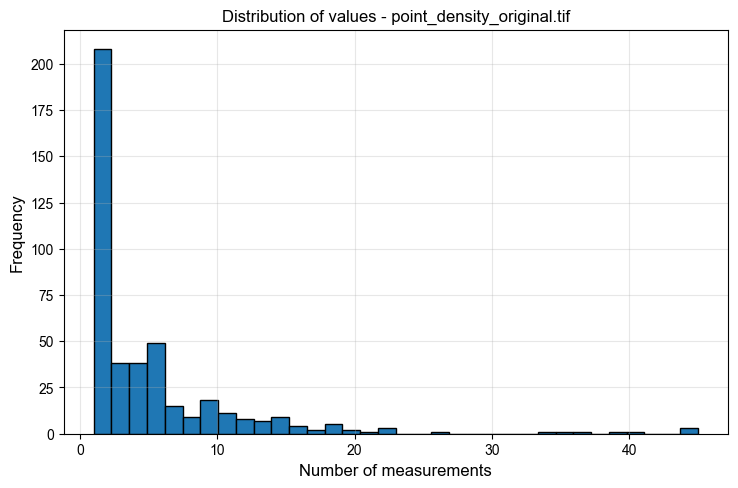

NameError: name 'boundaries' is not defined

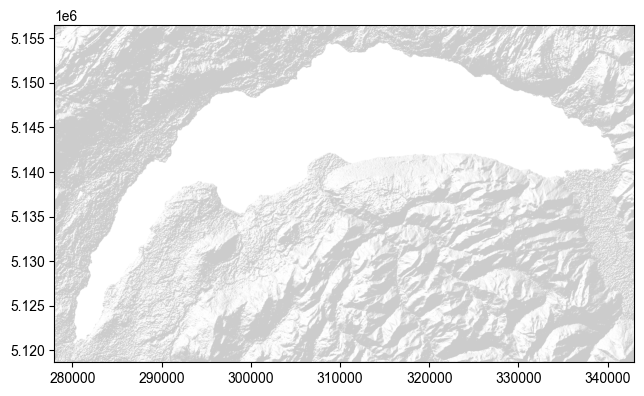

In [137]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create table of unique values and their counts
        unique_values = np.unique(valid_values)
        value_counts = {val: np.sum(raster1 == val) for val in unique_values}
        
        # Display table of value counts
        print(f"\nValue counts for {raster1_name}:")
        print("-" * 30)
        print(f"{'Value':<10} | {'Count':<10} | {'Percentage':<10}")
        print("-" * 30)
        total_valid_pixels = len(valid_values)
        for val in sorted(unique_values):
            count = value_counts[val]
            percentage = (count / total_valid_pixels) * 100
            print(f"{val:<10} | {count:<10} | {percentage:.2f}%")
        print("-" * 30)
        
        # Show histogram and map
        plt.figure(figsize=(width_inches, height_inches))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        # Approach using individual masks for each category
        # Clear the figure for the map
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Define colors list
        #colors_list = ["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014']
        colors_list = ['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725']
        #colors_list = ["blue", "green", "red", "orange", "pink"]
        
        # Create mask for each category based on exact values
        masked_arrays = []
        labels = []
        
        # Category 1: exactly value boundaries[0]
        mask1 = (raster1 == boundaries[0])
        count1 = np.sum(mask1)
        masked1 = np.ma.masked_array(raster1, ~mask1)
        if count1 > 0:
            labels.append(f"{count1} pixels: {boundaries[0]}")
            masked_arrays.append((masked1, colors_list[0]))
        
        # Category 2: exactly value boundaries[1]
        mask2 = (raster1 == boundaries[1])
        count2 = np.sum(mask2)
        masked2 = np.ma.masked_array(raster1, ~mask2)
        if count2 > 0:
            labels.append(f"{count2} pixels: {boundaries[1]}")
            masked_arrays.append((masked2, colors_list[1]))
        
        # Category 3: exactly value boundaries[2]
        mask3 = (raster1 == boundaries[2])
        count3 = np.sum(mask3)
        masked3 = np.ma.masked_array(raster1, ~mask3)
        if count3 > 0:
            labels.append(f"{count3} pixels: {boundaries[2]}")
            masked_arrays.append((masked3, colors_list[2]))
        
        # Category 4: range from boundaries[3] to boundaries[4]-1
        mask4 = (raster1 >= boundaries[3]) & (raster1 < boundaries[4])
        count4 = np.sum(mask4)
        masked4 = np.ma.masked_array(raster1, ~mask4)
        if count4 > 0:
            value_label = f"{boundaries[3]} - {boundaries[4]-1}" if boundaries[4]-1 > boundaries[3] else f"{boundaries[3]}"
            labels.append(f"{count4} pixels: {value_label}")
            masked_arrays.append((masked4, colors_list[3]))
        
        # Category 5: range from boundaries[4] to boundaries[5]
        mask5 = (raster1 >= boundaries[4]) & (raster1 <= boundaries[5])
        count5 = np.sum(mask5)
        masked5 = np.ma.masked_array(raster1, ~mask5)
        if count5 > 0:
            value_label = f"{boundaries[4]} - {boundaries[5]}" if boundaries[5] > boundaries[4] else f"{boundaries[4]}"
            labels.append(f"{count5} pixels: {value_label}")
            masked_arrays.append((masked5, colors_list[4]))
        
        # Plot each masked array separately
        for masked_array, color in masked_arrays:
            # Create a single-color colormap
            single_color_cmap = ListedColormap([color])
            
            # Use rasterio's show function which properly handles the transform
            show(masked_array, transform=transform1, ax=ax, cmap=single_color_cmap)
        
        # Set the extent to match hillshade bounds
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # Create legend
        from matplotlib.patches import Patch
        legend_elements = []
        for i, (label, color) in enumerate(zip(labels, colors_list[:len(labels)])):
            legend_elements.append(
                Patch(facecolor=color, edgecolor='black', label=label)
            )
        
        # Add the legend
        ax.legend(handles=legend_elements, title='Number of measurements',
                 loc='lower right', frameon=True, framealpha=0.8)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        print("Integer boundaries used:", boundaries)
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

In [ ]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create table of unique values and their counts
        unique_values = np.unique(valid_values)
        value_counts = {val: np.sum(raster1 == val) for val in unique_values}
        
        # Display table of value counts
        print(f"\nValue counts for {raster1_name}:")
        print("-" * 30)
        print(f"{'Value':<10} | {'Count':<10} | {'Percentage':<10}")
        print("-" * 30)
        total_valid_pixels = len(valid_values)
        for val in sorted(unique_values):
            count = value_counts[val]
            percentage = (count / total_valid_pixels) * 100
            print(f"{val:<10} | {count:<10} | {percentage:.2f}%")
        print("-" * 30)
        
        # Show histogram and map
        plt.figure(figsize=(width_inches, height_inches))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        # Approach using individual masks for each category
        # Clear the figure for the map
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Define colors list
        colors_list = ["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014']
        #colors_list = ["blue", "green", "red", "orange", "pink"]
        
        # Create mask for each category based on exact values
        masked_arrays = []
        labels = []
        
        # Category 1: exactly value boundaries[0]
        mask1 = (raster1 == boundaries[0])
        count1 = np.sum(mask1)
        masked1 = np.ma.masked_array(raster1, ~mask1)
        if count1 > 0:
            labels.append(f"{count1} pixels: {boundaries[0]}")
            masked_arrays.append((masked1, colors_list[0]))
        
        # Category 2: exactly value boundaries[1]
        mask2 = (raster1 == boundaries[1])
        count2 = np.sum(mask2)
        masked2 = np.ma.masked_array(raster1, ~mask2)
        if count2 > 0:
            labels.append(f"{count2} pixels: {boundaries[1]}")
            masked_arrays.append((masked2, colors_list[1]))
        
        # Category 3: exactly value boundaries[2]
        mask3 = (raster1 == boundaries[2])
        count3 = np.sum(mask3)
        masked3 = np.ma.masked_array(raster1, ~mask3)
        if count3 > 0:
            labels.append(f"{count3} pixels: {boundaries[2]}")
            masked_arrays.append((masked3, colors_list[2]))
        
        # Category 4: range from boundaries[3] to boundaries[4]-1
        mask4 = (raster1 >= boundaries[3]) & (raster1 < boundaries[4])
        count4 = np.sum(mask4)
        masked4 = np.ma.masked_array(raster1, ~mask4)
        if count4 > 0:
            value_label = f"{boundaries[3]} - {boundaries[4]-1}" if boundaries[4]-1 > boundaries[3] else f"{boundaries[3]}"
            labels.append(f"{count4} pixels: {value_label}")
            masked_arrays.append((masked4, colors_list[3]))
        
        # Category 5: range from boundaries[4] to boundaries[5]
        mask5 = (raster1 >= boundaries[4]) & (raster1 <= boundaries[5])
        count5 = np.sum(mask5)
        masked5 = np.ma.masked_array(raster1, ~mask5)
        if count5 > 0:
            value_label = f"{boundaries[4]} - {boundaries[5]}" if boundaries[5] > boundaries[4] else f"{boundaries[4]}"
            labels.append(f"{count5} pixels: {value_label}")
            masked_arrays.append((masked5, colors_list[4]))
        
        # Plot each masked array separately
        for masked_array, color in masked_arrays:
            # Create a single-color colormap
            single_color_cmap = ListedColormap([color])
            
            # Use rasterio's show function which properly handles the transform
            show(masked_array, transform=transform1, ax=ax, cmap=single_color_cmap)
        
        # Set the extent to match hillshade bounds
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # Convert UTM coordinates to WGS84 for tick labels
        # Get corner coordinates of the plot
        x_ticks = np.linspace(hillshade_bounds.left, hillshade_bounds.right, 5)
        y_ticks = np.linspace(hillshade_bounds.bottom, hillshade_bounds.top, 5)
        
        # Function to convert UTM to Lat/Lon for x-axis ticks
        def utm_to_lon(x):
            lon, lat = transformer.transform(x, hillshade_bounds.bottom)
            return f"{lon:.2f}°"
        
        # Function to convert UTM to Lat/Lon for y-axis ticks
        def utm_to_lat(y):
            lon, lat = transformer.transform(hillshade_bounds.left, y)
            return f"{lat:.2f}°"
        
        # Set custom tick formatters to display WGS84 coordinates
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Set tick positions
        ax.set_xticks(x_ticks)
        ax.set_yticks(y_ticks)
        
        # Create legend
        from matplotlib.patches import Patch
        legend_elements = []
        for i, (label, color) in enumerate(zip(labels, colors_list[:len(labels)])):
            legend_elements.append(
                Patch(facecolor=color, edgecolor='black', label=label)
            )
        
        # Add the legend
        ax.legend(handles=legend_elements, title='Number of measurements',
                 loc='lower right', frameon=True, framealpha=0.8)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        print("Integer boundaries used:", boundaries)
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

In [ ]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer
for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create table of unique values and their counts
        unique_values = np.unique(valid_values)
        value_counts = {val: np.sum(raster1 == val) for val in unique_values}
        
        # Display table of value counts
        print(f"\nValue counts for {raster1_name}:")
        print("-" * 30)
        print(f"{'Value':<10} | {'Count':<10} | {'Percentage':<10}")
        print("-" * 30)
        total_valid_pixels = len(valid_values)
        for val in sorted(unique_values):
            count = value_counts[val]
            percentage = (count / total_valid_pixels) * 100
            print(f"{val:<10} | {count:<10} | {percentage:.2f}%")
        print("-" * 30)
        
        # Show histogram and map
        plt.figure(figsize=(width_inches, height_inches))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        # Approach using individual masks for each category
        # Clear the figure for the map
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Define colors list
        colors_list = ["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014']
        #colors_list = ["blue", "green", "red", "orange", "pink"]
        
        # Create mask for each category based on exact values
        masked_arrays = []
        labels = []
        
        # Category 1: exactly value boundaries[0]
        mask1 = (raster1 == boundaries[0])
        count1 = np.sum(mask1)
        masked1 = np.ma.masked_array(raster1, ~mask1)
        if count1 > 0:
            labels.append(f"{count1} pixels: {boundaries[0]}")
            masked_arrays.append((masked1, colors_list[0]))
        
        # Category 2: exactly valushowe boundaries[1]
        mask2 = (raster1 == boundaries[1])
        count2 = np.sum(mask2)
        masked2 = np.ma.masked_array(raster1, ~mask2)
        if count2 > 0:
            labels.append(f"{count2} pixels: {boundaries[1]}")
            masked_arrays.append((masked2, colors_list[1]))
        
        # Category 3: exactly value boundaries[2]
        mask3 = (raster1 == boundaries[2])
        count3 = np.sum(mask3)
        masked3 = np.ma.masked_array(raster1, ~mask3)
        if count3 > 0:
            labels.append(f"{count3} pixels: {boundaries[2]}")
            masked_arrays.append((masked3, colors_list[2]))
        
        # Category 4: range from boundaries[3] to boundaries[4]-1
        mask4 = (raster1 >= boundaries[3]) & (raster1 < boundaries[4])
        count4 = np.sum(mask4)
        masked4 = np.ma.masked_array(raster1, ~mask4)
        if count4 > 0:
            value_label = f"{boundaries[3]} - {boundaries[4]-1}" if boundaries[4]-1 > boundaries[3] else f"{boundaries[3]}"
            labels.append(f"{count4} pixels: {value_label}")
            masked_arrays.append((masked4, colors_list[3]))
        
        # Category 5: range from boundaries[4] to boundaries[5]
        mask5 = (raster1 >= boundaries[4]) & (raster1 <= boundaries[5])
        count5 = np.sum(mask5)
        masked5 = np.ma.masked_array(raster1, ~mask5)
        if count5 > 0:
            value_label = f"{boundaries[4]} - {boundaries[5]}" if boundaries[5] > boundaries[4] else f"{boundaries[4]}"
            labels.append(f"{count5} pixels: {value_label}")
            masked_arrays.append((masked5, colors_list[4]))
        
        # Plot each masked array separately
        for masked_array, color in masked_arrays:
            # Create a single-color colormap
            single_color_cmap = ListedColormap([color])
            
            # Use rasterio's show function which properly handles the transform
            show(masked_array, transform=transform1, ax=ax, cmap=single_color_cmap)
        
        # Create legend
        from matplotlib.patches import Patch
        legend_elements = []
        for i, (label, color) in enumerate(zip(labels, colors_list[:len(labels)])):
            legend_elements.append(
                Patch(facecolor=color, edgecolor='black', label=label)
            )
        
        # Add the legend
        ax.legend(handles=legend_elements, title='Number of measurements',
                 loc='lower right', frameon=True, framealpha=0.8)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        print("Integer boundaries used:", boundaries)
        plt.show()
        # Set the extent to match hillshade
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)

        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

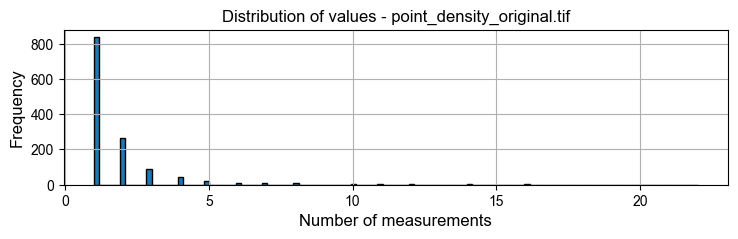

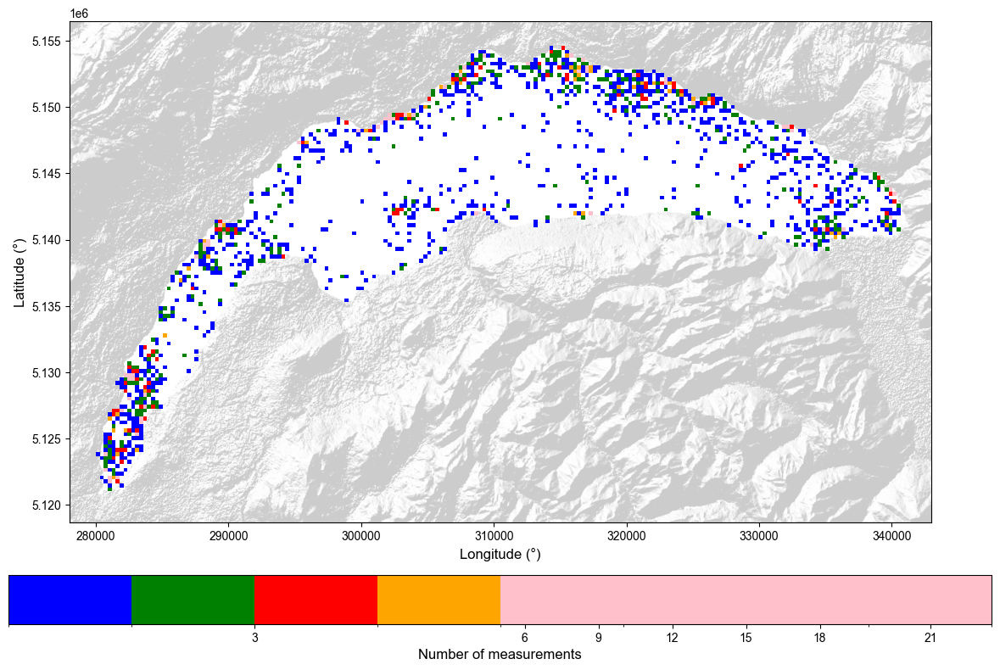

Sum of values in point_density_original.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 14. 15. 16. 22.]


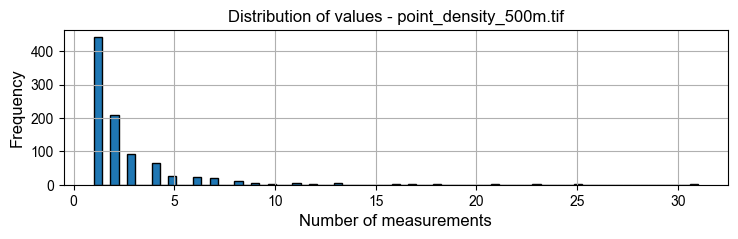

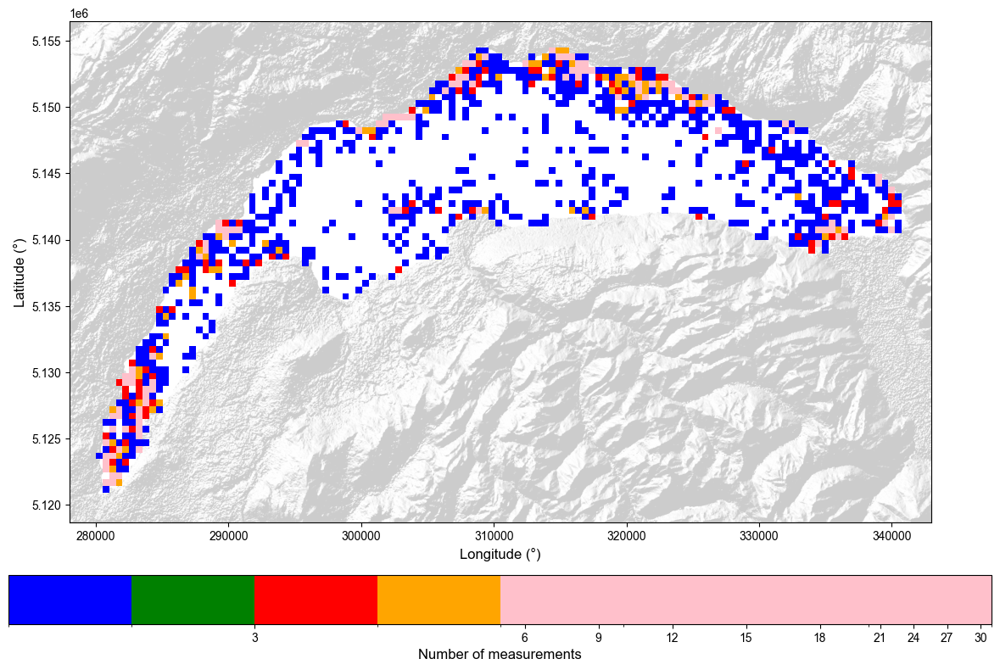

Sum of values in point_density_500m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 16. 17. 18. 21. 23.
 25. 31.]


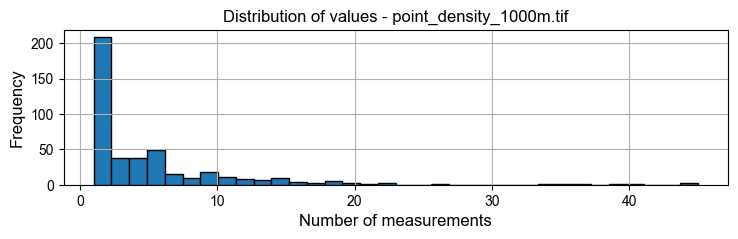

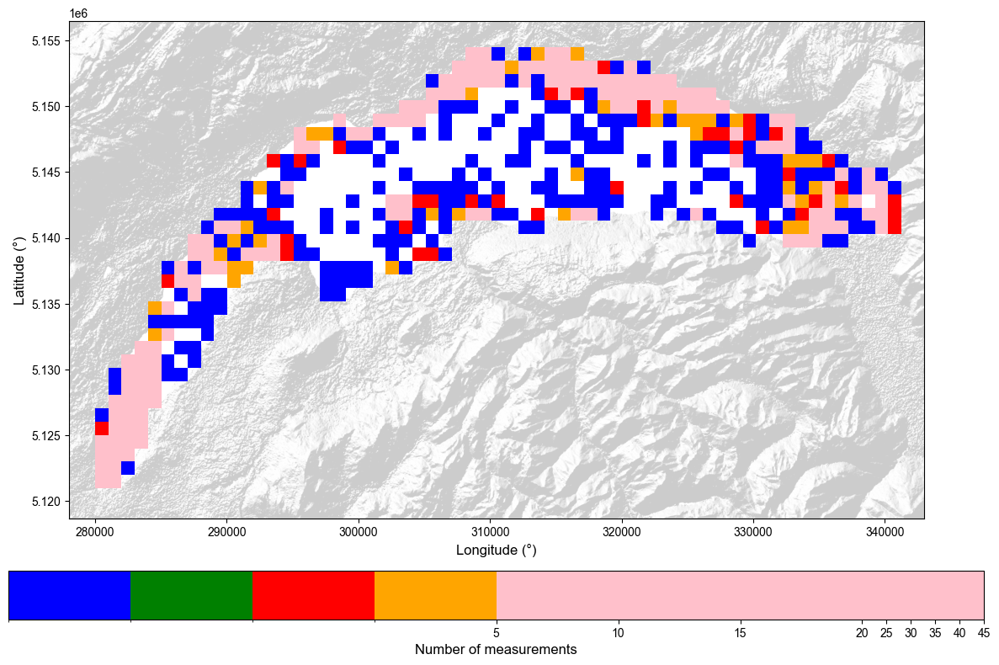

Sum of values in point_density_1000m.tif: 2273.0
Unique values: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 26. 34. 35. 37. 39. 41. 44. 45.]


In [138]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as color
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer

for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Create histogram first to determine color limits
        valid_values = raster1[~np.isnan(raster1)]
        plt.figure(figsize=(width_inches, height_inches/2))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}')
        plt.grid(True, alpha=1.0)
        plt.tight_layout()
        plt.show()
    
        plt.figure(figsize=(2*width_inches, 2*height_inches))
        ax = plt.gca()

        # Define the colors you want
        #cmap = ListedColormap(["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014'])
        cmap = ListedColormap(["blue", "green", "red", "orange", 'pink'])
        
        # Define a normalization from values -> colors
        norm = colors.BoundaryNorm([1, 2, 3, 4, 5, 10, 15, 20, np.nanmax(raster1)], 8)

        # # Define the colors you want
        # cmap = ListedColormap(["white", "tan", "springgreen", "darkgreen"])
        
        # # Define a normalization from values -> colors
        # norm = colors.BoundaryNorm([0, 2, 10, 20, 30], 5)
        
        # Show both layers without alpha
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        show(raster1, transform=transform1, ax=ax, cmap=cmap, 
              norm = norm)#vmin=np.nanmin(raster1), vmax=np.nanmax(raster1),
        
        # Set the extent to match hillshade
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # # Function to convert UTM to Lat/Lon for x-axis
        # def utm_to_lon(x):
        #     lon, _ = transformer.transform(x, hillshade_bounds.bottom)
        #     return f"{lon:.2f}°"
        
        # # Function to convert UTM to Lat/Lon for y-axis
        # def utm_to_lat(y):
        #     _, lat = transformer.transform(hillshade_bounds.left, y)
        #     return f"{lat:.2f}°"
        
        # # Set custom tick formatters
        # ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        # ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Add colorbar
        cbar = plt.colorbar(ax.images[1], ax=ax, orientation='horizontal', pad=0.08)
        cbar.set_label('Number of measurements')
        cbar.locator = MaxNLocator(integer=True)
        cbar.update_ticks()
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')

        
        plt.show()
        print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
        print(f"Unique values: {np.unique(valid_values)}")

In [139]:
# from matplotlib.colors import ListedColormap
# import matplotlib.colors as color
# import rasterio
# from rasterio.plot import show
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer

# for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
#     # Paths to the two raster files
#     raster1_path = parent_dir / 'outputs' / raster1_name
#     raster2_path = hillshade_path_cropped
    
#     # Open both rasters
#     with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
#         raster1 = src1.read(1)
#         transform1 = src1.transform
#         crs1 = src1.crs
        
#         raster2 = src2.read(1)
#         transform2 = src2.transform
#         crs2 = src2.crs
        
#         # Get hillshade bounds
#         hillshade_bounds = src2.bounds
        
#         # Create transformer from UTM to WGS84
#         transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
#         if crs1 != crs2:
#             raise ValueError("The two rasters must have the same CRS.")
        
#         # Create histogram first to determine color limits
#         valid_values = raster1[~np.isnan(raster1)]
#         plt.figure(figsize=(width_inches, height_inches/2))
#         plt.hist(valid_values, bins='auto', edgecolor='black')
#         plt.xlabel('Number of measurements')
#         plt.ylabel('Frequency')
#         plt.title(f'Distribution of values - {raster1_name}')
#         plt.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
    
#         plt.figure(figsize=(2*width_inches, 2*height_inches))
#         ax = plt.gca()

#         # Define the colors you want
#         cmap = ListedColormap(["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014'])
        
#         # Define a normalization from values -> colors
#         norm = colors.BoundaryNorm([1, 2, 3, 4, 5, 10, 15, 20, np.nanmax(raster1)], 8)

#         # # Define the colors you want
#         # cmap = ListedColormap(["white", "tan", "springgreen", "darkgreen"])
        
#         # # Define a normalization from values -> colors
#         # norm = colors.BoundaryNorm([0, 2, 10, 20, 30], 5)
        
#         # Show both layers without alpha
#         show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
#         show(raster1, transform=transform1, ax=ax, cmap=cmap, 
#               norm = norm)#vmin=np.nanmin(raster1), vmax=np.nanmax(raster1),
        
#         # Set the extent to match hillshade
#         ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
#         ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
#         # Function to convert UTM to Lat/Lon for x-axis
#         def utm_to_lon(x):
#             lon, _ = transformer.transform(x, hillshade_bounds.bottom)
#             return f"{lon:.2f}°"
        
#         # Function to convert UTM to Lat/Lon for y-axis
#         def utm_to_lat(y):
#             _, lat = transformer.transform(hillshade_bounds.left, y)
#             return f"{lat:.2f}°"
        
#         # Set custom tick formatters
#         ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
#         ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
#         # Add colorbar
#         cbar = plt.colorbar(ax.images[1], ax=ax, orientation='horizontal', pad=0.08)
#         cbar.set_label('Number of measurements')
#         cbar.locator = MaxNLocator(integer=True)
#         cbar.update_ticks()
        
#         plt.xlabel('Longitude (°)')
#         plt.ylabel('Latitude (°)')
#         ax.set_aspect('equal')

        
#         plt.show()
#         print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
#         print(f"Unique values: {np.unique(valid_values)}")

In [140]:
# from matplotlib.colors import ListedColormap
# import matplotlib.colors as color
# import rasterio
# from rasterio.plot import show
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.ticker import MaxNLocator
# from pyproj import Transformer

# for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
#     # Paths to the two raster files
#     raster1_path = parent_dir / 'outputs' / raster1_name
#     raster2_path = hillshade_path_cropped
    
#     # Open both rasters
#     with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
#         raster1 = src1.read(1)
#         transform1 = src1.transform
#         crs1 = src1.crs
        
#         raster2 = src2.read(1)
#         transform2 = src2.transform
#         crs2 = src2.crs
        
#         # Get hillshade bounds
#         hillshade_bounds = src2.bounds
        
#         # Create transformer from UTM to WGS84
#         transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
#         if crs1 != crs2:
#             raise ValueError("The two rasters must have the same CRS.")
        
#         # Create histogram first to determine color limits
#         valid_values = raster1[~np.isnan(raster1)]
#         plt.figure(figsize=(width_inches, height_inches/2))
#         plt.hist(valid_values, bins='auto', edgecolor='black')
#         plt.xlabel('Number of measurements')
#         plt.ylabel('Frequency')
#         plt.title(f'Distribution of values - {raster1_name}')
#         plt.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
    
#         plt.figure(figsize=(2*width_inches, 2*height_inches))
#         ax = plt.gca()

#         # Define the colors you want
#         cmap = ListedColormap(["#b0b0b0", "#758a9b", "#ffd366", "#f6a437", '#ec7014'])
        
#         # Define a normalization from values -> colors
#         norm = colors.BoundaryNorm([1, 2, 3, 4, 5, 10, 15, 20, np.nanmax(raster1)], 8)

#         # # Define the colors you want
#         # cmap = ListedColormap(["white", "tan", "springgreen", "darkgreen"])
        
#         # # Define a normalization from values -> colors
#         # norm = colors.BoundaryNorm([0, 2, 10, 20, 30], 5)
        
#         # Show both layers without alpha
#         show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
#         show(raster1, transform=transform1, ax=ax, cmap=cmap, 
#               norm = norm)#vmin=np.nanmin(raster1), vmax=np.nanmax(raster1),
        
#         # Set the extent to match hillshade
#         ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
#         ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
#         # Function to convert UTM to Lat/Lon for x-axis
#         def utm_to_lon(x):
#             lon, _ = transformer.transform(x, hillshade_bounds.bottom)
#             return f"{lon:.2f}°"
        
#         # Function to convert UTM to Lat/Lon for y-axis
#         def utm_to_lat(y):
#             _, lat = transformer.transform(hillshade_bounds.left, y)
#             return f"{lat:.2f}°"
        
#         # Set custom tick formatters
#         ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
#         ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
#         # Add colorbar
#         cbar = plt.colorbar(ax.images[1], ax=ax, orientation='horizontal', pad=0.08)
#         cbar.set_label('Number of measurements')
#         cbar.locator = MaxNLocator(integer=True)
#         cbar.update_ticks()
        
#         plt.xlabel('Longitude (°)')
#         plt.ylabel('Latitude (°)')
#         ax.set_aspect('equal')

        
#         plt.show()
#         print(f"Sum of values in {raster1_name}: {np.nansum(raster1)}")
#         print(f"Unique values: {np.unique(valid_values)}")

In [141]:
parent_dir

WindowsPath('C:/Users/ghadyaya/git/lemanscope-qa')

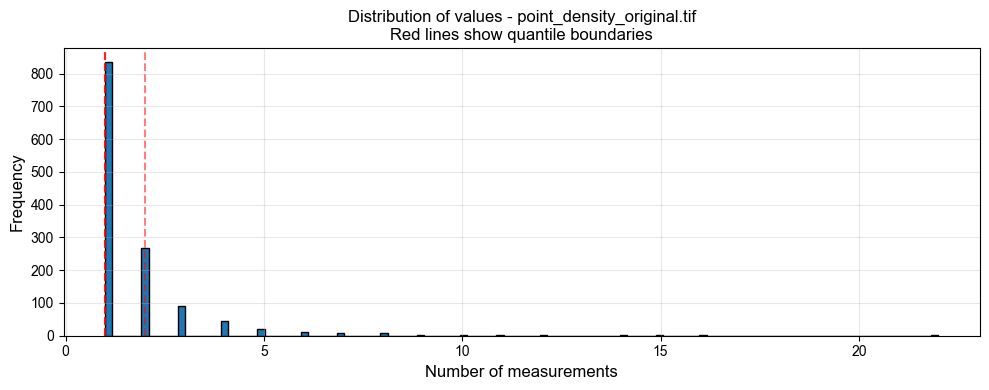


Categories for point_density_original.tif:
Category 1 (white): 0.90 to 1.00
Category 2 (lightyellow): 1.00 to 1.00
Category 3 (tan): 1.00 to 1.00
Category 4 (springgreen): 1.00 to 2.00
Category 5 (darkgreen): 2.00 to 22.10


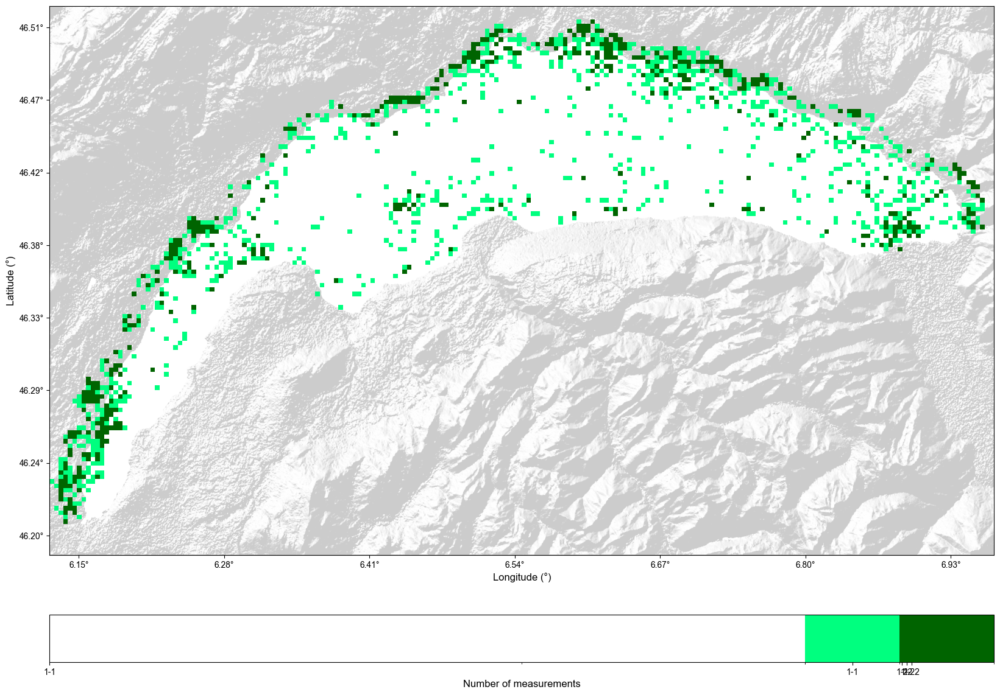

Sum of values: 2273.0
Unique values: 16


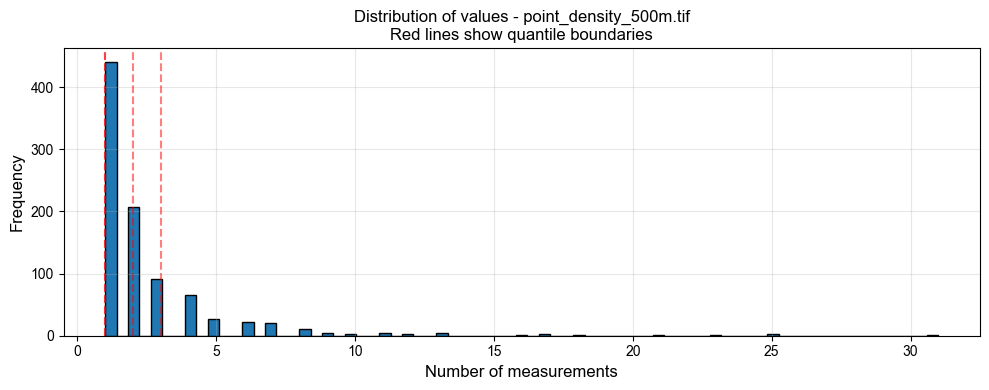


Categories for point_density_500m.tif:
Category 1 (white): 0.90 to 1.00
Category 2 (lightyellow): 1.00 to 1.00
Category 3 (tan): 1.00 to 2.00
Category 4 (springgreen): 2.00 to 3.00
Category 5 (darkgreen): 3.00 to 31.10


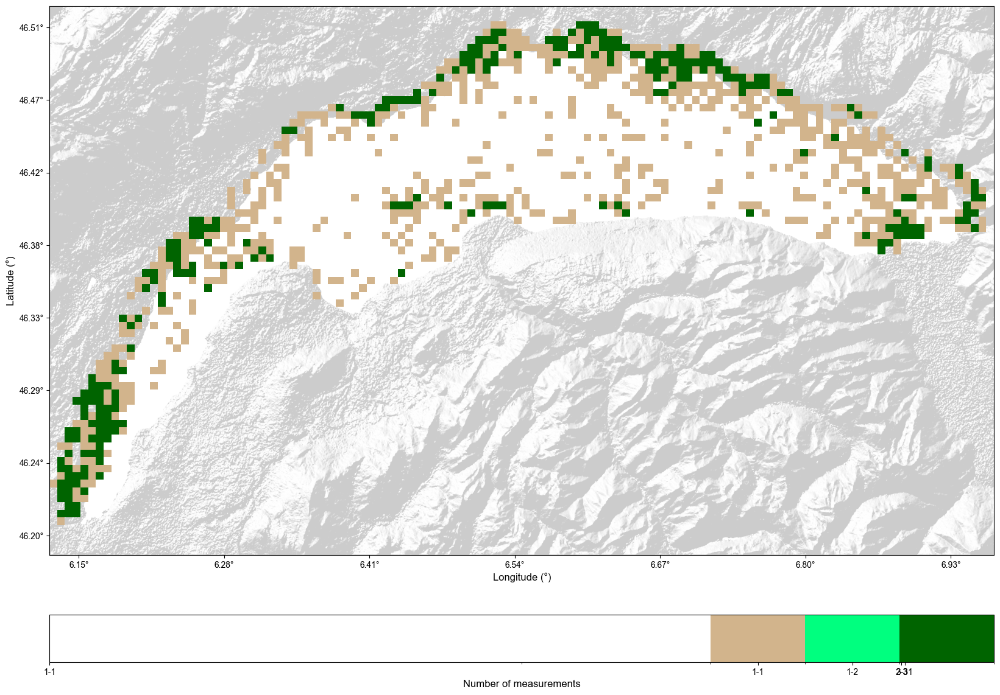

Sum of values: 2273.0
Unique values: 20


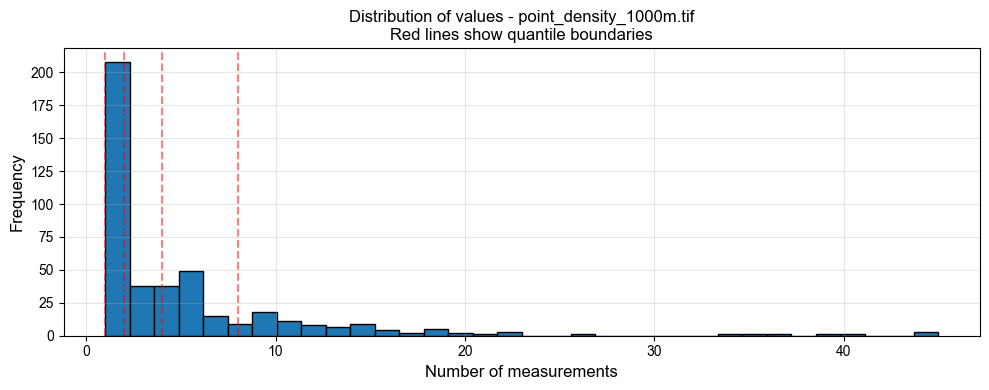


Categories for point_density_1000m.tif:
Category 1 (white): 0.90 to 1.00
Category 2 (lightyellow): 1.00 to 2.00
Category 3 (tan): 2.00 to 4.00
Category 4 (springgreen): 4.00 to 8.00
Category 5 (darkgreen): 8.00 to 45.10


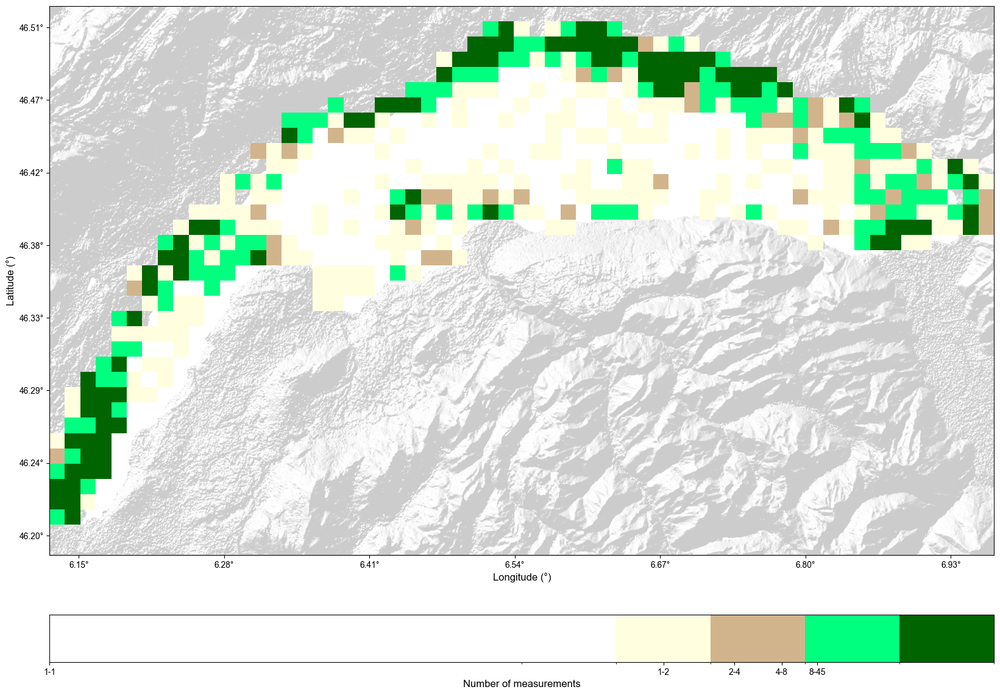

Sum of values: 2273.0
Unique values: 30


In [142]:
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
from pyproj import Transformer
from pathlib import Path

# Assuming these variables are defined elsewhere in your code
width_inches = 10  # Update if needed
height_inches = 8  # Update if needed

for raster1_name in ['point_density_original.tif', 'point_density_500m.tif', 'point_density_1000m.tif']:
    
    # Paths to the two raster files
    raster1_path = parent_dir / 'outputs' / raster1_name
    raster2_path = hillshade_path_cropped
    
    # Open both rasters
    with rasterio.open(raster1_path) as src1, rasterio.open(raster2_path) as src2:
        raster1 = src1.read(1)
        transform1 = src1.transform
        crs1 = src1.crs
        
        raster2 = src2.read(1)
        transform2 = src2.transform
        crs2 = src2.crs
        
        # Get hillshade bounds
        hillshade_bounds = src2.bounds
        
        # Create transformer from UTM to WGS84
        transformer = Transformer.from_crs(crs2, "EPSG:4326", always_xy=True)
        
        if crs1 != crs2:
            raise ValueError("The two rasters must have the same CRS.")
        
        # Get valid values and calculate quantiles
        valid_values = raster1[~np.isnan(raster1)]
        
        # Calculate exactly 4 quantile boundaries for 5 categories
        quantiles = np.quantile(valid_values, [0.2, 0.4, 0.6, 0.8])
        
        # Create boundaries array
        boundaries = np.concatenate(([np.min(valid_values)-0.1], quantiles, [np.max(valid_values)+0.1]))
        
        # Create histogram
        plt.figure(figsize=(width_inches, height_inches/2))
        plt.hist(valid_values, bins='auto', edgecolor='black')
        for q in quantiles:
            plt.axvline(q, color='red', linestyle='--', alpha=0.5)
        plt.xlabel('Number of measurements')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of values - {raster1_name}\nRed lines show quantile boundaries')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
        plt.figure(figsize=(2*width_inches, 2*height_inches))
        ax = plt.gca()
        
        # Define exactly 5 colors
        colors_list = ["white", "lightyellow", "tan", "springgreen", "darkgreen"]
        cmap = ListedColormap(colors_list)
        
        # Create normalization - number of boundaries should be number of colors + 1
        norm = colors.BoundaryNorm(boundaries, len(colors_list))
        
        # Show hillshade first
        show(raster2, transform=transform2, ax=ax, cmap=shade_grey)
        
        # Show point density using imshow
        im = ax.imshow(raster1, 
                      extent=[hillshade_bounds.left, hillshade_bounds.right, 
                             hillshade_bounds.bottom, hillshade_bounds.top],
                      cmap=cmap, 
                      norm=norm)
        
        # Set the extent to match hillshade
        ax.set_xlim(hillshade_bounds.left, hillshade_bounds.right)
        ax.set_ylim(hillshade_bounds.bottom, hillshade_bounds.top)
        
        # Function to convert UTM to Lat/Lon for x-axis
        def utm_to_lon(x):
            lon, lat = transformer.transform(x, hillshade_bounds.bottom)
            return f"{lon:.2f}°"
        
        # Function to convert UTM to Lat/Lon for y-axis
        def utm_to_lat(y):
            lon, lat = transformer.transform(hillshade_bounds.left, y)
            return f"{lat:.2f}°"
        
        # Set custom tick formatters
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: utm_to_lon(x)))
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, p: utm_to_lat(y)))
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.08)
        cbar.set_label('Number of measurements')
        
        # Format colorbar ticks to show the range for each category
        tick_labels = [f'{boundaries[i]:.0f}-{boundaries[i+1]:.0f}' 
                      for i in range(len(boundaries)-1)]
        cbar.set_ticks(np.arange(len(colors_list)) + 0.5)  # Center ticks in each category
        cbar.set_ticklabels(tick_labels)
        
        plt.xlabel('Longitude (°)')
        plt.ylabel('Latitude (°)')
        ax.set_aspect('equal')
        
        # Print the quantile boundaries and their colors
        print(f"\nCategories for {raster1_name}:")
        for i in range(len(colors_list)):
            print(f"Category {i+1} ({colors_list[i]}): {boundaries[i]:.2f} to {boundaries[i+1]:.2f}")
        
        plt.show()
        print(f"Sum of values: {np.nansum(raster1)}")
        print(f"Unique values: {len(np.unique(valid_values))}")

# 4. Azimuth-based distance

In [143]:
import numpy as np
from shapely.geometry import Polygon, Point, LineString, MultiLineString
from math import degrees, atan2
from tqdm import tqdm

def normalize_angle(angle):
    """Normalize angle to be between 0 and 360 degrees"""
    return angle % 360

def is_angle_in_sector(angle, start_angle, end_angle):
    """Check if an angle is within a given sector"""
    # Handle sector that crosses 0/360 boundary
    if start_angle > end_angle:
        return angle >= start_angle or angle <= end_angle
    else:
        return start_angle <= angle <= end_angle

def get_sector_boundary(lake_boundary, point, start_angle, end_angle):
    """Extract lake boundary segment for a specific sector"""
    # Normalize angles
    start_angle = normalize_angle(start_angle)
    end_angle = normalize_angle(end_angle)
    
    # First check if point is inside or on the lake boundary
    lake_polygon = lake_boundary.convex_hull
    if not (lake_polygon.contains(point) or lake_polygon.touches(point)):
        return None
    
    # Create sector lines from point
    distance = 1e5  # 100 km should be enough for most lakes
    
    # Alternative angle conversion that maintains correct orientation
    start_rad = np.radians(90 - start_angle)
    end_rad = np.radians(90 - end_angle)
    
    # Calculate points for sector lines
    start_x = point.x + distance * np.cos(start_rad)
    start_y = point.y + distance * np.sin(start_rad)
    end_x = point.x + distance * np.cos(end_rad)
    end_y = point.y + distance * np.sin(end_rad)
    
    # Create sector polygon
    sector_points = [
        (point.x, point.y),
        (start_x, start_y),
        (end_x, end_y),
        (point.x, point.y)
    ]
    sector = Polygon(sector_points)
    
    # Intersect sector with lake boundary to get boundary segment
    sector_boundary = lake_boundary.intersection(sector)
    
    return sector_boundary if not sector_boundary.is_empty else None

def calculate_sector_distances(points_gdf, lake_gdf):
    """Calculate minimum distances to lake border for each 30-degree sector, starting at -15 degrees"""
    results = points_gdf.copy()
    lake_boundary = lake_gdf.geometry.iloc[0].boundary
    lake_polygon = lake_gdf.geometry.iloc[0]
    
    # Modify sector angles to start at -15 and end at 345
    sector_starts = list(range(-15, 345, 30))
    
    for idx, point_row in tqdm(points_gdf.iterrows(), total=len(points_gdf)):
        point = point_row.geometry
        
        # Check if point is outside lake
        if not (lake_polygon.contains(point) or lake_polygon.touches(point)):
            # Set NaN for all sectors if point is outside
            for start_angle in sector_starts:
                end_angle = start_angle + 30
                # Special handling for the 345-15 sector
                if start_angle == -15:
                    sector_name = f"345_15_DEG"
                else:
                    sector_name = f"{start_angle}_{end_angle}_DEG"
                results.at[idx, sector_name] = np.nan
            continue
        
        # Process each sector for points inside or on lake boundary
        for start_angle in sector_starts:
            end_angle = start_angle + 30
            # Special handling for the 345-15 sector
            if start_angle == -15:
                sector_name = f"345_15_DEG"
            else:
                sector_name = f"{start_angle}_{end_angle}_DEG"
            
            # Get boundary segment for this sector
            sector_boundary = get_sector_boundary(lake_boundary, point, start_angle, end_angle)
            
            if sector_boundary and not sector_boundary.is_empty:
                # Calculate minimum distance to the sector boundary
                min_dist = point.distance(sector_boundary)
                results.at[idx, sector_name] = min_dist
            else:
                results.at[idx, sector_name] = np.nan
    
    return results

# Run the calculation
results = calculate_sector_distances(points_gdf_utm, gdf_utm)

# Print statistics with modified sector names
print("Number of valid calculations:", results.notna().sum().sum())
print("\nSummary of distances for each sector:")
for col in results.columns:
    if col.endswith('_DEG'):
        print(f"\n{col}:")
        print(f"Valid measurements: {results[col].notna().sum()}")
        if results[col].notna().sum() > 0:
            print(f"Mean distance: {results[col].mean():.2f}")
            print(f"Min distance: {results[col].min():.2f}")
            print(f"Max distance: {results[col].max():.2f}")

100%|██████████████████████████████████████████████████████████████████████████████| 2371/2371 [23:21<00:00,  1.69it/s]

Number of valid calculations: 118409

Summary of distances for each sector:

345_15_DEG:
Valid measurements: 2273
Mean distance: 2432.49
Min distance: 1.29
Max distance: 12918.86

15_45_DEG:
Valid measurements: 2273
Mean distance: 3003.88
Min distance: 1.32
Max distance: 15540.83

45_75_DEG:
Valid measurements: 2273
Mean distance: 3583.78
Min distance: 1.06
Max distance: 21224.50

75_105_DEG:
Valid measurements: 2273
Mean distance: 4016.96
Min distance: 0.87
Max distance: 21557.06

105_135_DEG:
Valid measurements: 2273
Mean distance: 5409.10
Min distance: 0.86
Max distance: 17148.64

135_165_DEG:
Valid measurements: 2273
Mean distance: 5522.70
Min distance: 0.80
Max distance: 13448.56

165_195_DEG:
Valid measurements: 2273
Mean distance: 5560.89
Min distance: 0.62
Max distance: 12835.93

195_225_DEG:
Valid measurements: 2273
Mean distance: 5992.73
Min distance: 0.61
Max distance: 16078.42

225_255_DEG:
Valid measurements: 2273
Mean distance: 5494.42
Min distance: 0.65
Max distance: 227

In [144]:
points_gdf_utm = results

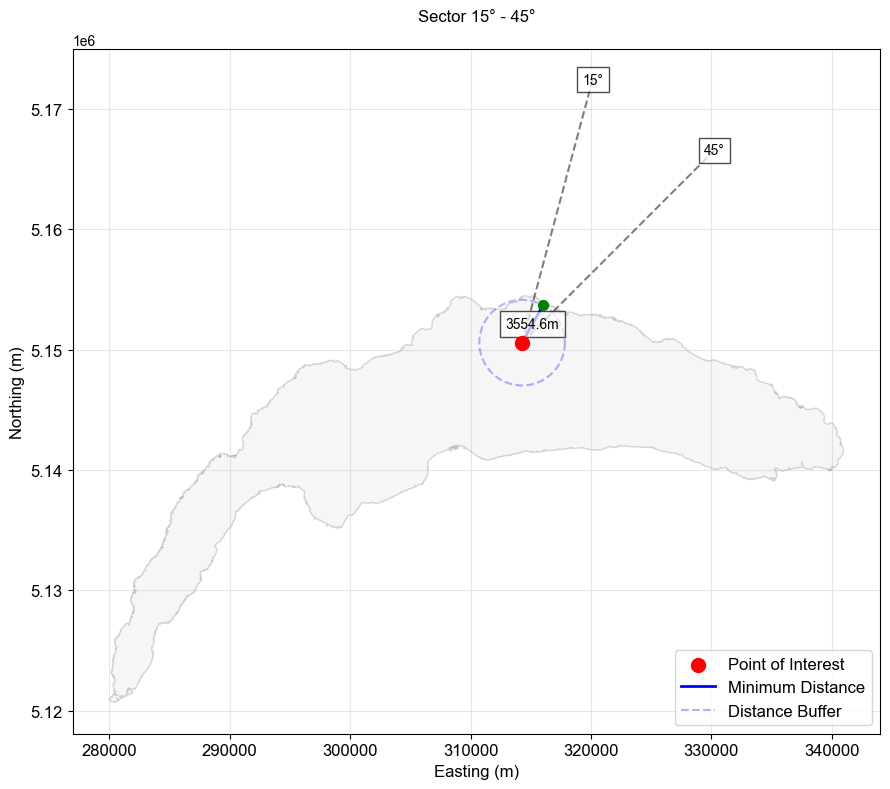

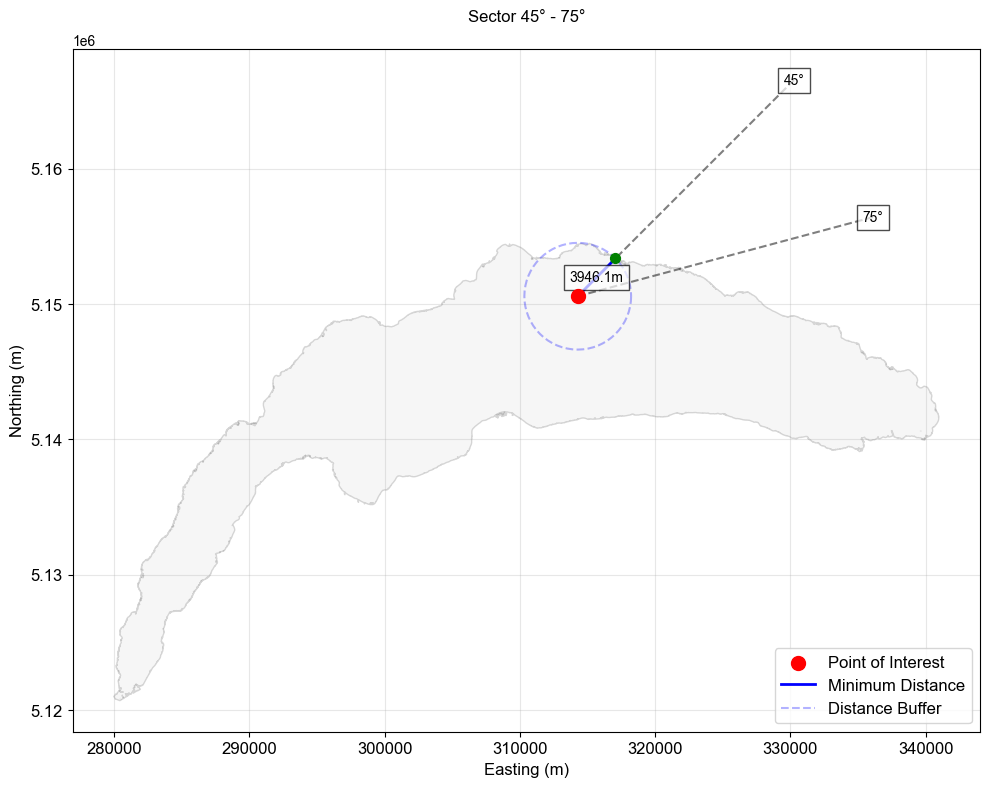

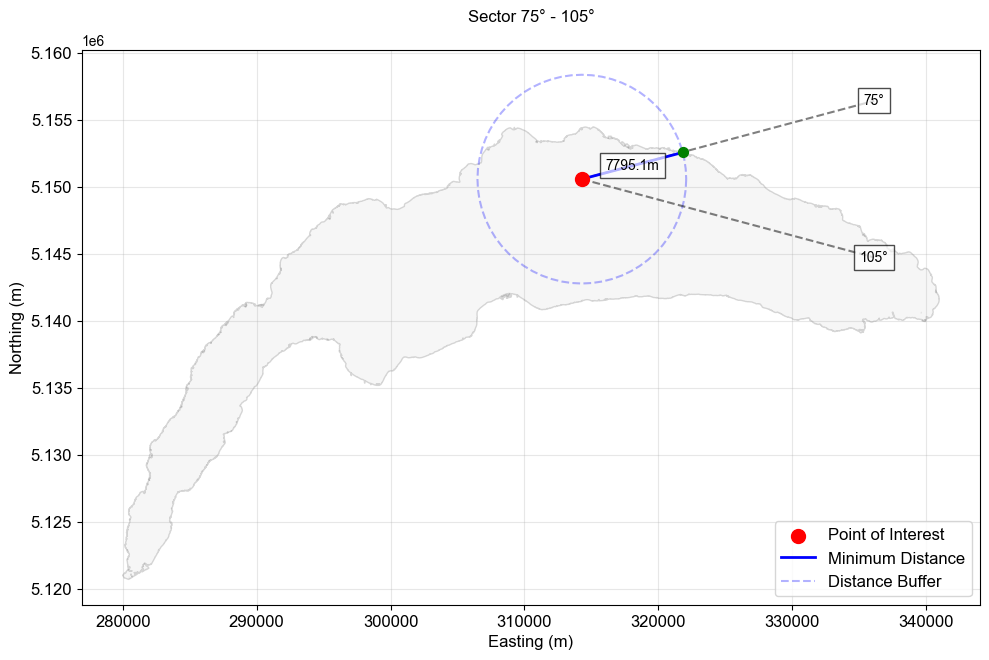

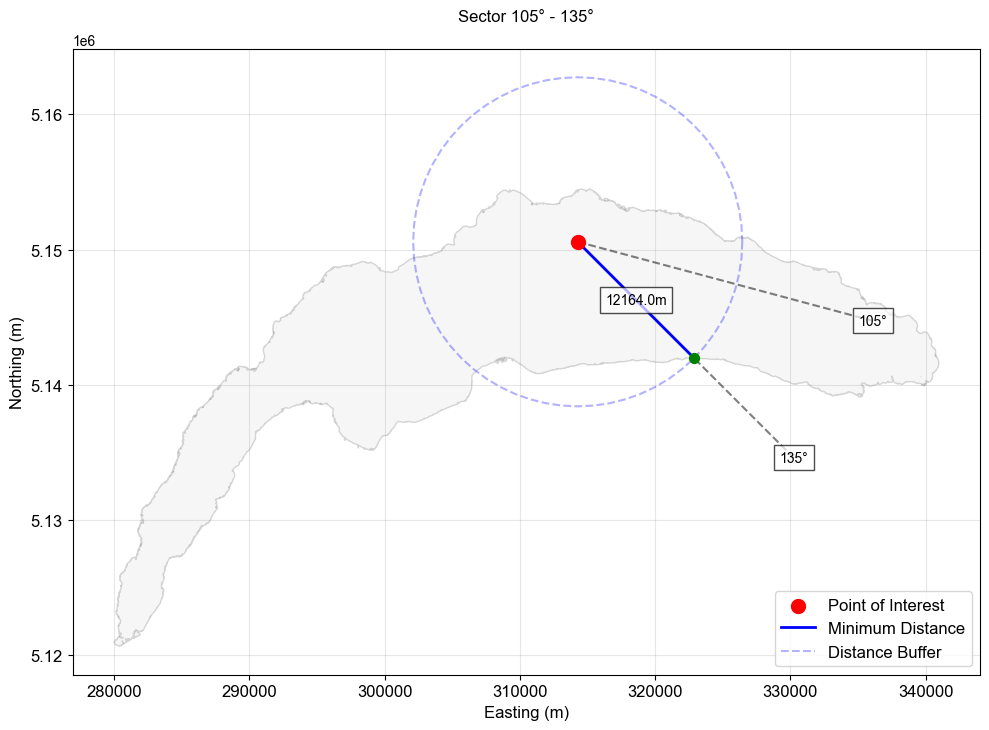

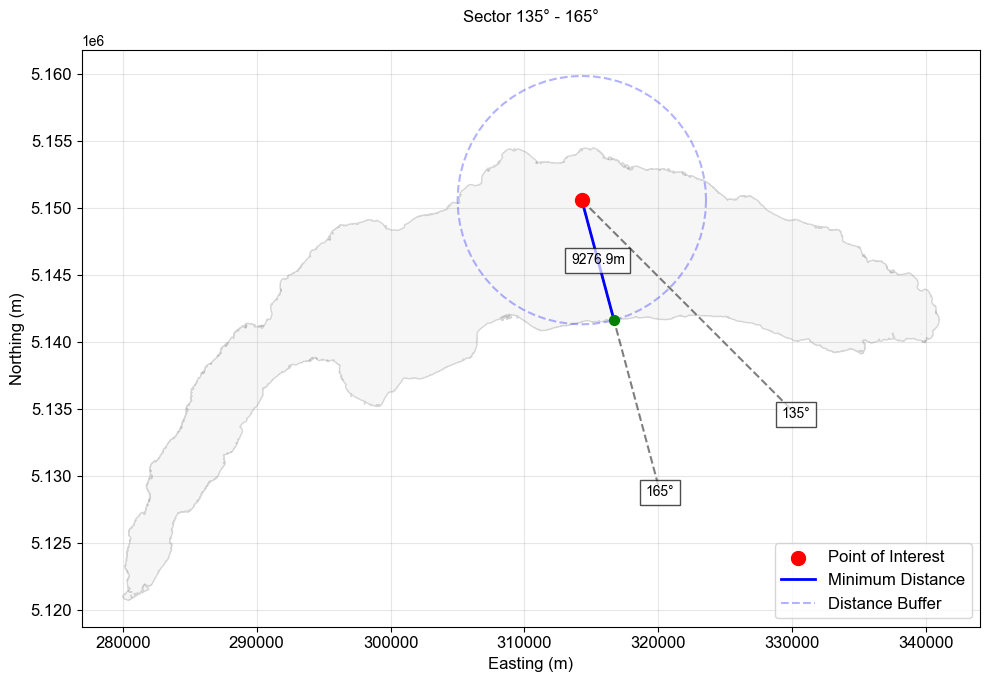

...

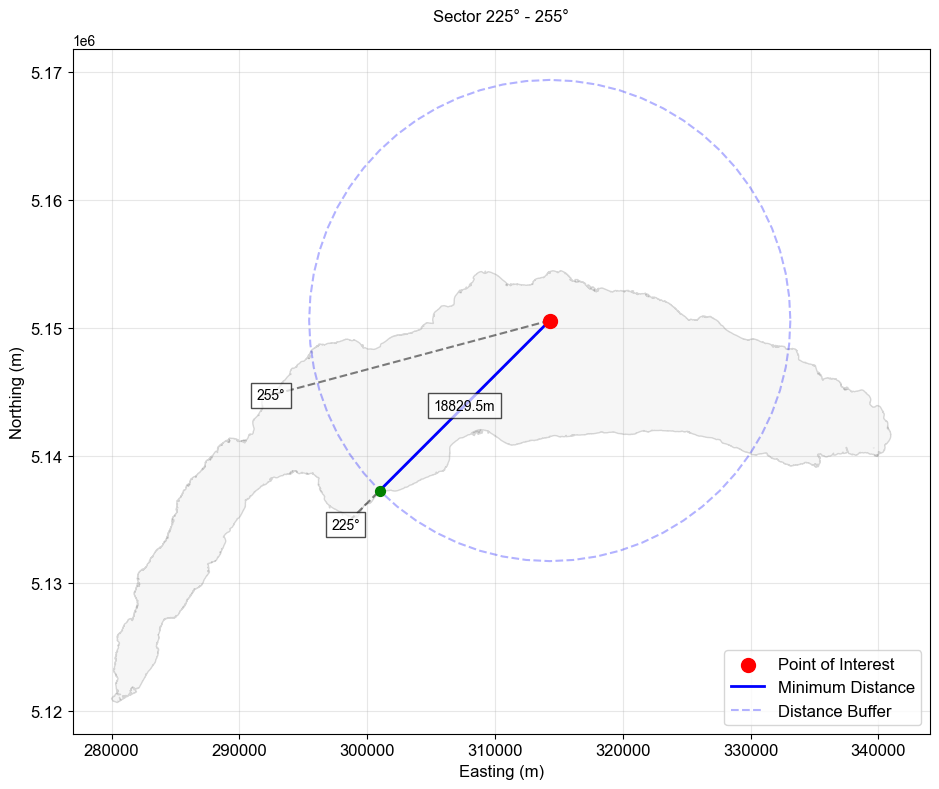

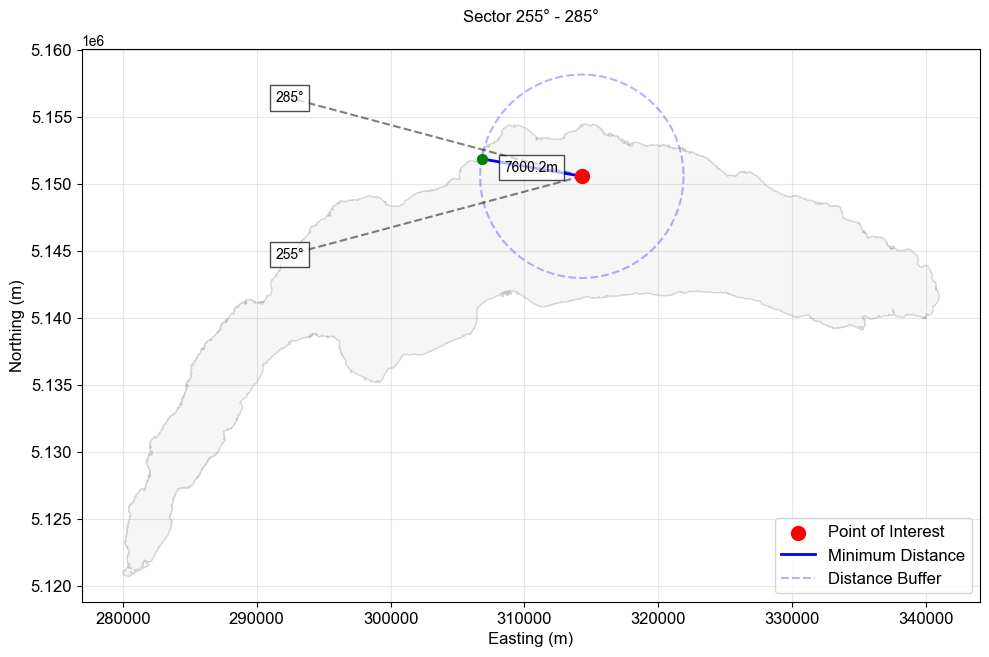

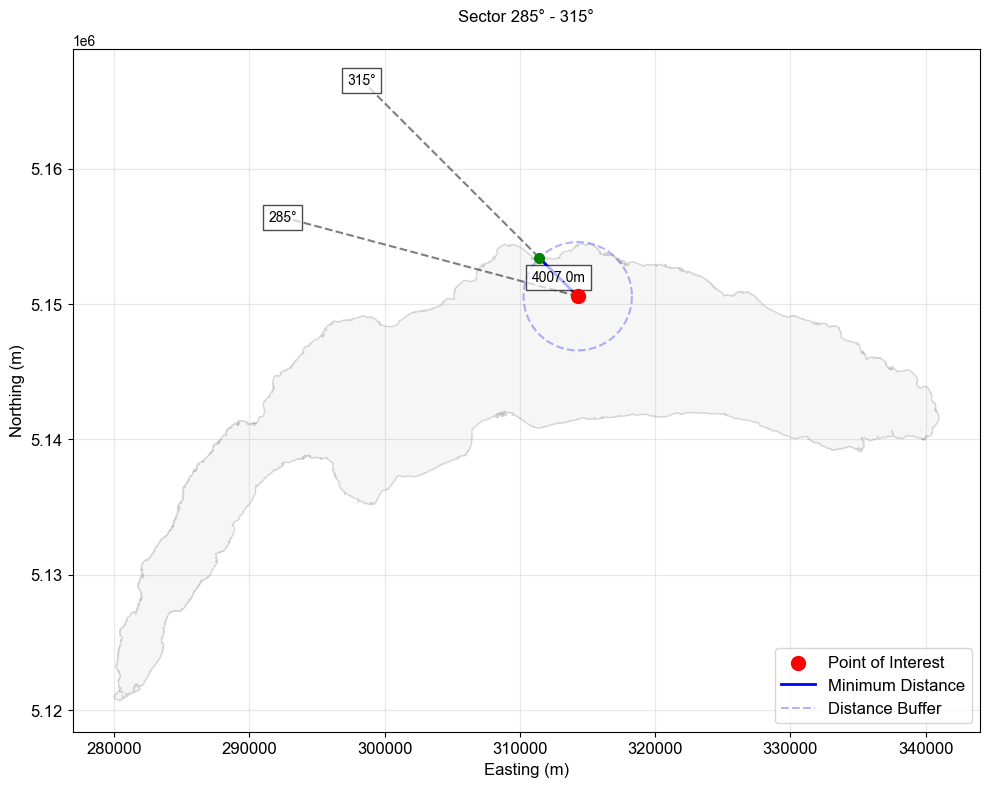

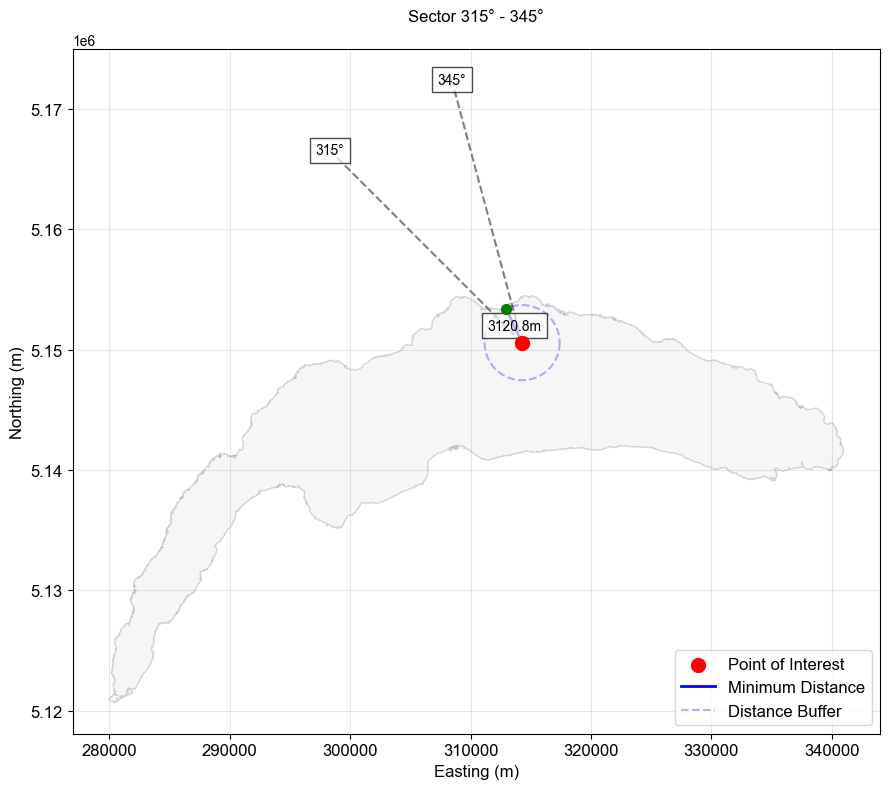

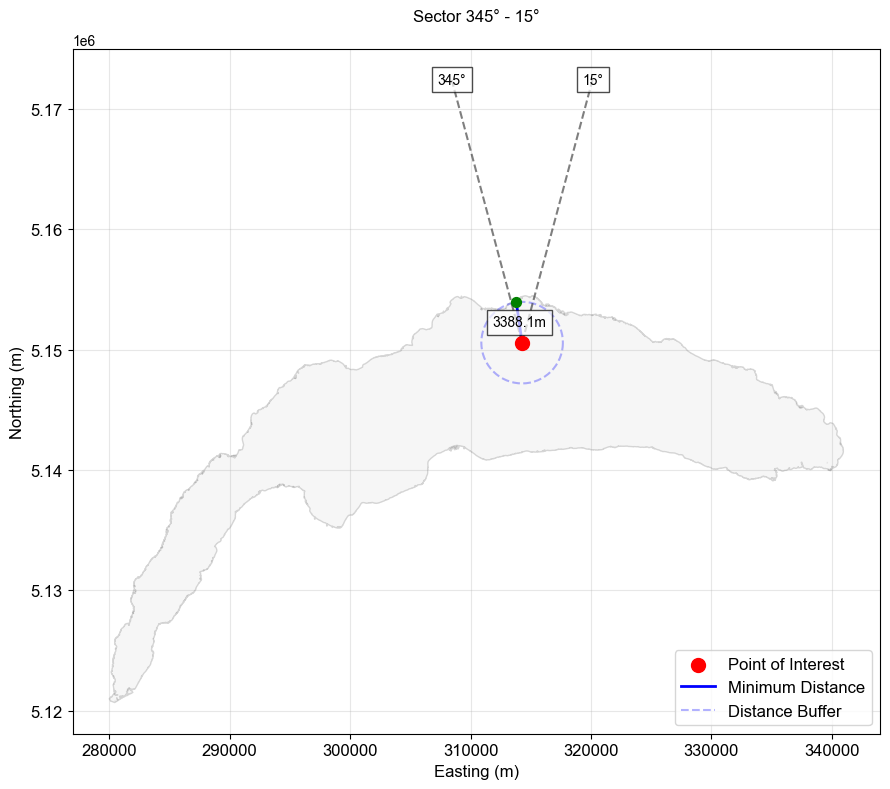

Random point index used: 2256


In [145]:
from shapely.ops import nearest_points
def plot_sectors_separately(points_gdf, lake_gdf, results):
    """
    Create separate visualizations for each sector showing boundaries and distances.
    """
    # Get random point
    point_idx = np.random.randint(0, len(points_gdf))
    point = points_gdf.iloc[point_idx].geometry
    lake_boundary = lake_gdf.geometry.iloc[0].boundary
    lake_polygon = lake_gdf.geometry.iloc[0]
    distances = results.iloc[point_idx]
    
    # Calculate max distance for visualization
    numeric_distances = [float(distances[col]) for col in distances.index if col.endswith('_DEG') and not np.isnan(distances[col])]
    max_dist = max(numeric_distances) * 1.2 if numeric_distances else 1000
    
    # Create bins centered at 15, 45, 75, etc. degrees
    sectors = list(range(15, 375, 30))  # [15, 45, 75, ..., 345]
    for i in range(len(sectors)):
        start_angle = sectors[i]
        end_angle = sectors[(i + 1) % len(sectors)]
        
        # Handle the special case for the last sector (345-15)
        if start_angle == 345:
            end_angle = 15
            sector_name = "345_15_DEG"
        else:
            sector_name = f"{start_angle}_{end_angle}_DEG"
        
        # Create new figure
        plt.figure(figsize=(width_inches, height_inches))
        ax = plt.gca()
        
        # Plot lake boundary
        lake_gdf.boundary.plot(ax=ax, color='gray', linewidth=1, alpha=0.3)
        lake_gdf.plot(ax=ax, color='lightgray', alpha=0.2)
        
        # Plot point of interest
        ax.scatter(point.x, point.y, color='red', s=100, zorder=5, label='Point of Interest')
        
        # Create sector lines from point
        distance = 1e5  # 100 km should be enough for most lakes
        start_rad = np.radians(90 - start_angle)
        end_rad = np.radians(90 - end_angle)
        
        # Calculate points for sector lines
        start_x = point.x + distance * np.cos(start_rad)
        start_y = point.y + distance * np.sin(start_rad)
        end_x = point.x + distance * np.cos(end_rad)
        end_y = point.y + distance * np.sin(end_rad)
        
        # Get sector boundary
        sector_boundary = get_sector_boundary(lake_boundary, point, start_angle, end_angle)
        
        if sector_boundary and sector_name in distances.index and not np.isnan(distances[sector_name]):
            # Extract the nearest point on the boundary
            nearest_point = nearest_points(point, sector_boundary)[1]
            
            # Plot minimum distance line
            ax.plot([point.x, nearest_point.x], [point.y, nearest_point.y], '-', color='blue', linewidth=2, zorder=3, label='Minimum Distance')
            
            # Plot nearest point
            ax.scatter(nearest_point.x, nearest_point.y, color='green', s=50, zorder=4)
            
            # Add distance label
            mid_x, mid_y = (point.x + nearest_point.x) / 2, (point.y + nearest_point.y) / 2
            distance = distances[sector_name]
            ax.text(mid_x, mid_y, f'{distance:.1f}m', ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7))
            
            # Plot distance buffer
            buffer_circle = point.buffer(distance)
            ax.plot(*buffer_circle.exterior.xy, '--', color='blue', alpha=0.3, label='Distance Buffer')
        
        # Draw sector angle lines
        for angle in [start_angle, end_angle]:
            rad = np.radians(90 - angle)
            end_x, end_y = point.x + max_dist * np.cos(rad), point.y + max_dist * np.sin(rad)
            ax.plot([point.x, end_x], [point.y, end_y], 'k--', alpha=0.5, zorder=2)
            ax.text(end_x, end_y, f'{angle}°', ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7))
        
        # Set subplot properties
        if start_angle == 345:
            title = f'Sector {start_angle}° - 15°'
        else:
            title = f'Sector {start_angle}° - {end_angle}°'
            
        ax.set_title(title, pad=20)
        ax.set_aspect('equal')
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=12)
        ax.legend(loc='lower right')
        
        plt.xlabel('Easting (m)')
        plt.ylabel('Northing (m)')
        plt.tight_layout()
        plt.show()
    
    print(f"Random point index used: {point_idx}")
    return sector_boundary

# Example usage
boundary = plot_sectors_separately(points_gdf_utm, gdf_utm, results)

# 5. Lake segmentation

## 5.1. Distance to the northern and southern shore

In [146]:
leftmost, rightmost = find_extremal_points(gdf_utm.geometry[0])
print(f"Leftmost point: {leftmost}")
print(f"Rightmost point: {rightmost}")

Leftmost point: (279991.3891794981, 5120989.337934886, 372.1359999999986)
Rightmost point: (340970.1835418177, 5141588.002834075, 372.1100000000006)


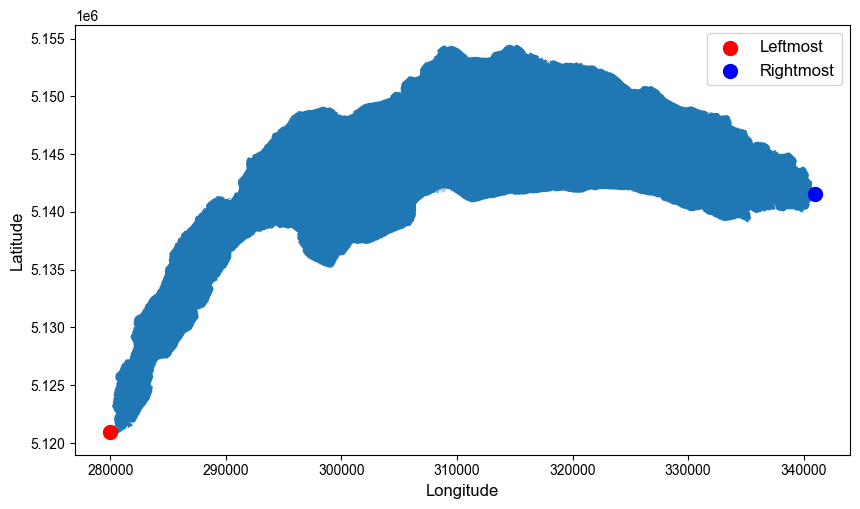

In [147]:
# Use the function
fig, ax = plot_multipolygon_with_points(gdf_utm, leftmost, rightmost)
# Set aspect ratio to be equal
ax.set_aspect('equal')
plt.show()

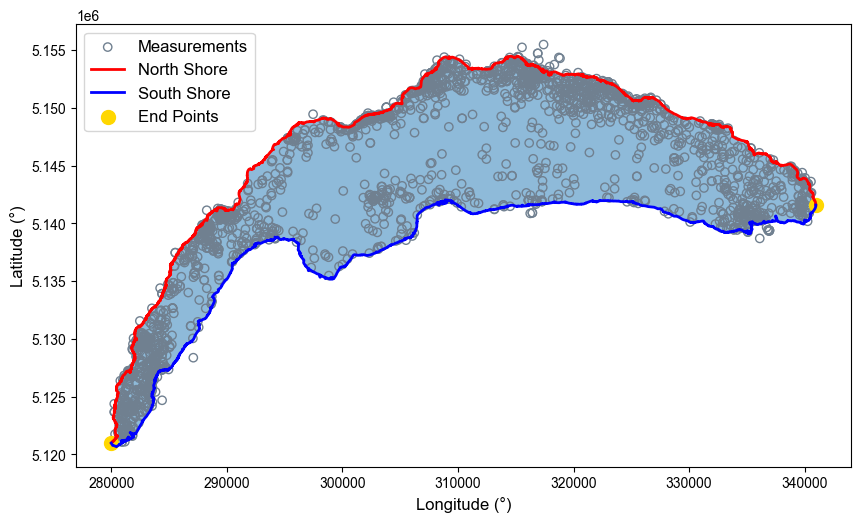

In [148]:
# Plot with correct CRS
north_shore, south_shore = split_shores(gdf_utm.geometry[0], leftmost, rightmost)
fig, ax = plt.subplots(figsize=(10, 10))
gdf_utm.plot(ax=ax, alpha=0.5)
points_gdf_utm.plot(ax = ax, edgecolor = 'slategray', facecolor = 'none', label='Measurements')

if north_shore and south_shore:
    # Convert coordinates to separate x and y arrays
    north_x, north_y, _ = zip(*north_shore)  # Unpack x,y,z coordinates
    south_x, south_y, _ = zip(*south_shore)
    
    ax.plot(north_x, north_y, 'r-', label='North Shore', linewidth=2)
    ax.plot(south_x, south_y, 'b-', label='South Shore', linewidth=2)
ax.scatter([leftmost[0], rightmost[0]], [leftmost[1], rightmost[1]], 
              color='gold', s=100, label='End Points')
ax.legend()
# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')

plt.show()

In [149]:
north_shore_2d = [(x, y) for x, y, z in north_shore]
south_shore_2d = [(x, y) for x, y, z in south_shore]

In [150]:
geometry_north = LineString(north_shore_2d)
geometry_south = LineString(south_shore_2d)

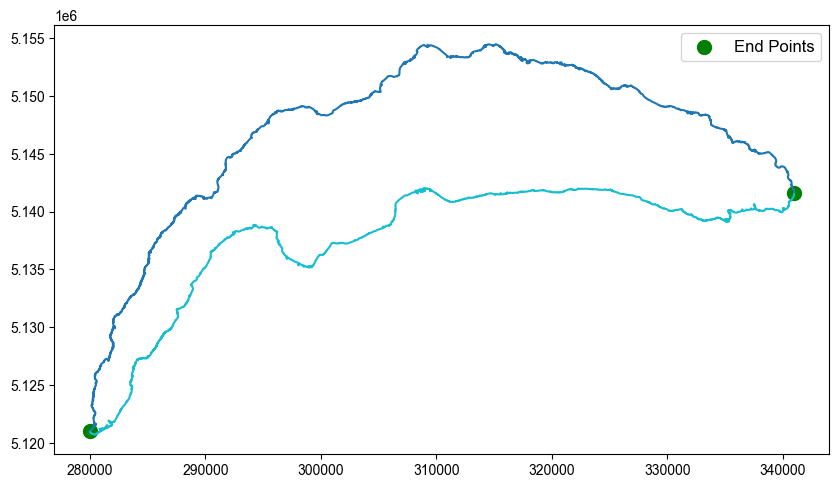

In [151]:
# Create and plot the lines
shore_gdf = create_shore_lines(north_shore, south_shore)
fig, ax = plt.subplots(figsize=(10, 10))
shore_gdf.plot(ax=ax, column='name', legend=True)
ax.scatter([leftmost[0], rightmost[0]], [leftmost[1], rightmost[1]], 
          color='green', s=100, label='End Points')
ax.legend()

# Set aspect ratio to be equal
ax.set_aspect('equal')

plt.show()

In [152]:
geometry_north = gpd.GeoDataFrame(geometry=[geometry_north])
geometry_south = gpd.GeoDataFrame(geometry=[geometry_south])

In [153]:
# Calculate and add distances to north line
points_gdf_utm['distance_to_north'] = points_gdf_utm.geometry.apply(
    lambda point: point.distance(geometry_north)
)

# Calculate and add distances to shore line
points_gdf_utm['distance_to_south'] = points_gdf_utm.geometry.apply(
    lambda point: point.distance(geometry_south)
)

In [154]:
# Calculate and add distances to north line
points_gdf_utm['distance_to_north'] = points_gdf_utm.geometry.apply(
    lambda point: geometry_north.distance(point)
)

# Calculate and add distances to shore line
points_gdf_utm['distance_to_south'] = points_gdf_utm.geometry.apply(
    lambda point: geometry_south.distance(point)
)

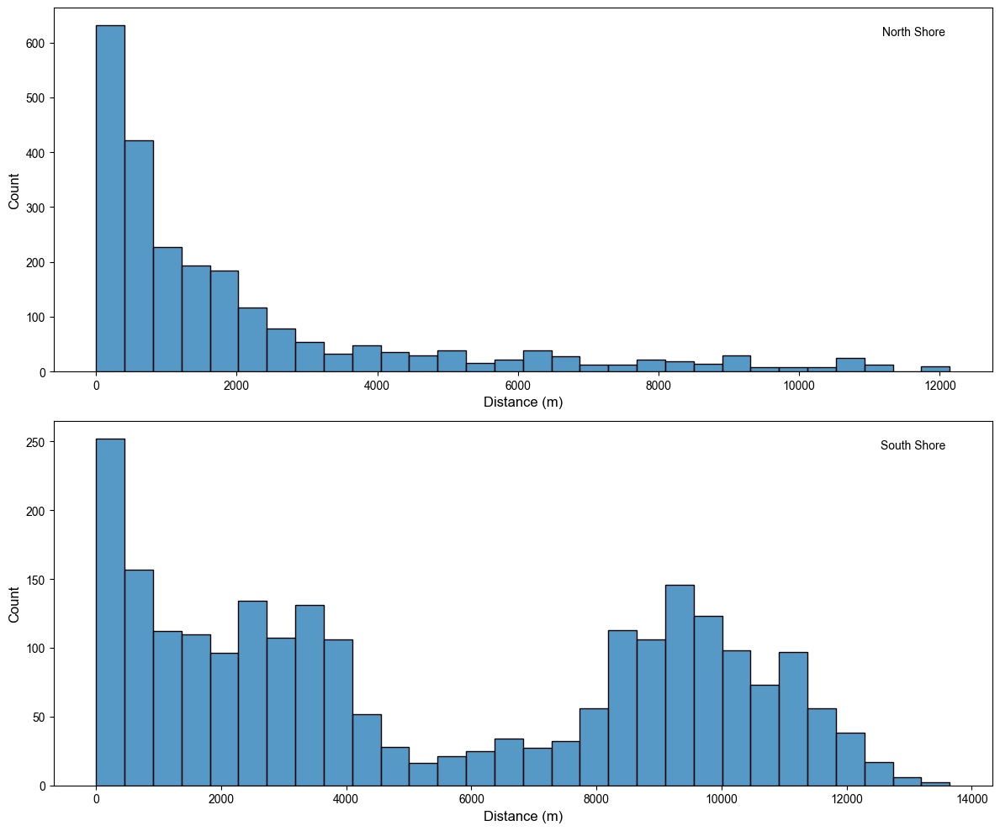


Summary Statistics (meters):
       distance_to_north  distance_to_south
count        2371.000000        2371.000000
mean         2059.303684        5374.388707
std          2568.558579        4002.378487
min             0.241320           0.863812
25%           372.633585        1622.467390
50%          1029.363779        3996.925387
75%          2445.386689        9320.116655
max         12142.392911       13647.331895


In [155]:
# Create figure with subplots in two rows
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# North shore distances
sns.histplot(data=points_gdf_utm, x='distance_to_north', bins=30, ax=ax1)
ax1.text(0.95, 0.95, 'North Shore', 
        transform=ax1.transAxes,  # This makes coordinates relative to axes (0-1)
        ha='right',  # Horizontal alignment: right
        va='top')    # Vertical alignment: top
         
ax1.set_xlabel('Distance (m)')

# South shore distances
sns.histplot(data=points_gdf_utm, x='distance_to_south', bins=30, ax=ax2)
ax2.text(0.95, 0.95, 'South Shore',
        transform=ax2.transAxes,
        ha='right',
        va='top')
ax2.set_xlabel('Distance (m)')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics (meters):")
print(points_gdf_utm[['distance_to_north', 'distance_to_south']].describe())

In [156]:
from shapely.geometry import LinearRing
import folium
import geopandas as gpd
from shapely.geometry import Point
from shapely.ops import nearest_points

# Get a random sample point
sample_idx = np.random.randint(len(points_gdf_utm))
sample_point = points_gdf_utm.geometry.iloc[sample_idx]

# Get the lines
north_line = shore_gdf[shore_gdf['name'] == 'North Shore'].geometry.iloc[0]
south_line = shore_gdf[shore_gdf['name'] == 'South Shore'].geometry.iloc[0]

# Find nearest points on each line
_, north_nearest = nearest_points(sample_point, north_line)
_, south_nearest = nearest_points(sample_point, south_line)

# Calculate distances (in UTM)
dist_north = sample_point.distance(north_nearest)
dist_south = sample_point.distance(south_nearest)

# Convert geometries to WGS84 for Folium display
points_wgs = points_gdf_utm.to_crs('EPSG:4326')
shore_wgs = shore_gdf.to_crs('EPSG:4326')
sample_point_wgs = points_wgs.geometry.iloc[sample_idx]
north_nearest_wgs = gpd.GeoSeries([north_nearest], crs=points_gdf_utm.crs).to_crs('EPSG:4326')[0]
south_nearest_wgs = gpd.GeoSeries([south_nearest], crs=points_gdf_utm.crs).to_crs('EPSG:4326')[0]

# Create map
m = folium.Map(
    location=[sample_point_wgs.y, sample_point_wgs.x],
    zoom_start=13,
    tiles='CartoDB positron'
)

# Add shore lines
for idx, row in shore_wgs.iterrows():
    line_coords = list(row.geometry.coords)
    folium.PolyLine(
        locations=[[y, x] for x, y in line_coords],
        color='black',
        weight=2,
        popup=row['name']
    ).add_to(m)

# Add sample point
folium.CircleMarker(
    location=[sample_point_wgs.y, sample_point_wgs.x],
    radius=15,
    color='red',
    fill=True,
    popup=f'Sample Point<br>North: {dist_north:.1f}m<br>South: {dist_south:.1f}m'
).add_to(m)

# Add distance lines and circles
folium.PolyLine(
    locations=[[sample_point_wgs.y, sample_point_wgs.x], 
               [north_nearest_wgs.y, north_nearest_wgs.x]],
    color='blue',
    weight=2,
    dash_array='5'
).add_to(m)

folium.PolyLine(
    locations=[[sample_point_wgs.y, sample_point_wgs.x], 
               [south_nearest_wgs.y, south_nearest_wgs.x]],
    color='green',
    weight=2,
    dash_array='5'
).add_to(m)

# Add circles
circle_north = gpd.GeoDataFrame(geometry=[sample_point.buffer(dist_north)], crs=points_gdf_utm.crs).to_crs('EPSG:4326')
circle_south = gpd.GeoDataFrame(geometry=[sample_point.buffer(dist_south)], crs=points_gdf_utm.crs).to_crs('EPSG:4326')

folium.GeoJson(
    circle_north,
    style_function=lambda x: {
        'color': 'blue',
        'weight': 2,
        'fillColor': 'blue',
        'fillOpacity': 0.2
    }
).add_to(m)

folium.GeoJson(
    circle_south,
    style_function=lambda x: {
        'color': 'green',
        'weight': 2,
        'fillColor': 'green',
        'fillOpacity': 0.2
    }
).add_to(m)

m

## 5.2. Grand-lac vs. Petit-lac

In [157]:
def split_above_below_line(gdf, line, extend_line=True):
    """
    Split a GeoDataFrame into two parts: above and below a line.
    
    Parameters:
    gdf: GeoDataFrame - The GeoDataFrame to split
    line: LineString - The line to split by
    extend_line: bool - Whether to extend the line beyond the geometry bounds
    
    Returns:
    tuple: (above_gdf, below_gdf) - Two GeoDataFrames containing the split geometries
    """
    # Get the geometry from the GeoDataFrame
    geometry = gdf.geometry.iloc[0]
    
    # If requested, extend the line beyond the geometry bounds
    if extend_line:
        bounds = geometry.bounds
        minx, miny, maxx, maxy = bounds
        
        # Extend line by getting its direction vector and extending it
        p1, p2 = line.coords
        vector_x = p2[0] - p1[0]
        vector_y = p2[1] - p1[1]
        
        # Calculate how much to extend (use diagonal of bounding box)
        diagonal = np.sqrt((maxx-minx)**2 + (maxy-miny)**2)
        scale = diagonal / np.sqrt(vector_x**2 + vector_y**2)
        scale *= 2  # Double it to be safe
        
        # Create extended line
        extended_start = (p1[0] - vector_x*scale, p1[1] - vector_y*scale)
        extended_end = (p2[0] + vector_x*scale, p2[1] + vector_y*scale)
        line = LineString([extended_start, extended_end])
    
    # Create a very large rectangle that covers the entire geometry
    bounds = geometry.bounds
    minx, miny, maxx, maxy = bounds
    dx = maxx - minx
    dy = maxy - miny
    
    # Extend bounds by 50% in each direction
    big_minx = minx - dx*0.5
    big_miny = miny - dy*0.5
    big_maxx = maxx + dx*0.5
    big_maxy = maxy + dy*0.5
    
    # Create two polygons representing above and below the line
    p1, p2 = line.coords
    
    # vectors parallel and perpendicular to the line
    line_vector = np.array([p2[0] - p1[0], p2[1] - p1[1]])
    perp_vector = np.array([-line_vector[1], line_vector[0]])
    perp_vector = perp_vector / np.linalg.norm(perp_vector)
    
    # Create points for the polygons
    large_dist = np.sqrt((big_maxx-big_minx)**2 + (big_maxy-big_miny)**2)
    
    above_polygon = Polygon([
        p1,
        p2,
        (p2[0] + perp_vector[0]*large_dist, p2[1] + perp_vector[1]*large_dist),
        (p1[0] + perp_vector[0]*large_dist, p1[1] + perp_vector[1]*large_dist)
    ])
    
    below_polygon = Polygon([
        p1,
        p2,
        (p2[0] - perp_vector[0]*large_dist, p2[1] - perp_vector[1]*large_dist),
        (p1[0] - perp_vector[0]*large_dist, p1[1] - perp_vector[1]*large_dist)
    ])
    
    # Intersect these with the original geometry
    above_part = geometry.intersection(above_polygon)
    below_part = geometry.intersection(below_polygon)
    
    # Create new GeoDataFrames
    above_gdf = gpd.GeoDataFrame(geometry=[above_part], crs=gdf.crs)
    below_gdf = gpd.GeoDataFrame(geometry=[below_part], crs=gdf.crs)
    
    return above_gdf, below_gdf

In [158]:
from matplotlib.patches import Patch

# p1 = (6.2729, 46.3902) #Promenthoux
# p2 = (6.3030, 46.3665) #Nernier
p1 = (6.265818159578107, 46.392344282264325)
p2 = (6.3, 46.366669)

division_line = LineString([p1, p2])
# Convert to GeoDataFrame with original CRS and then to UTM
division_line_gdf = gpd.GeoDataFrame(geometry=[division_line], crs='EPSG:4326')  # assuming original is WGS84
division_line_utm = division_line_gdf.to_crs(points_gdf_utm.crs).geometry[0]  # using the same UTM CRS as your points

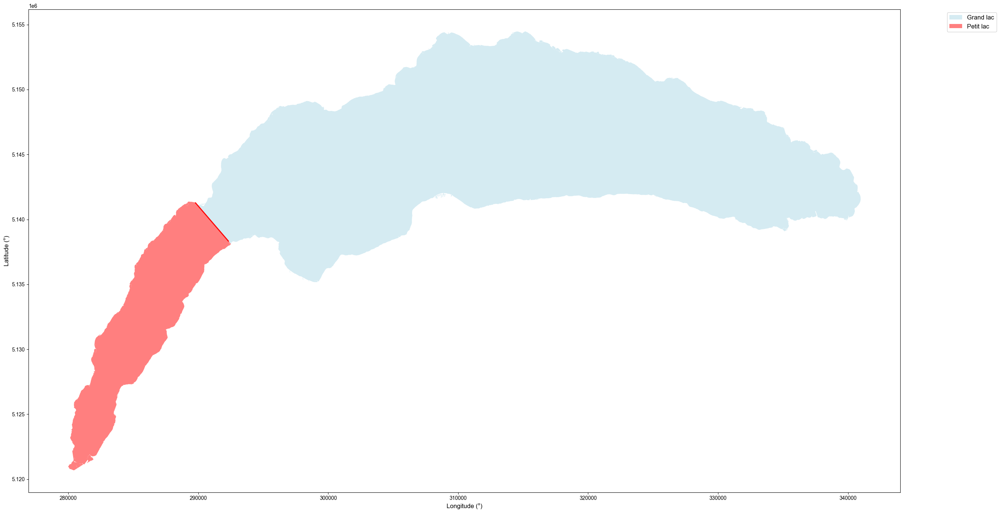

In [159]:
# Split the GeoDataFrame
grand_lac, petit_lac = split_above_below_line(gdf_utm, division_line_utm)

# Visualize the result
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(30, 20))
gl = grand_lac.plot(ax=ax, color='lightblue', alpha=0.5, label='Grand lac')
pl = petit_lac.plot(ax=ax, color='red', alpha=0.5, label='Petit lac')
x, y = division_line_utm.xy
ax.plot(x, y, color='red', linewidth=2)
legend_elements = [
    Patch(facecolor='lightblue', alpha=0.5, label='Grand lac'),
    Patch(facecolor='red', alpha=0.5, label='Petit lac')
]

ax.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
# Save the figure
plt.savefig('lake_division.png', dpi=300, bbox_inches='tight')
plt.show()

## 5.3. Lake segmentation

In [160]:
from shapely.geometry import Point
import geopandas as gpd

# Your longitude value
lon = 6.8  # e.g., 6.5
lat = 46.5  # any latitude in your study area

# Create a point and GeoDataFrame
rhone_point = Point(lon, lat)
rhone_point = gpd.GeoDataFrame(geometry=[rhone_point], crs='EPSG:4326')

# Convert to UTM using the same CRS as your data
rhone_point_utm = rhone_point.to_crs(points_gdf_utm.crs)

# Get the UTM easting (x) coordinate
lon_threshold_utm = rhone_point_utm.geometry.x[0]

print(f"Longitude {lon} degrees = {lon_threshold_utm} meters (UTM easting)")

Longitude 6.8 degrees = 331191.96382232953 meters (UTM easting)


In [161]:
from shapely.geometry import LineString, box

# Create a vertical line at the UTM threshold that extends beyond your polygon
bbox = grand_lac.total_bounds  # gets the bounding box (minx, miny, maxx, maxy)
splitting_line = LineString([(lon_threshold_utm, bbox[1]), (lon_threshold_utm, bbox[3])])

# Create the splitting line as a GeoDataFrame
line_gdf = gpd.GeoDataFrame(geometry=[splitting_line], crs=grand_lac.crs)

# Split the polygon using the line
rhone_estuary = grand_lac.copy()

# Use geometric difference and intersection to split
rhone_estuary.geometry = grand_lac.geometry.intersection(box(lon_threshold_utm, bbox[1], bbox[2], bbox[3]))
grand_lac.geometry = grand_lac.geometry.difference(box(lon_threshold_utm, bbox[1], bbox[2], bbox[3]))

# Now you have two separate polygons
# grand_lac_west has the part west of the line
# grand_lac_east has the part east of the line (rhone estuary)

In [162]:
from geopandas import GeoSeries

C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\3278526700.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


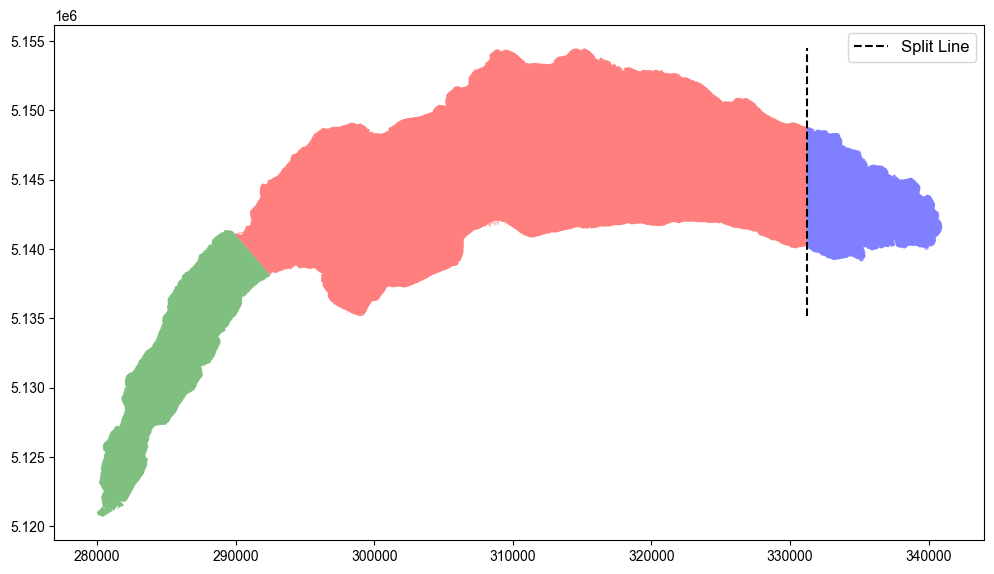

In [163]:
fig, ax = plt.subplots(figsize=(12, 8))
rhone_estuary.plot(ax=ax, color='blue', alpha=0.5, label='Rhone Estuary')
grand_lac.plot(ax=ax, color='red', alpha=0.5, label='Grand Lac')
line_gdf.plot(ax=ax, color='black', linestyle='--', label='Split Line')
petit_lac.plot(ax=ax, color='green', alpha=0.5, label='Petit Lac')
plt.legend()
plt.show()

In [164]:
# Add a column for lake bounds flag
points_gdf_utm['petit_lac'] = 0  # initialize all to 0
points_gdf_utm['grand_lac'] = 0  # initialize all to 0
points_gdf_utm['rhone_est'] = 0  # initialize all to 0

# Get lake geometry
petit_geom = petit_lac.iloc[0].geometry
grand_geom = grand_lac.iloc[0].geometry
rhone_geom = rhone_estuary.iloc[0].geometry

# Flag points: 1 if outside, 0 if inside or on boundary
points_gdf_utm['petit_lac'] = points_gdf_utm.geometry.within(petit_geom).astype(int)
points_gdf_utm['grand_lac'] = points_gdf_utm.geometry.within(grand_geom).astype(int)
points_gdf_utm['rhone_est'] = points_gdf_utm.geometry.within(rhone_geom).astype(int)

In [165]:
backup = points_gdf_utm.copy()

In [166]:
points_gdf_utm.to_csv(parent_dir / 'outputs' / 'backup.csv', index=False)

# 6. S3 Data extraction

In [167]:
points_gdf_utm.columns

Index(['location_lat', 'location_lng', 'device_device_model',
       'device_device_platform', 'image_bottom', 'image_date_photo',
       'image_image', 'image_viewing_angle', 'image_rain', 'water_fu_observed',
       'water_fu_processed', 'water_fu_processed_clouds',
       'water_fu_processed_old', 'water_fu_value', 'water_hue_angle',
       'water_hue_angle_centre', 'water_hue_angle_centre_clouds',
       'water_hue_angle_centre_old', 'water_hue_angle_clouds',
       'water_hue_angle_old', 'water_macrophytes', 'water_overcast_hue_best',
       'water_overcast_hue_best_fu', 'water_overcast_hue_center',
       'water_overcast_hue_center_fu', 'water_p_chla', 'water_p_cloud_cover',
       'water_p_colour', 'water_p_conductivity', 'water_p_dissolved_oxygen',
       'water_p_ph', 'water_p_phycocyanin', 'water_p_salinity',
       'water_p_temperature', 'water_sd_depth', 'water_sunny_hue_best',
       'water_sunny_hue_best_fu', 'water_sunny_hue_center',
       'water_sunny_hue_center_fu', '

In [168]:

# Convert to date only (without time) for consistent matching
# First convert to datetime if not already

points_gdf_utm['image_date_only'] = pd.to_datetime(points_gdf_utm['image_date_photo']).dt.date

# Prepare a list to store each row's results
results_list_sd = []
results_list_fu = []

# Iterate through each record in df with tqdm progress bar
for idx, row in tqdm(points_gdf_utm.iterrows(), total=len(points_gdf_utm), desc="Processing records"):
    date = row['image_date_only']
    lat, lon = row['location_lat'], row['location_lng']
    Z_in_situ = row['water_sd_depth']
    water_fu_processed = row['water_fu_processed']
    depth_swiss_bathy = row['depth_swiss_bathy'] 
    user_nickname = row['user_nickname']
    LOC_OOB =  row['LOC_OOB']
    SEC_OOR = row['SEC_OOR']
    UVF = row['UVF']
    dist_345_15_DEG = row['345_15_DEG']
    dist_15_45_DEG = row['15_45_DEG']
    dist_45_75_DEG = row['45_75_DEG']
    dist_75_105_DEG = row['75_105_DEG']
    dist_105_135_DEG = row['105_135_DEG']
    dist_135_165_DEG = row['135_165_DEG']
    dist_165_195_DEG = row['165_195_DEG']
    dist_195_225_DEG = row['195_225_DEG']
    dist_225_255_DEG = row['225_255_DEG']
    dist_255_285_DEG = row['255_285_DEG']
    dist_285_315_DEG = row['285_315_DEG']
    dist_315_345_DEG = row['315_345_DEG']
    petit_lac = row['petit_lac']
    grand_lac = row['grand_lac']
    rhone_est = row['rhone_est']

    # Filter records in s3_features with matching date
    matching_records_sd = s3_features_sd[s3_features_sd['date'] == date]
    matching_records_fu = s3_features_fu[s3_features_fu['date'] == date]

    # Store the Zsd_lee values from the .tiff files for this set of matching records
    Zsd_lee_values = []
    fu_ind_values = []

    # Process each matching record
    for _, match_row in matching_records_sd.iterrows():
        
        tif_file_path = parent_dir / 'data' / 's3_tiff_sd' / match_row['name']

        # with rasterio.open(tif_file_path) as src:
        #     # Get the transform, shape, and CRS of the TIFF file
        #     transform = src.transform
        #     out_shape = src.shape
        #     crs = src.crs

        raster = rxr.open_rasterio(tif_file_path)
        # Get value at point
        Zsd_lee_value = raster.sel(x=lon, y=lat, method='nearest').values[0]
        Zsd_lee_values.append(Zsd_lee_value)

    # Calculate statistics if we have Zsd_lee values
    if Zsd_lee_values and not np.all(np.isnan(Zsd_lee_values)):
        num_records = len(Zsd_lee_values)
        min_Zsd_lee = np.nanmin(Zsd_lee_values)
        max_Zsd_lee = np.nanmax(Zsd_lee_values)
        mean_Zsd_lee = np.nanmean(Zsd_lee_values)
        median_Zsd_lee = np.nanmedian(Zsd_lee_values)
        std_Zsd_lee = np.nanstd(Zsd_lee_values)

        # Append the result to the list
        results_list_sd.append({
            'image_date_photo': date,
            'lat': lat,
            'lon': lon,
            'Z_in_situ': Z_in_situ,
            'num_records': num_records,
            'min_Zsd_lee': min_Zsd_lee,
            'max_Zsd_lee': max_Zsd_lee,
            'mean_Zsd_lee': mean_Zsd_lee,
            'median_Zsd_lee': median_Zsd_lee,
            'std_Zsd_lee': std_Zsd_lee,
            'water_fu_processed': water_fu_processed,
            'depth_swiss_bathy': depth_swiss_bathy,
            'user_nickname' : user_nickname,
            'LOC_OOB' :  LOC_OOB,
            'SEC_OOR' : SEC_OOR,
            'UVF' : UVF,
            'dist_345_15_DEG' : dist_345_15_DEG,
            'dist_15_45_DEG' : dist_15_45_DEG,
            'dist_45_75_DEG' : dist_45_75_DEG,
            'dist_75_105_DEG' : dist_75_105_DEG,
            'dist_105_135_DEG' : dist_105_135_DEG,
            'dist_135_165_DEG' : dist_135_165_DEG,
            'dist_165_195_DEG' : dist_165_195_DEG,
            'dist_195_225_DEG' : dist_195_225_DEG,
            'dist_225_255_DEG' : dist_225_255_DEG,
            'dist_255_285_DEG' : dist_255_285_DEG,
            'dist_285_315_DEG' : dist_285_315_DEG,
            'dist_315_345_DEG' : dist_315_345_DEG,
            'petit_lac' : petit_lac,
            'grand_lac' : grand_lac,
            'rhone_est' : rhone_est
        })


    # Process each matching record
    for _, match_row in matching_records_fu.iterrows():
        
        tif_file_path = parent_dir / 'data' / 's3_tiff_fu' / match_row['name']

        # with rasterio.open(tif_file_path) as src:
        #     # Get the transform, shape, and CRS of the TIFF file
        #     transform = src.transform
        #     out_shape = src.shape
        #     crs = src.crs

        raster = rxr.open_rasterio(tif_file_path)
        # Get value at point
        fu_ind_value = raster.sel(x=lon, y=lat, method='nearest').values[0]
        fu_ind_values.append(fu_ind_value)

    # Calculate statistics if we have fu_ind values
    if fu_ind_values and not np.all(np.isnan(fu_ind_values)):
        num_records = len(fu_ind_values)
        min_fu_ind = np.nanmin(fu_ind_values)
        max_fu_ind = np.nanmax(fu_ind_values)
        mean_fu_ind = np.nanmean(fu_ind_values)
        median_fu_ind = np.nanmedian(fu_ind_values)
        std_fu_ind = np.nanstd(fu_ind_values)

        # Append the result to the list
        results_list_fu.append({
            'image_date_photo': date,
            'lat': lat,
            'lon': lon,
            'Z_in_situ': Z_in_situ,
            'num_records': num_records,
            'min_fu_ind': min_fu_ind,
            'max_fu_ind': max_fu_ind,
            'mean_fu_ind': mean_fu_ind,
            'median_fu_ind': median_fu_ind,
            'std_fu_ind': std_fu_ind,
            'water_fu_processed': water_fu_processed,
            'depth_swiss_bathy': depth_swiss_bathy,
            'user_nickname' : user_nickname,
            'LOC_OOB' :  LOC_OOB,
            'SEC_OOR' : SEC_OOR,
            'UVF' : UVF,
            'dist_345_15_DEG' : dist_345_15_DEG,
            'dist_15_45_DEG' : dist_15_45_DEG,
            'dist_45_75_DEG' : dist_45_75_DEG,
            'dist_75_105_DEG' : dist_75_105_DEG,
            'dist_105_135_DEG' : dist_105_135_DEG,
            'dist_135_165_DEG' : dist_135_165_DEG,
            'dist_165_195_DEG' : dist_165_195_DEG,
            'dist_195_225_DEG' : dist_195_225_DEG,
            'dist_225_255_DEG' : dist_225_255_DEG,
            'dist_255_285_DEG' : dist_255_285_DEG,
            'dist_285_315_DEG' : dist_285_315_DEG,
            'dist_315_345_DEG' : dist_315_345_DEG,
            'petit_lac' : petit_lac,
            'grand_lac' : grand_lac,
            'rhone_est' : rhone_est
        })


# Convert the list of results into a DataFrame
annotated_data_sd = pd.DataFrame(results_list_sd)
annotated_data_fu = pd.DataFrame(results_list_fu)

# Display results
print(annotated_data_sd)
print(annotated_data_fu)

Processing records: 100%|██████████████████████████████████████████████████████████| 2371/2371 [02:03<00:00, 19.25it/s]

     image_date_photo        lat       lon  Z_in_situ  num_records  \
0          2024-05-09  46.506363  6.602478        9.7            1   
1          2024-05-09  46.243238  6.190148        0.0            1   
2          2024-05-09  46.442720  6.770562        0.0            1   
3          2024-05-09  46.497860  6.604318        0.0            1   
4          2024-05-09  46.506026  6.533098        0.0            1   
...               ...        ...       ...        ...          ...   
1341       2025-02-15  46.393623  6.826584        8.6            1   
1342       2025-02-15  46.488372  6.592238       11.0            1   
1343       2025-02-15  46.433981  6.761009       11.6            1   
1344       2025-02-15  46.409012  6.821830        8.6            1   
1345       2025-02-16  46.486058  6.650297       11.0            1   

      min_Zsd_lee  max_Zsd_lee  mean_Zsd_lee  median_Zsd_lee  std_Zsd_lee  \
0        9.170901     9.170901      9.170901        9.170901          0.0   
1    

# 7. Match-up

In [169]:
annotated_data_sd.columns

Index(['image_date_photo', 'lat', 'lon', 'Z_in_situ', 'num_records',
       'min_Zsd_lee', 'max_Zsd_lee', 'mean_Zsd_lee', 'median_Zsd_lee',
       'std_Zsd_lee', 'water_fu_processed', 'depth_swiss_bathy',
       'user_nickname', 'LOC_OOB', 'SEC_OOR', 'UVF', 'dist_345_15_DEG',
       'dist_15_45_DEG', 'dist_45_75_DEG', 'dist_75_105_DEG',
       'dist_105_135_DEG', 'dist_135_165_DEG', 'dist_165_195_DEG',
       'dist_195_225_DEG', 'dist_225_255_DEG', 'dist_255_285_DEG',
       'dist_285_315_DEG', 'dist_315_345_DEG', 'petit_lac', 'grand_lac',
       'rhone_est'],
      dtype='object')

## 7.1. All data

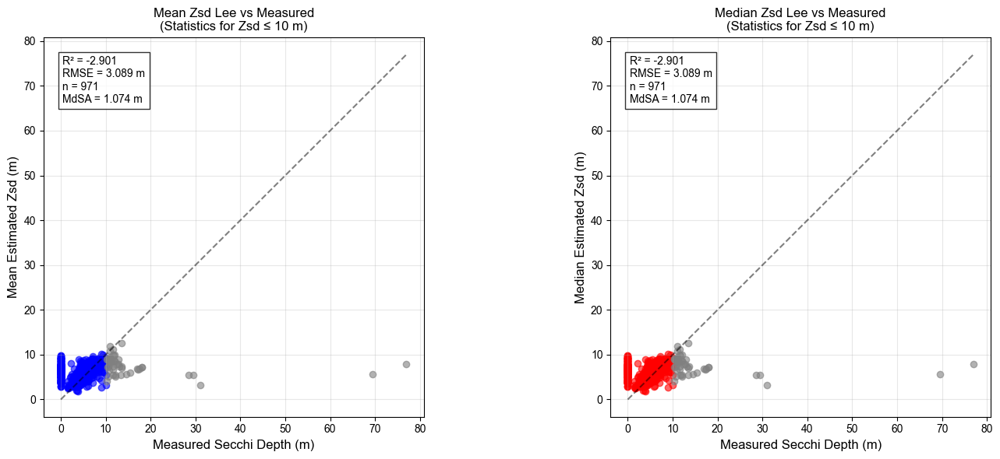

In [170]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Remove NaN values for statistics calculation
valid_mean_mask = ~np.isnan(annotated_data_sd['mean_Zsd_lee']) & ~np.isnan(annotated_data_sd['Z_in_situ'])
valid_median_mask = ~np.isnan(annotated_data_sd['median_Zsd_lee']) & ~np.isnan(annotated_data_sd['Z_in_situ'])

mean_data = annotated_data_sd[valid_mean_mask]
median_data = annotated_data_sd[valid_median_mask]

# Filter data for statistics (Z_in_situ <= 10)
mean_data_stats = mean_data[mean_data['Z_in_situ'] <= 10]
median_data_stats = median_data[median_data['Z_in_situ'] <= 10]

# Calculate statistics for mean plot (only for Z_in_situ <= 10)
r2_mean = r2_score(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ'])
rmse_mean = np.sqrt(mean_squared_error(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ']))
n_points_mean = len(mean_data_stats)
mdsa_mean = np.median(np.abs(mean_data_stats['mean_Zsd_lee'] - mean_data_stats['Z_in_situ']))

# Calculate statistics for median plot (only for Z_in_situ <= 10)
r2_median = r2_score(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ'])
rmse_median = np.sqrt(mean_squared_error(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ']))
n_points_median = len(median_data_stats)
mdsa_median = np.median(np.abs(median_data_stats['median_Zsd_lee'] - median_data_stats['Z_in_situ']))

# First scatter plot - Mean (with different colors)
ax1.scatter(mean_data[mean_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] <= 10]['mean_Zsd_lee'], 
           color='blue', alpha=0.6)
ax1.scatter(mean_data[mean_data['Z_in_situ'] > 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] > 10]['mean_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for first plot
min_val = min(mean_data[['mean_Zsd_lee', 'Z_in_situ']].min())
max_val = max(mean_data[['mean_Zsd_lee', 'Z_in_situ']].max())
ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Second scatter plot - Median (with different colors)
ax2.scatter(median_data[median_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] <= 10]['median_Zsd_lee'], 
           color='red', alpha=0.6)
ax2.scatter(median_data[median_data['Z_in_situ'] > 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] > 10]['median_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for second plot
min_val = min(median_data[['median_Zsd_lee', 'Z_in_situ']].min())
max_val = max(median_data[['median_Zsd_lee', 'Z_in_situ']].max())
ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Add statistics text to first plot (noting it's for Z_in_situ <= 10)
stats_text1 = f'R² = {r2_mean:.3f}\nRMSE = {rmse_mean:.3f} m\nn = {n_points_mean}\nMdSA = {mdsa_mean:.3f} m'
ax1.text(0.05, 0.95, stats_text1, transform=ax1.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Add statistics text to second plot (noting it's for Z_in_situ <= 10)
stats_text2 = f'R² = {r2_median:.3f}\nRMSE = {rmse_median:.3f} m\nn = {n_points_median}\nMdSA = {mdsa_median:.3f} m'
ax2.text(0.05, 0.95, stats_text2, transform=ax2.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Customize first plot
ax1.set_xlabel('Measured Secchi Depth (m)')
ax1.set_ylabel('Mean Estimated Zsd (m)')
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')
ax1.set_title('Mean Zsd Lee vs Measured\n(Statistics for Zsd ≤ 10 m)')

# Customize second plot
ax2.set_xlabel('Measured Secchi Depth (m)')
ax2.set_ylabel('Median Estimated Zsd (m)')
ax2.grid(True, alpha=0.3)
ax2.set_aspect('equal')
ax2.set_title('Median Zsd Lee vs Measured\n(Statistics for Zsd ≤ 10 m)')

plt.tight_layout()
plt.show()

## 7.2. Points inside the lake, with valid value of Secchi depth

Number of valid points (before NaN removal): 1151
Number of valid points after NaN removal - Mean: 829
Number of valid points after NaN removal - Median: 829
Number of valid points with Zsd ≤ 10m - Mean: 786
Number of valid points with Zsd ≤ 10m - Median: 786


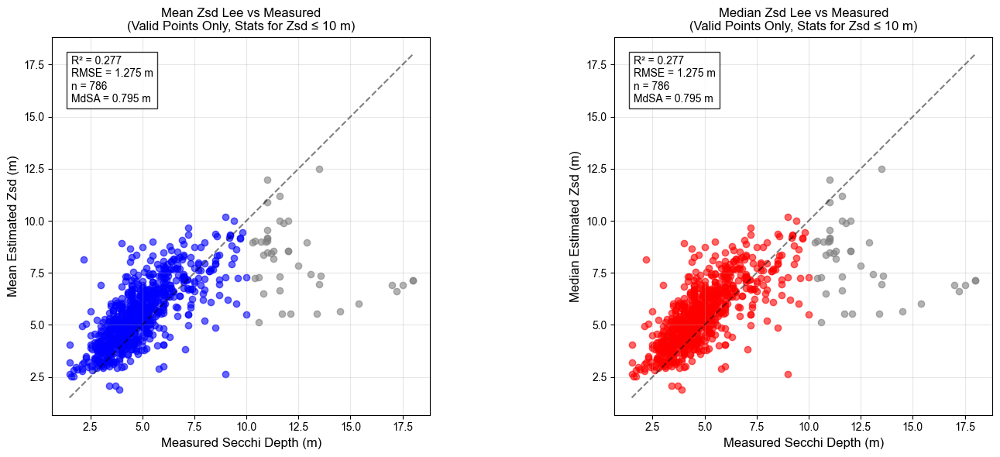

In [171]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
# Filter points where both conditions are zero
filtered_data = annotated_data_sd[(annotated_data_sd['LOC_OOB'] == 0) & (annotated_data_sd['SEC_OOR'] == 0)]
# Remove NaN values for statistics calculation
valid_mean_mask = ~np.isnan(filtered_data['mean_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
valid_median_mask = ~np.isnan(filtered_data['median_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
mean_data = filtered_data[valid_mean_mask]
median_data = filtered_data[valid_median_mask]

# Filter data for statistics (Z_in_situ <= 10)
mean_data_stats = mean_data[mean_data['Z_in_situ'] <= 10]
median_data_stats = median_data[median_data['Z_in_situ'] <= 10]

# Calculate statistics for mean plot (only for Z_in_situ <= 10)
r2_mean = r2_score(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ'])
rmse_mean = np.sqrt(mean_squared_error(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ']))
n_points_mean = len(mean_data_stats)
mdsa_mean = np.median(np.abs(mean_data_stats['mean_Zsd_lee'] - mean_data_stats['Z_in_situ']))

# Calculate statistics for median plot (only for Z_in_situ <= 10)
r2_median = r2_score(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ'])
rmse_median = np.sqrt(mean_squared_error(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ']))
n_points_median = len(median_data_stats)
mdsa_median = np.median(np.abs(median_data_stats['median_Zsd_lee'] - median_data_stats['Z_in_situ']))

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# First scatter plot - Mean (with different colors)
ax1.scatter(mean_data[mean_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] <= 10]['mean_Zsd_lee'], 
           color='blue', alpha=0.6)
ax1.scatter(mean_data[mean_data['Z_in_situ'] > 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] > 10]['mean_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for first plot
min_val = min(mean_data[['mean_Zsd_lee', 'Z_in_situ']].min())
max_val = max(mean_data[['mean_Zsd_lee', 'Z_in_situ']].max())
ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Second scatter plot - Median (with different colors)
ax2.scatter(median_data[median_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] <= 10]['median_Zsd_lee'], 
           color='red', alpha=0.6)
ax2.scatter(median_data[median_data['Z_in_situ'] > 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] > 10]['median_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for second plot
min_val = min(median_data[['median_Zsd_lee', 'Z_in_situ']].min())
max_val = max(median_data[['median_Zsd_lee', 'Z_in_situ']].max())
ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Add statistics text to first plot
stats_text1 = f'R² = {r2_mean:.3f}\nRMSE = {rmse_mean:.3f} m\nn = {n_points_mean}\nMdSA = {mdsa_mean:.3f} m'
ax1.text(0.05, 0.95, stats_text1, transform=ax1.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Add statistics text to second plot
stats_text2 = f'R² = {r2_median:.3f}\nRMSE = {rmse_median:.3f} m\nn = {n_points_median}\nMdSA = {mdsa_median:.3f} m'
ax2.text(0.05, 0.95, stats_text2, transform=ax2.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Customize first plot
ax1.set_xlabel('Measured Secchi Depth (m)')
ax1.set_ylabel('Mean Estimated Zsd (m)')
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')
ax1.set_title('Mean Zsd Lee vs Measured\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

# Customize second plot
ax2.set_xlabel('Measured Secchi Depth (m)')
ax2.set_ylabel('Median Estimated Zsd (m)')
ax2.grid(True, alpha=0.3)
ax2.set_aspect('equal')
ax2.set_title('Median Zsd Lee vs Measured\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

# Print number of total valid points
print(f"Number of valid points (before NaN removal): {len(filtered_data)}")
print(f"Number of valid points after NaN removal - Mean: {len(mean_data)}")
print(f"Number of valid points after NaN removal - Median: {len(median_data)}")
print(f"Number of valid points with Zsd ≤ 10m - Mean: {n_points_mean}")
print(f"Number of valid points with Zsd ≤ 10m - Median: {n_points_median}")

plt.tight_layout()
plt.show()

## 7.3. Points inside the lake, with valid value of Secchi depth and verified user

Number of valid points (before NaN removal): 983
Number of valid points after NaN removal - Mean: 751
Number of valid points after NaN removal - Median: 751
Number of valid points with Zsd ≤ 10m - Mean: 713
Number of valid points with Zsd ≤ 10m - Median: 713


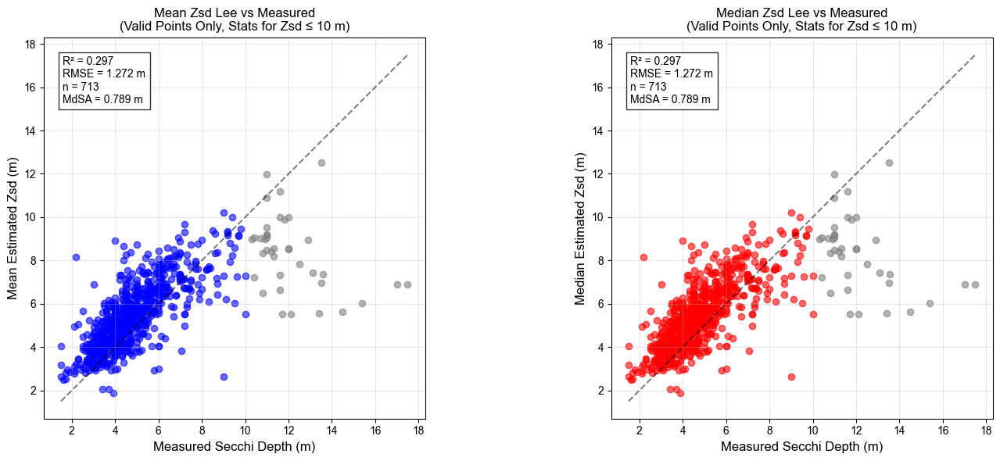

In [172]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
# Filter points where all three conditions are zero
filtered_data = annotated_data_sd[(annotated_data_sd['LOC_OOB'] == 0) & 
                             (annotated_data_sd['SEC_OOR'] == 0) &
                             (annotated_data_sd['UVF'] == 0)]
# Rest of the code remains the same
# Remove NaN values for statistics calculation
valid_mean_mask = ~np.isnan(filtered_data['mean_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
valid_median_mask = ~np.isnan(filtered_data['median_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
mean_data = filtered_data[valid_mean_mask]
median_data = filtered_data[valid_median_mask]

# Filter data for statistics (Z_in_situ <= 10)
mean_data_stats = mean_data[mean_data['Z_in_situ'] <= 10]
median_data_stats = median_data[median_data['Z_in_situ'] <= 10]

# Calculate statistics for mean plot (only for Z_in_situ <= 10)
r2_mean = r2_score(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ'])
rmse_mean = np.sqrt(mean_squared_error(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ']))
n_points_mean = len(mean_data_stats)
mdsa_mean = np.median(np.abs(mean_data_stats['mean_Zsd_lee'] - mean_data_stats['Z_in_situ']))

# Calculate statistics for median plot (only for Z_in_situ <= 10)
r2_median = r2_score(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ'])
rmse_median = np.sqrt(mean_squared_error(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ']))
n_points_median = len(median_data_stats)
mdsa_median = np.median(np.abs(median_data_stats['median_Zsd_lee'] - median_data_stats['Z_in_situ']))

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# First scatter plot - Mean (with different colors)
ax1.scatter(mean_data[mean_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] <= 10]['mean_Zsd_lee'], 
           color='blue', alpha=0.6)
ax1.scatter(mean_data[mean_data['Z_in_situ'] > 10]['Z_in_situ'], 
           mean_data[mean_data['Z_in_situ'] > 10]['mean_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for first plot
min_val = min(mean_data[['mean_Zsd_lee', 'Z_in_situ']].min())
max_val = max(mean_data[['mean_Zsd_lee', 'Z_in_situ']].max())
ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Second scatter plot - Median (with different colors)
ax2.scatter(median_data[median_data['Z_in_situ'] <= 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] <= 10]['median_Zsd_lee'], 
           color='red', alpha=0.6)
ax2.scatter(median_data[median_data['Z_in_situ'] > 10]['Z_in_situ'], 
           median_data[median_data['Z_in_situ'] > 10]['median_Zsd_lee'], 
           color='gray', alpha=0.6)

# Add 1:1 line for second plot
min_val = min(median_data[['median_Zsd_lee', 'Z_in_situ']].min())
max_val = max(median_data[['median_Zsd_lee', 'Z_in_situ']].max())
ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

# Add statistics text to first plot
stats_text1 = f'R² = {r2_mean:.3f}\nRMSE = {rmse_mean:.3f} m\nn = {n_points_mean}\nMdSA = {mdsa_mean:.3f} m'
ax1.text(0.05, 0.95, stats_text1, transform=ax1.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Add statistics text to second plot
stats_text2 = f'R² = {r2_median:.3f}\nRMSE = {rmse_median:.3f} m\nn = {n_points_median}\nMdSA = {mdsa_median:.3f} m'
ax2.text(0.05, 0.95, stats_text2, transform=ax2.transAxes, 
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Customize first plot
ax1.set_xlabel('Measured Secchi Depth (m)')
ax1.set_ylabel('Mean Estimated Zsd (m)')
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')
ax1.set_title('Mean Zsd Lee vs Measured\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

# Customize second plot
ax2.set_xlabel('Measured Secchi Depth (m)')
ax2.set_ylabel('Median Estimated Zsd (m)')
ax2.grid(True, alpha=0.3)
ax2.set_aspect('equal')
ax2.set_title('Median Zsd Lee vs Measured\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

# Print number of total valid points
print(f"Number of valid points (before NaN removal): {len(filtered_data)}")
print(f"Number of valid points after NaN removal - Mean: {len(mean_data)}")
print(f"Number of valid points after NaN removal - Median: {len(median_data)}")
print(f"Number of valid points with Zsd ≤ 10m - Mean: {n_points_mean}")
print(f"Number of valid points with Zsd ≤ 10m - Median: {n_points_median}")

plt.tight_layout()
plt.show()

## 7.4. Points inside the lake, with valid value of Secchi depth, verified user and different lake segments


Statistics for Grand Lac:
Number of valid points (before NaN removal): 560
Number of valid points after NaN removal - Mean: 462
Number of valid points after NaN removal - Median: 462
Number of valid points with Zsd ≤ 10m - Mean: 438
Number of valid points with Zsd ≤ 10m - Median: 438

Statistics for Petit Lac:
Number of valid points (before NaN removal): 281
Number of valid points after NaN removal - Mean: 186
Number of valid points after NaN removal - Median: 186
Number of valid points with Zsd ≤ 10m - Mean: 176
Number of valid points with Zsd ≤ 10m - Median: 176

Statistics for Rhone Estuary:
Number of valid points (before NaN removal): 142
Number of valid points after NaN removal - Mean: 103
Number of valid points after NaN removal - Median: 103
Number of valid points with Zsd ≤ 10m - Mean: 99
Number of valid points with Zsd ≤ 10m - Median: 99


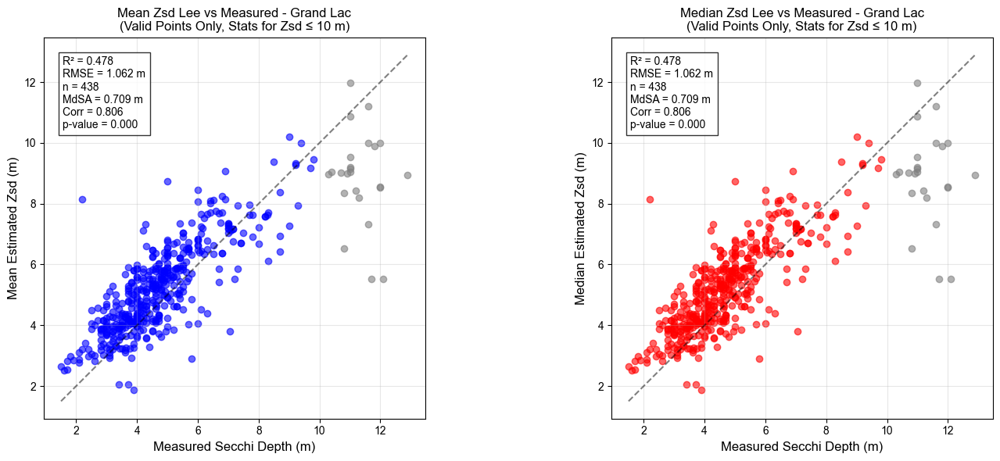

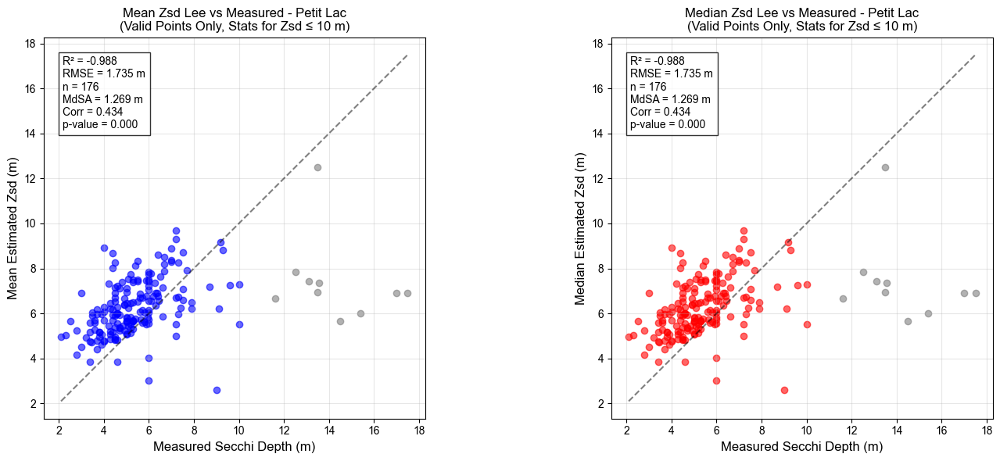

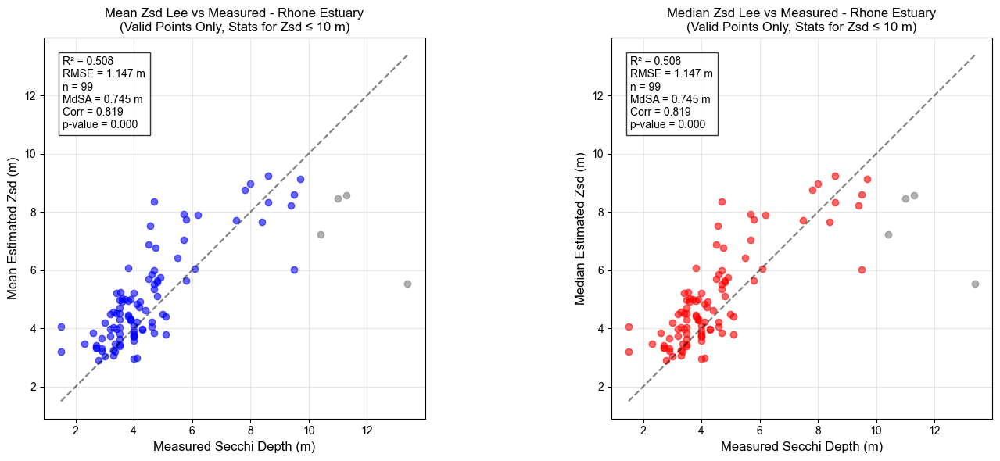

In [173]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
# Using scipy (most direct way to get Pearson's r)
from scipy.stats import pearsonr


# Function to create plots for a specific lake condition
def create_lake_plots(data, lake_condition, lake_name):
    # Filter points where conditions are met
    filtered_data = data[(data['LOC_OOB'] == 0) & 
                        (data['SEC_OOR'] == 0) &
                        (data['UVF'] == 0) &
                        (data[lake_condition] == 1)]
    
    # Remove NaN values for statistics calculation
    valid_mean_mask = ~np.isnan(filtered_data['mean_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
    valid_median_mask = ~np.isnan(filtered_data['median_Zsd_lee']) & ~np.isnan(filtered_data['Z_in_situ'])
    mean_data = filtered_data[valid_mean_mask]
    median_data = filtered_data[valid_median_mask]

    # Filter data for statistics (Z_in_situ <= 10)
    mean_data_stats = mean_data[mean_data['Z_in_situ'] <= 10]
    median_data_stats = median_data[median_data['Z_in_situ'] <= 10]

    # Calculate statistics for mean plot (only for Z_in_situ <= 10)
    r2_mean = r2_score(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ'])
    rmse_mean = np.sqrt(mean_squared_error(mean_data_stats['mean_Zsd_lee'], mean_data_stats['Z_in_situ']))
    n_points_mean = len(mean_data_stats)
    mdsa_mean = np.median(np.abs(mean_data_stats['mean_Zsd_lee'] - mean_data_stats['Z_in_situ']))
    correlation_mean, p_value_mean = pearsonr(mean_data_stats['Z_in_situ'], mean_data_stats['mean_Zsd_lee'])

    # Calculate statistics for median plot (only for Z_in_situ <= 10)
    r2_median = r2_score(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ'])
    rmse_median = np.sqrt(mean_squared_error(median_data_stats['median_Zsd_lee'], median_data_stats['Z_in_situ']))
    n_points_median = len(median_data_stats)
    mdsa_median = np.median(np.abs(median_data_stats['median_Zsd_lee'] - median_data_stats['Z_in_situ']))
    correlation_median, p_value_median = pearsonr(mean_data_stats['Z_in_situ'], mean_data_stats['median_Zsd_lee'])
    
    # Create figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # First scatter plot - Mean (with different colors)
    ax1.scatter(mean_data[mean_data['Z_in_situ'] <= 10]['Z_in_situ'], 
               mean_data[mean_data['Z_in_situ'] <= 10]['mean_Zsd_lee'], 
               color='blue', alpha=0.6)
    ax1.scatter(mean_data[mean_data['Z_in_situ'] > 10]['Z_in_situ'], 
               mean_data[mean_data['Z_in_situ'] > 10]['mean_Zsd_lee'], 
               color='gray', alpha=0.6)

    # Add 1:1 line for first plot
    min_val = min(mean_data[['mean_Zsd_lee', 'Z_in_situ']].min())
    max_val = max(mean_data[['mean_Zsd_lee', 'Z_in_situ']].max())
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

    # Second scatter plot - Median (with different colors)
    ax2.scatter(median_data[median_data['Z_in_situ'] <= 10]['Z_in_situ'], 
               median_data[median_data['Z_in_situ'] <= 10]['median_Zsd_lee'], 
               color='red', alpha=0.6)
    ax2.scatter(median_data[median_data['Z_in_situ'] > 10]['Z_in_situ'], 
               median_data[median_data['Z_in_situ'] > 10]['median_Zsd_lee'], 
               color='gray', alpha=0.6)

    # Add 1:1 line for second plot
    min_val = min(median_data[['median_Zsd_lee', 'Z_in_situ']].min())
    max_val = max(median_data[['median_Zsd_lee', 'Z_in_situ']].max())
    ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='1:1 line')

    # Add statistics text to first plot
    stats_text1 = f'R² = {r2_mean:.3f}\nRMSE = {rmse_mean:.3f} m\nn = {n_points_mean}\nMdSA = {mdsa_mean:.3f} m\nCorr = {correlation_mean:.3f}\np-value = {p_value_mean:.3f}'
    ax1.text(0.05, 0.95, stats_text1, transform=ax1.transAxes, 
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

    # Add statistics text to second plot
    stats_text2 = f'R² = {r2_median:.3f}\nRMSE = {rmse_median:.3f} m\nn = {n_points_median}\nMdSA = {mdsa_median:.3f} m\nCorr = {correlation_median:.3f}\np-value = {p_value_median:.3f}'
    ax2.text(0.05, 0.95, stats_text2, transform=ax2.transAxes, 
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

    # Customize first plot
    ax1.set_xlabel('Measured Secchi Depth (m)')
    ax1.set_ylabel('Mean Estimated Zsd (m)')
    ax1.grid(True, alpha=0.3)
    ax1.set_aspect('equal')
    ax1.set_title(f'Mean Zsd Lee vs Measured - {lake_name}\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

    # Customize second plot
    ax2.set_xlabel('Measured Secchi Depth (m)')
    ax2.set_ylabel('Median Estimated Zsd (m)')
    ax2.grid(True, alpha=0.3)
    ax2.set_aspect('equal')
    ax2.set_title(f'Median Zsd Lee vs Measured - {lake_name}\n(Valid Points Only, Stats for Zsd ≤ 10 m)')

    plt.tight_layout()
    
    # Print statistics
    print(f"\nStatistics for {lake_name}:")
    print(f"Number of valid points (before NaN removal): {len(filtered_data)}")
    print(f"Number of valid points after NaN removal - Mean: {len(mean_data)}")
    print(f"Number of valid points after NaN removal - Median: {len(median_data)}")
    print(f"Number of valid points with Zsd ≤ 10m - Mean: {n_points_mean}")
    print(f"Number of valid points with Zsd ≤ 10m - Median: {n_points_median}")

# Create plots for each lake condition
create_lake_plots(annotated_data_sd, 'grand_lac', 'Grand Lac')
create_lake_plots(annotated_data_sd, 'petit_lac', 'Petit Lac')
create_lake_plots(annotated_data_sd, 'rhone_est', 'Rhone Estuary')

plt.show()

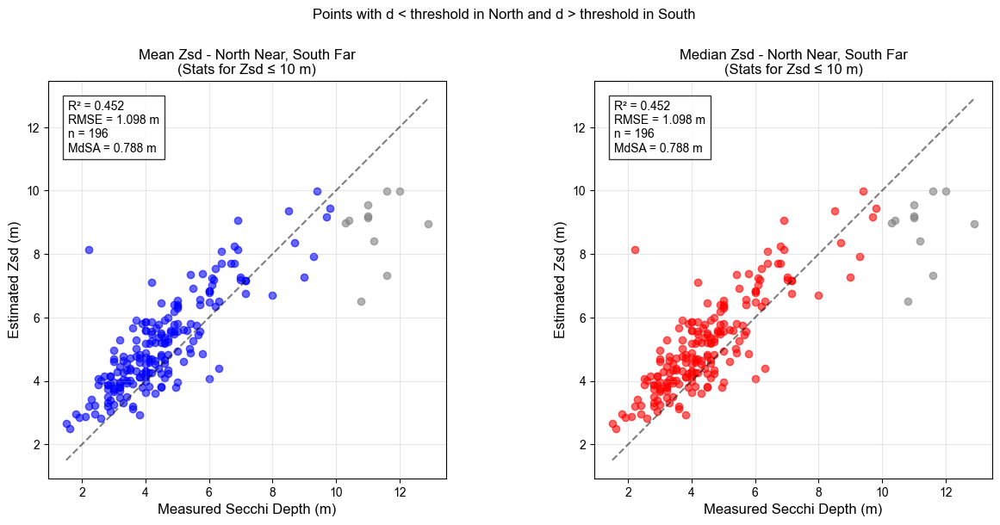

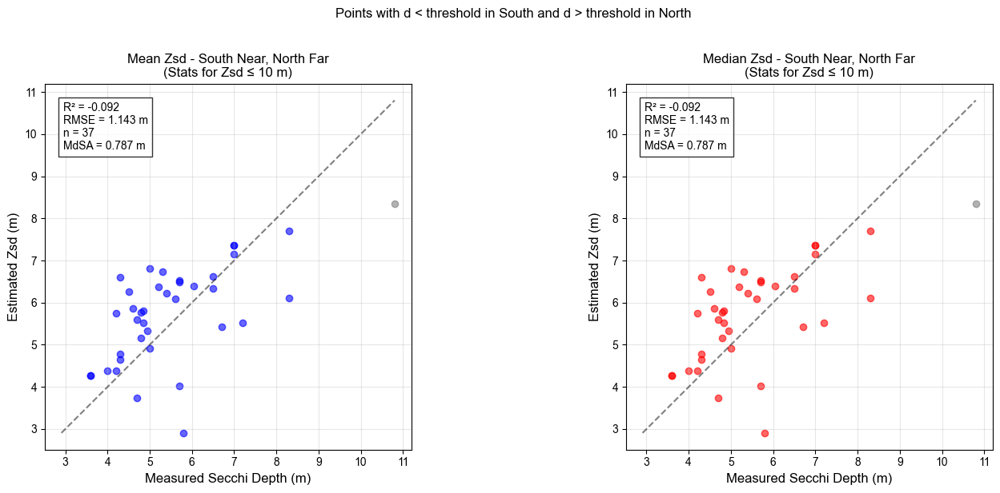


Number of points satisfying North near, South far conditions: 268
Number of points satisfying South near, North far conditions: 45

Points with Zsd ≤ 10m:
North near, South far: 196
South near, North far: 37


In [174]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

# First, filter the base conditions
base_filtered_data = annotated_data_sd[(annotated_data_sd['LOC_OOB'] == 0) & 
                                  (annotated_data_sd['SEC_OOR'] == 0) &
                                  (annotated_data_sd['UVF'] == 0) &
                                  (annotated_data_sd['grand_lac'] == 1)]


# Define the azimuth groups
north_cols = ['dist_285_315_DEG', 'dist_315_345_DEG', 'dist_345_15_DEG',
               'dist_15_45_DEG', 'dist_45_75_DEG']
south_cols = ['dist_105_135_DEG', 'dist_135_165_DEG', 'dist_165_195_DEG', 
              'dist_195_225_DEG', 'dist_225_255_DEG']

threshold = 2000
# Filter for Plot 1 conditions
plot1_mask = (
    # At least one distance < threshold in north
    (base_filtered_data[north_cols] < threshold).any(axis=1) &
    # All distances > threshold in south
    (base_filtered_data[south_cols] >= threshold).all(axis=1)
)

# Filter for Plot 2 conditions
plot2_mask = (
    # At least one distance < threshold in south
    (base_filtered_data[south_cols] < threshold).any(axis=1) &
    # All distances > threshold in north
    (base_filtered_data[north_cols] >= threshold).all(axis=1)
)

plot1_data = base_filtered_data[plot1_mask]
plot2_data = base_filtered_data[plot2_mask]

# Create two figures, each with two subplots
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig2, (ax3, ax4) = plt.subplots(1, 2, figsize=(15, 6))

def plot_and_calculate_stats(data, ax, est_col, title):
    # Split data by Z_in_situ threshold
    data_under_10 = data[data['Z_in_situ'] <= 10]
    data_over_10 = data[data['Z_in_situ'] > 10]
    
    # Plot points
    ax.scatter(data_under_10['Z_in_situ'], data_under_10[est_col], 
              color='blue' if 'mean' in est_col else 'red', alpha=0.6)
    ax.scatter(data_over_10['Z_in_situ'], data_over_10[est_col], 
              color='gray', alpha=0.6)
    
    # Calculate statistics for points <= 10m
    if len(data_under_10) > 0:
        r2 = r2_score(data_under_10[est_col], data_under_10['Z_in_situ'])
        rmse = np.sqrt(mean_squared_error(data_under_10[est_col], data_under_10['Z_in_situ']))
        mdsa = np.median(np.abs(data_under_10[est_col] - data_under_10['Z_in_situ']))
        n = len(data_under_10)
        
        # Add statistics text
        stats_text = f'R² = {r2:.3f}\nRMSE = {rmse:.3f} m\nn = {n}\nMdSA = {mdsa:.3f} m'
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
    
    # Add 1:1 line
    if len(data) > 0:
        min_val = min(data[[est_col, 'Z_in_situ']].min())
        max_val = max(data[[est_col, 'Z_in_situ']].max())
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)
    
    # Customize plot
    ax.set_xlabel('Measured Secchi Depth (m)')
    ax.set_ylabel('Estimated Zsd (m)')
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal')
    ax.set_title(f'{title}\n(Stats for Zsd ≤ 10 m)')

# Plot figure 1 (North < threshold, South > threshold)
plot_and_calculate_stats(plot1_data, ax1, 'mean_Zsd_lee', 'Mean Zsd - North Near, South Far')
plot_and_calculate_stats(plot1_data, ax2, 'median_Zsd_lee', 'Median Zsd - North Near, South Far')
fig1.suptitle('Points with d < threshold in North and d > threshold in South', y=1.02)

# Plot figure 2 (South < threshold, North > threshold)
plot_and_calculate_stats(plot2_data, ax3, 'mean_Zsd_lee', 'Mean Zsd - South Near, North Far')
plot_and_calculate_stats(plot2_data, ax4, 'median_Zsd_lee', 'Median Zsd - South Near, North Far')
fig2.suptitle('Points with d < threshold in South and d > threshold in North', y=1.02)

plt.tight_layout()
plt.show()

# Print number of points in each case
print(f"\nNumber of points satisfying North near, South far conditions: {len(plot1_data)}")
print(f"Number of points satisfying South near, North far conditions: {len(plot2_data)}")
print(f"\nPoints with Zsd ≤ 10m:")
print(f"North near, South far: {len(plot1_data[plot1_data['Z_in_situ'] <= 10])}")
print(f"South near, North far: {len(plot2_data[plot2_data['Z_in_situ'] <= 10])}")

C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\4128744170.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot1_data['min_north_dist'] = plot1_data[north_cols].min(axis=1)
C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\4128744170.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot2_data['min_south_dist'] = plot2_data[south_cols].min(axis=1)
C:\Users\ghadyaya\AppData\Local\Temp\ipykernel_6752\4128744170.py:75: UserWarning: Adding colorbar to a different Figure <Figure size 1500x600 with 

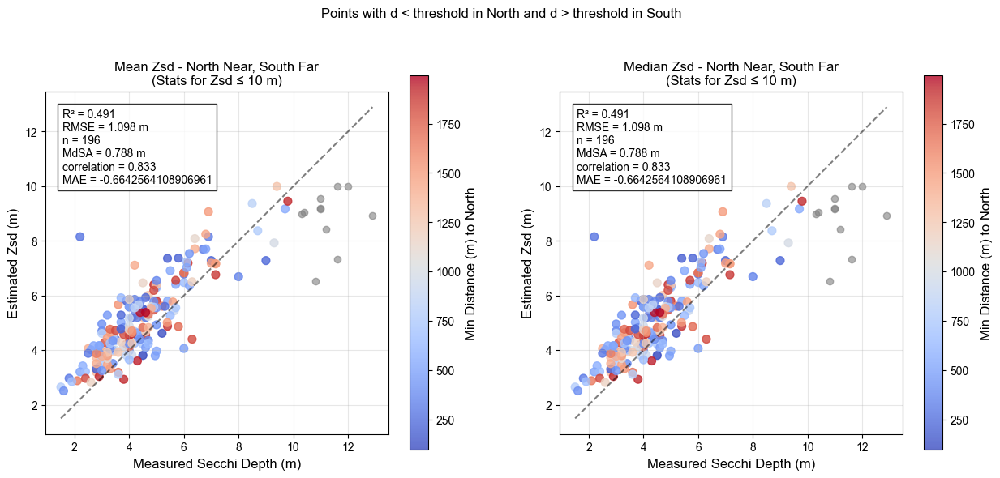

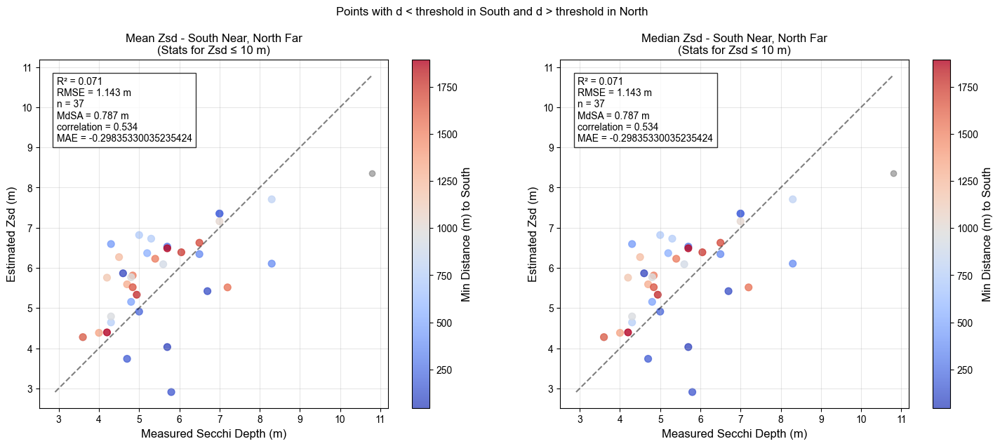


Number of points satisfying North near, South far conditions: 268
Number of points satisfying South near, North far conditions: 45

Points with Zsd ≤ 10m:
North near, South far: 196
South near, North far: 37

North distances range: 95.7 - 1993.7 meters
South distances range: 45.5 - 1896.7 meters


In [175]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.colors as mcolors
from matplotlib.cm import viridis, coolwarm

# First, filter the base conditions
base_filtered_data = annotated_data_sd[(annotated_data_sd['LOC_OOB'] == 0) & 
                                  (annotated_data_sd['SEC_OOR'] == 0) &
                                  (annotated_data_sd['UVF'] == 0) &
                                  (annotated_data_sd['grand_lac'] == 1)]


# Define the azimuth groups
north_cols = ['dist_285_315_DEG', 'dist_315_345_DEG', 'dist_345_15_DEG',
               'dist_15_45_DEG', 'dist_45_75_DEG']
south_cols = ['dist_105_135_DEG', 'dist_135_165_DEG', 'dist_165_195_DEG', 
              'dist_195_225_DEG', 'dist_225_255_DEG']

threshold = 2000
# Filter for Plot 1 conditions
plot1_mask = (
    # At least one distance < threshold in north
    (base_filtered_data[north_cols] < threshold).any(axis=1) &
    # All distances > threshold in south
    (base_filtered_data[south_cols] >= threshold).all(axis=1)
)

# Filter for Plot 2 conditions
plot2_mask = (
    # At least one distance < threshold in south
    (base_filtered_data[south_cols] < threshold).any(axis=1) &
    # All distances > threshold in north
    (base_filtered_data[north_cols] >= threshold).all(axis=1)
)

plot1_data = base_filtered_data[plot1_mask]
plot2_data = base_filtered_data[plot2_mask]

# Calculate minimum distance for each direction group
plot1_data['min_north_dist'] = plot1_data[north_cols].min(axis=1)
plot2_data['min_south_dist'] = plot2_data[south_cols].min(axis=1)

# Create two figures, each with two subplots
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig2, (ax3, ax4) = plt.subplots(1, 2, figsize=(15, 6))

def plot_and_calculate_stats(data, ax, est_col, title, color_col=None, vmin=None, vmax=None):
    # Split data by Z_in_situ threshold
    data_under_10 = data[data['Z_in_situ'] <= 10]
    data_over_10 = data[data['Z_in_situ'] > 10]
    
    # Set up colormap for distance-based coloring
    if color_col:
        norm = mcolors.Normalize(vmin=vmin or data[color_col].min(), 
                                 vmax=vmax or data[color_col].max())
        cmap = coolwarm
        colors = cmap(norm(data_under_10[color_col]))
        
        # Plot points with color based on distance
        scatter = ax.scatter(data_under_10['Z_in_situ'], data_under_10[est_col], 
                   c=data_under_10[color_col], cmap=cmap, alpha=0.8, 
                   norm=norm, s=50)
    else:
        # Use default coloring if no color column is provided
        ax.scatter(data_under_10['Z_in_situ'], data_under_10[est_col], 
                  color='blue' if 'mean' in est_col else 'red', alpha=0.6)
    
    # Plot points above 10m in gray
    ax.scatter(data_over_10['Z_in_situ'], data_over_10[est_col], 
              color='gray', alpha=0.6)
    
    # Add colorbar if using distance-based colors
    if color_col and len(data_under_10) > 0:
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label(f'Min Distance (m) to {"North" if "north" in color_col else "South"}')
    
    # Calculate statistics for points <= 10m
    if len(data_under_10) > 0:
        r2 = r2_score(data_under_10['Z_in_situ'], data_under_10[est_col])
        rmse = np.sqrt(mean_squared_error(data_under_10['Z_in_situ'], data_under_10[est_col]))
        mdsa = np.median(np.abs(data_under_10['Z_in_situ'] - data_under_10[est_col]))
        n = len(data_under_10)
        correlation_mean, p_value_mean = pearsonr(data_under_10['Z_in_situ'],data_under_10[est_col])
        MAE = np.mean((data_under_10['Z_in_situ']-data_under_10[est_col]))
        
        # Add statistics text
        stats_text = f'R² = {r2:.3f}\nRMSE = {rmse:.3f} m\nn = {n}\nMdSA = {mdsa:.3f} m\ncorrelation = {correlation_mean:.3f}\nMAE = {MAE}'
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
    
    # Add 1:1 line
    if len(data) > 0:
        min_val = min(data[[est_col, 'Z_in_situ']].min())
        max_val = max(data[[est_col, 'Z_in_situ']].max())
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)
    
    # Customize plot
    ax.set_xlabel('Measured Secchi Depth (m)')
    ax.set_ylabel('Estimated Zsd (m)')
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal')
    ax.set_title(f'{title}\n(Stats for Zsd ≤ 10 m)')

# Get the overall min/max distances for consistent color scaling
min_north = plot1_data['min_north_dist'].min()
max_north = plot1_data['min_north_dist'].max()
min_south = plot2_data['min_south_dist'].min()
max_south = plot2_data['min_south_dist'].max()

# Plot figure 1 (North < threshold, South > threshold)
plot_and_calculate_stats(plot1_data, ax1, 'mean_Zsd_lee', 'Mean Zsd - North Near, South Far', 
                        'min_north_dist', min_north, max_north)
plot_and_calculate_stats(plot1_data, ax2, 'median_Zsd_lee', 'Median Zsd - North Near, South Far', 
                        'min_north_dist', min_north, max_north)
fig1.suptitle('Points with d < threshold in North and d > threshold in South', y=1.02)

# Plot figure 2 (South < threshold, North > threshold)
plot_and_calculate_stats(plot2_data, ax3, 'mean_Zsd_lee', 'Mean Zsd - South Near, North Far', 
                        'min_south_dist', min_south, max_south)
plot_and_calculate_stats(plot2_data, ax4, 'median_Zsd_lee', 'Median Zsd - South Near, North Far', 
                        'min_south_dist', min_south, max_south)
fig2.suptitle('Points with d < threshold in South and d > threshold in North', y=1.02)

plt.tight_layout()
plt.show()

# Print number of points in each case
print(f"\nNumber of points satisfying North near, South far conditions: {len(plot1_data)}")
print(f"Number of points satisfying South near, North far conditions: {len(plot2_data)}")
print(f"\nPoints with Zsd ≤ 10m:")
print(f"North near, South far: {len(plot1_data[plot1_data['Z_in_situ'] <= 10])}")
print(f"South near, North far: {len(plot2_data[plot2_data['Z_in_situ'] <= 10])}")

# Print range of distances
print(f"\nNorth distances range: {min_north:.1f} - {max_north:.1f} meters")
print(f"South distances range: {min_south:.1f} - {max_south:.1f} meters")

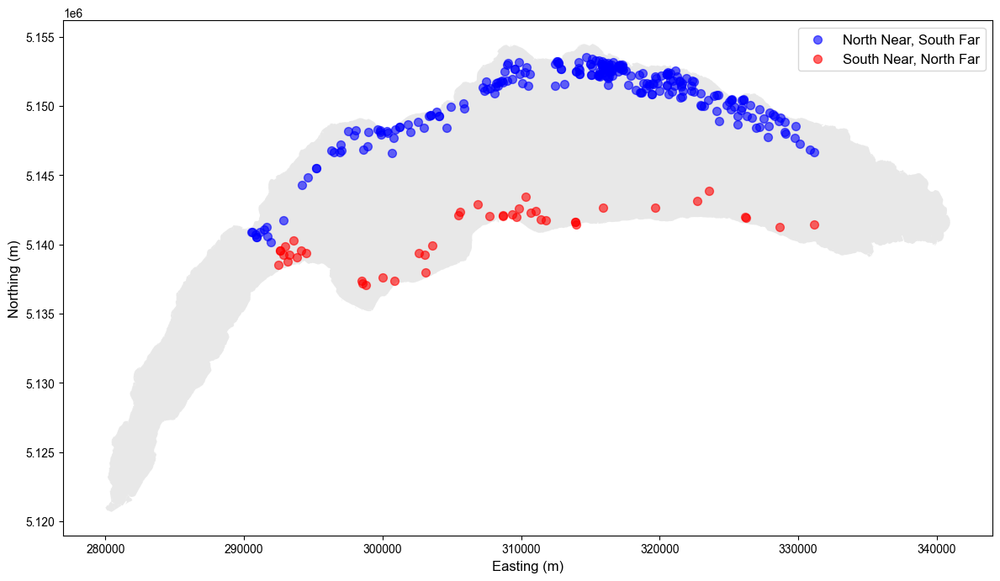

In [176]:
import pyproj
from pyproj import Transformer

# Create the transformer from WGS84 (lat/lon) to the UTM CRS of gdf_utm
transformer = Transformer.from_crs('EPSG:4326', gdf_utm.crs, always_xy=True)

# Transform coordinates
x_utm, y_utm = transformer.transform(plot1_data['lon'].values, plot1_data['lat'].values)
x_utm2, y_utm2 = transformer.transform(plot2_data['lon'].values, plot2_data['lat'].values)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the base layer
gdf_utm.plot(ax=ax, color='lightgray', alpha=0.5)

# Plot the points
ax.scatter(x_utm, y_utm, color='blue', label='North Near, South Far', alpha=0.6, s=50)
ax.scatter(x_utm2, y_utm2, color='red', label='South Near, North Far', alpha=0.6, s=50)

# Add legend and labels
ax.legend()
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

plt.tight_layout()
plt.show()

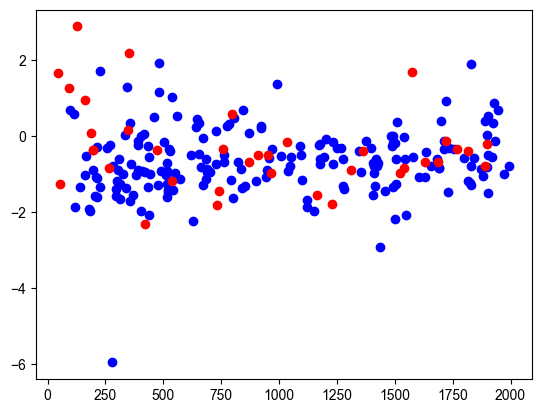

In [177]:
plot1_shallow = plot1_data[plot1_data['Z_in_situ'] <= 10].copy()
plot1_shallow['dist_north'] = plot1_shallow[north_cols].min(axis=1)
plot2_shallow = plot2_data[plot2_data['Z_in_situ'] <= 10].copy()
plot2_shallow['dist_south'] = plot2_shallow[south_cols].min(axis=1)

# Calculate errors (measured - estimated)
plot1_shallow['error_mean'] = plot1_shallow['Z_in_situ'] - plot1_shallow['mean_Zsd_lee']
plot1_shallow['error_median'] = plot1_shallow['Z_in_situ'] - plot1_shallow['median_Zsd_lee']
plot2_shallow['error_mean'] = plot2_shallow['Z_in_situ'] - plot2_shallow['mean_Zsd_lee']
plot2_shallow['error_median'] = plot2_shallow['Z_in_situ'] - plot2_shallow['median_Zsd_lee']

plt.scatter(plot1_shallow['dist_north'], plot1_shallow['error_mean'], color = 'blue')
plt.scatter(plot2_shallow['dist_south'], plot2_shallow['error_mean'], color = 'red')

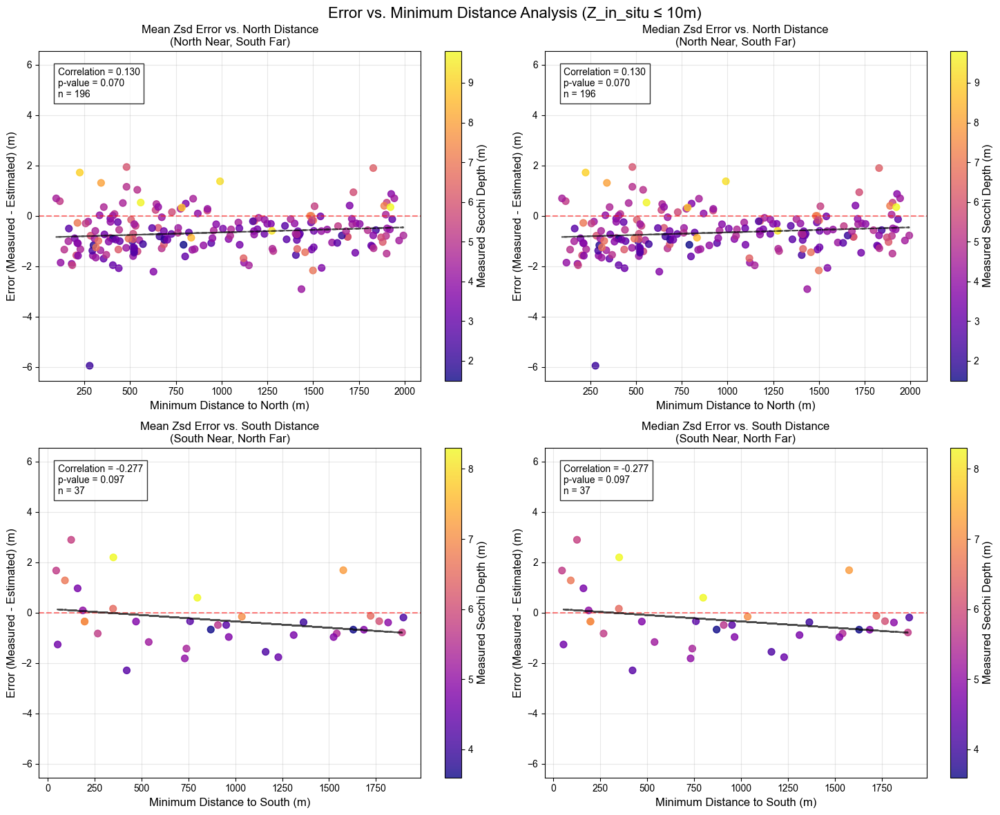


Error vs Distance Statistics (North Near, South Far):
Correlation (mean_Zsd_lee): 0.130, p-value: 0.070
Correlation (median_Zsd_lee): 0.130, p-value: 0.070

Error vs Distance Statistics (South Near, North Far):
Correlation (mean_Zsd_lee): -0.277, p-value: 0.097
Correlation (median_Zsd_lee): -0.277, p-value: 0.097

Error by Distance Bins:

North Near, South Far - Mean Zsd Error:
Distance 96-475m: Mean Error = -0.891m, Count = 50
Distance 475-855m: Mean Error = -0.582m, Count = 49
Distance 855-1235m: Mean Error = -0.590m, Count = 26
Distance 1235-1614m: Mean Error = -0.783m, Count = 36
Distance 1614-1994m: Mean Error = -0.378m, Count = 34

South Near, North Far - Mean Zsd Error:
Distance 46-416m: Mean Error = 0.586m, Count = 11
Distance 416-786m: Mean Error = -1.233m, Count = 6
Distance 786-1156m: Mean Error = -0.365m, Count = 6
Distance 1156-1527m: Mean Error = -1.114m, Count = 5
Distance 1527-1897m: Mean Error = -0.267m, Count = 8


In [178]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.colors as mcolors
from matplotlib.cm import viridis
from scipy.stats import pearsonr

# Use the already filtered data for points with Z_in_situ <= 10m
plot1_shallow = plot1_data[plot1_data['Z_in_situ'] <= 10].copy()
plot2_shallow = plot2_data[plot2_data['Z_in_situ'] <= 10].copy()

# Calculate errors (measured - estimated)
plot1_shallow['error_mean'] = plot1_shallow['Z_in_situ'] - plot1_shallow['mean_Zsd_lee']
plot1_shallow['error_median'] = plot1_shallow['Z_in_situ'] - plot1_shallow['median_Zsd_lee']
plot2_shallow['error_mean'] = plot2_shallow['Z_in_situ'] - plot2_shallow['mean_Zsd_lee']
plot2_shallow['error_median'] = plot2_shallow['Z_in_situ'] - plot2_shallow['median_Zsd_lee']

# Create a new figure for distance vs error analysis
fig_dist, axs = plt.subplots(2, 2, figsize=(15, 12))
ax1, ax2 = axs[0, 0], axs[0, 1]
ax3, ax4 = axs[1, 0], axs[1, 1]

def plot_error_vs_distance(data, ax, error_col, distance_col, title):
    # Scatter plot with errors on y-axis and distance on x-axis
    scatter = ax.scatter(data[distance_col], data[error_col], 
               c=data['Z_in_situ'], cmap='plasma', alpha=0.8, s=50)
    
    # Add horizontal line at zero error
    ax.axhline(y=0, color='r', linestyle='--', alpha=0.5)
    
    # Calculate correlation between distance and error
    corr, p_value = pearsonr(data[distance_col], data[error_col])
    
    # Add a linear trendline
    z = np.polyfit(data[distance_col], data[error_col], 1)
    p = np.poly1d(z)
    ax.plot(data[distance_col], p(data[distance_col]), "k--", alpha=0.7)
    
    # Add correlation text
    stats_text = f'Correlation = {corr:.3f}\np-value = {p_value:.3f}\nn = {len(data)}'
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
            verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
    
    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Measured Secchi Depth (m)')
    
    # Customize plot
    ax.set_xlabel(f'Minimum Distance to {"North" if "north" in distance_col else "South"} (m)')
    ax.set_ylabel('Error (Measured - Estimated) (m)')
    ax.grid(True, alpha=0.3)
    ax.set_title(title)
    
    return abs(data[error_col]).max()

# Plot for North Near, South Far
max_err1 = plot_error_vs_distance(plot1_shallow, ax1, 'error_mean', 'min_north_dist', 
                              'Mean Zsd Error vs. North Distance\n(North Near, South Far)')
max_err2 = plot_error_vs_distance(plot1_shallow, ax2, 'error_median', 'min_north_dist', 
                              'Median Zsd Error vs. North Distance\n(North Near, South Far)')

# Plot for South Near, North Far
max_err3 = plot_error_vs_distance(plot2_shallow, ax3, 'error_mean', 'min_south_dist', 
                              'Mean Zsd Error vs. South Distance\n(South Near, North Far)')
max_err4 = plot_error_vs_distance(plot2_shallow, ax4, 'error_median', 'min_south_dist', 
                              'Median Zsd Error vs. South Distance\n(South Near, North Far)')

# Set consistent y-axis limits
max_err = max(max_err1, max_err2, max_err3, max_err4)
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_ylim(-max_err*1.1, max_err*1.1)

fig_dist.suptitle('Error vs. Minimum Distance Analysis (Z_in_situ ≤ 10m)', y=0.98, fontsize=16)
plt.tight_layout()
plt.show()

# Calculate statistics for each dataset
print("\nError vs Distance Statistics (North Near, South Far):")
corr_mean1, p_mean1 = pearsonr(plot1_shallow['min_north_dist'], plot1_shallow['error_mean'])
corr_median1, p_median1 = pearsonr(plot1_shallow['min_north_dist'], plot1_shallow['error_median'])
print(f"Correlation (mean_Zsd_lee): {corr_mean1:.3f}, p-value: {p_mean1:.3f}")
print(f"Correlation (median_Zsd_lee): {corr_median1:.3f}, p-value: {p_median1:.3f}")

print("\nError vs Distance Statistics (South Near, North Far):")
corr_mean2, p_mean2 = pearsonr(plot2_shallow['min_south_dist'], plot2_shallow['error_mean'])
corr_median2, p_median2 = pearsonr(plot2_shallow['min_south_dist'], plot2_shallow['error_median'])
print(f"Correlation (mean_Zsd_lee): {corr_mean2:.3f}, p-value: {p_mean2:.3f}")
print(f"Correlation (median_Zsd_lee): {corr_median2:.3f}, p-value: {p_median2:.3f}")

# Additional analysis - Error by distance bins
distance_bins = 5  # Number of bins
print("\nError by Distance Bins:")

# North Near, South Far
print("\nNorth Near, South Far - Mean Zsd Error:")
bins = np.linspace(plot1_shallow['min_north_dist'].min(), plot1_shallow['min_north_dist'].max(), distance_bins+1)
for i in range(distance_bins):
    bin_data = plot1_shallow[(plot1_shallow['min_north_dist'] >= bins[i]) & 
                           (plot1_shallow['min_north_dist'] < bins[i+1])]
    if len(bin_data) > 0:
        print(f"Distance {bins[i]:.0f}-{bins[i+1]:.0f}m: Mean Error = {bin_data['error_mean'].mean():.3f}m, Count = {len(bin_data)}")

# South Near, North Far
print("\nSouth Near, North Far - Mean Zsd Error:")
bins = np.linspace(plot2_shallow['min_south_dist'].min(), plot2_shallow['min_south_dist'].max(), distance_bins+1)
for i in range(distance_bins):
    bin_data = plot2_shallow[(plot2_shallow['min_south_dist'] >= bins[i]) & 
                           (plot2_shallow['min_south_dist'] < bins[i+1])]
    if len(bin_data) > 0:
        print(f"Distance {bins[i]:.0f}-{bins[i+1]:.0f}m: Mean Error = {bin_data['error_mean'].mean():.3f}m, Count = {len(bin_data)}")

In [181]:
annotated_data_sd.columns

Index(['image_date_photo', 'lat', 'lon', 'Z_in_situ', 'num_records',
       'min_Zsd_lee', 'max_Zsd_lee', 'mean_Zsd_lee', 'median_Zsd_lee',
       'std_Zsd_lee', 'water_fu_processed', 'depth_swiss_bathy',
       'user_nickname', 'LOC_OOB', 'SEC_OOR', 'UVF', 'dist_345_15_DEG',
       'dist_15_45_DEG', 'dist_45_75_DEG', 'dist_75_105_DEG',
       'dist_105_135_DEG', 'dist_135_165_DEG', 'dist_165_195_DEG',
       'dist_195_225_DEG', 'dist_225_255_DEG', 'dist_255_285_DEG',
       'dist_285_315_DEG', 'dist_315_345_DEG', 'petit_lac', 'grand_lac',
       'rhone_est'],
      dtype='object')

In [182]:
annotated_data_fu.columns

Index(['image_date_photo', 'lat', 'lon', 'Z_in_situ', 'num_records',
       'min_fu_ind', 'max_fu_ind', 'mean_fu_ind', 'median_fu_ind',
       'std_fu_ind', 'water_fu_processed', 'depth_swiss_bathy',
       'user_nickname', 'LOC_OOB', 'SEC_OOR', 'UVF', 'dist_345_15_DEG',
       'dist_15_45_DEG', 'dist_45_75_DEG', 'dist_75_105_DEG',
       'dist_105_135_DEG', 'dist_135_165_DEG', 'dist_165_195_DEG',
       'dist_195_225_DEG', 'dist_225_255_DEG', 'dist_255_285_DEG',
       'dist_285_315_DEG', 'dist_315_345_DEG', 'petit_lac', 'grand_lac',
       'rhone_est'],
      dtype='object')